In [1]:
# importar bibliotecas
import pandas as pd
from pandas.tseries.offsets import DateOffset
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
#from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.callbacks import CSVLogger
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
import time
import warnings
warnings.filterwarnings("ignore")


#### 1 - carregar base tratada

In [2]:
# Verifica a pasta corrente
pasta = os.getcwd()

In [3]:
pasta_resultados = os.path.join(pasta, "resultados")
pasta_graficos = os.path.join(pasta, "graficos")

In [4]:
df_dados = pd.read_csv(pasta_resultados + '/' + 'df_dados.csv', index_col=[0]) # index_col para não importar Unnamed column.

#### 2 - criar features, entre elas a logqx_prob, que corresponde já convertido a escala logarítma da probabilidade de morte

In [5]:
# Criar a feature mx = dx/Lx
df_dados['qx_prob'] = df_dados['qx_mil']/1000.0
df_dados['mx'] = df_dados['dx']/df_dados['Lx']
df_dados['logqx_prob'] = np.log(df_dados['qx_prob'])

In [6]:
df_dados.head()

,idade,qx_mil,dx,lx,Lx,Tx,expx,ano,qx_prob,mx,logqx_prob
0,0,33.240000,3324.0,100000.0,98338.0,6.967679e+06,69.676788,1998,0.033240,0.033802,-3.404001
1,1,3.568621,345.0,96676.0,96503.5,6.869341e+06,71.055286,1998,0.003569,0.003575,-5.635576
2,2,1.910081,184.0,96331.0,96239.0,6.772837e+06,70.307973,1998,0.001910,0.001912,-6.260610
3,3,1.393699,134.0,96147.0,96080.0,6.676598e+06,69.441567,1998,0.001394,0.001395,-6.575794
4,4,1.031110,99.0,96013.0,95963.5,6.580518e+06,68.537784,1998,0.001031,0.001032,-6.877119


In [7]:
df_dados.shape

(2457, 11)

#### 3 - Criar a feature tempo t, com base na feature ano, que corresponde ao elemento temporal da série

In [8]:
# Preparar dataset
#serie = {'t': ano, 'logqx_prob': logqx_prob}
df_lstm = pd.DataFrame(df_dados, columns=['idade','ano','logqx_prob'])
df_lstm['t'] = pd.to_datetime(df_lstm['ano'], format='%Y')
#df_lstm.drop(['ano'], axis=1, inplace=True)
df_lstm.set_index('t', inplace=True)


In [9]:
#df_lstm[df_lstm['t'].dt.year == 1998]
df_lstm.head()

,idade,ano,logqx_prob
t,,,
1998-01-01,0,1998,-3.404001
1998-01-01,1,1998,-5.635576
1998-01-01,2,1998,-6.260610
1998-01-01,3,1998,-6.575794
1998-01-01,4,1998,-6.877119


In [10]:
df_lstm[df_lstm['idade']==0]

,idade,ano,logqx_prob
t,,,
1998-01-01,0,1998,-3.404001
1999-01-01,0,1999,-3.453017
2000-01-01,0,2000,-3.504227
2001-01-01,0,2001,-3.533587
2002-01-01,0,2002,-3.562423
2003-01-01,0,2003,-3.593575
2004-01-01,0,2004,-3.627600
2005-01-01,0,2005,-3.658573
2006-01-01,0,2006,-3.693268


#### 4 - Separar a base em base de treino e base de teste para cada idade x ao longo dos anos t, ou seja, para a idade 0, entre os anos 1998 a 2018, para a idade 1, no mesmo período e assim por diante.

##### Rotina LSTM, métricas e gráficos

Epoch 1/500
4/4 [==============================] - 0s 13ms/step - loss: 0.1032 - mae: 0.2427
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0702 - mae: 0.1955
Epoch 3/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0455 - mae: 0.1810
Epoch 4/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0395 - mae: 0.1911
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0413 - mae: 0.1927
Epoch 6/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - mae: 0.1977
Epoch 7/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0495 - mae: 0.2166
Epoch 8/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0405 - mae: 0.1927
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0363 - mae: 0.1752
Epoch 10/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0309 - mae: 0.1635
Epoch 11/500
4/4 [==============================] - 0s 8ms/step - loss: 0.03

4/4 [==============================] - 0s 4ms/step - loss: 0.0110 - mae: 0.0745
Epoch 177/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0136 - mae: 0.0860
Epoch 178/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0204 - mae: 0.1073
Epoch 179/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0166 - mae: 0.0904
Epoch 180/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0578
Epoch 181/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0098 - mae: 0.0781
Epoch 182/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0581
Epoch 183/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0086 - mae: 0.0789
Epoch 184/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0755
Epoch 185/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0066 - mae: 0.0607
Epoch 186/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0065 - mae: 0.0573
Epoch 351/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0435
Epoch 352/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0523
Epoch 353/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0101 - mae: 0.0805
Epoch 354/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0506
Epoch 355/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0072 - mae: 0.0599
Epoch 356/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0369
Epoch 357/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0405
Epoch 358/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0466
Epoch 359/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0093 - mae: 0.0645
Epoch 360/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0438
Epoch 25/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0315
Epoch 26/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0372
Epoch 27/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0418
Epoch 28/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0532
Epoch 29/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0346
Epoch 30/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0407
Epoch 31/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0413
Epoch 32/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0254
Epoch 33/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0532
Epoch 34/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0043 - ma

6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0448
Epoch 113/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0093 - mae: 0.0681
Epoch 114/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0552
Epoch 115/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0512
Epoch 116/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0089 - mae: 0.0680
Epoch 117/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0416
Epoch 118/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0371
Epoch 119/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0357
Epoch 120/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0408
Epoch 121/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0387
Epoch 122/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0327
Epoch 286/500
6/6 [==============================] - 0s 9ms/step - loss: 6.9606e-04 - mae: 0.0223
Epoch 287/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0392
Epoch 288/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0362
Epoch 289/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0249
Epoch 290/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0331
Epoch 291/500
6/6 [==============================] - 0s 8ms/step - loss: 9.2981e-04 - mae: 0.0225
Epoch 292/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0433
Epoch 293/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0096 - mae: 0.0703
Epoch 294/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0449
Epoch 295/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 9ms/step - loss: 0.0065 - mae: 0.0434
Epoch 458/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0382
Epoch 459/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0514
Epoch 460/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0467
Epoch 461/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0073 - mae: 0.0577
Epoch 462/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0400
Epoch 463/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0413
Epoch 464/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0409
Epoch 465/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0530
Epoch 466/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0337
Epoch 467/500
6/6 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0258 - mae: 0.1517
Epoch 132/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0112 - mae: 0.0978
Epoch 133/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0219 - mae: 0.1135
Epoch 134/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0189 - mae: 0.1277
Epoch 135/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0167 - mae: 0.1158
Epoch 136/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0213 - mae: 0.1270
Epoch 137/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0151 - mae: 0.1070
Epoch 138/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0139 - mae: 0.0877
Epoch 139/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0121 - mae: 0.0944
Epoch 140/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0229 - mae: 0.1277
Epoch 141/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0066 - mae: 0.0544
Epoch 306/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0115 - mae: 0.0863
Epoch 307/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0426
Epoch 308/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0076 - mae: 0.0636
Epoch 309/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0089 - mae: 0.0732
Epoch 310/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0229 - mae: 0.1151
Epoch 311/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0132 - mae: 0.0879
Epoch 312/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0128 - mae: 0.0979
Epoch 313/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0125 - mae: 0.0870
Epoch 314/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0091 - mae: 0.0615
Epoch 315/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0125 - mae: 0.0674
Epoch 480/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0431
Epoch 481/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0626
Epoch 482/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0129 - mae: 0.0805
Epoch 483/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0110 - mae: 0.0580
Epoch 484/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0177 - mae: 0.0758
Epoch 485/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0644
Epoch 486/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0132 - mae: 0.0720
Epoch 487/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0060 - mae: 0.0563
Epoch 488/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0084 - mae: 0.0796
Epoch 489/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0444
Epoch 154/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0083 - mae: 0.0532
Epoch 155/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0496
Epoch 156/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0056 - mae: 0.0476
Epoch 157/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0433
Epoch 158/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0422
Epoch 159/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0298
Epoch 160/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0292
Epoch 161/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0280
Epoch 162/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0359
Epoch 163/500
6/6 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0286
Epoch 328/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0311
Epoch 329/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0350
Epoch 330/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0294
Epoch 331/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0271
Epoch 332/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0293
Epoch 333/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0236
Epoch 334/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0403
Epoch 335/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0230
Epoch 336/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0283
Epoch 337/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0140 - mae: 0.0678
Epoch 415/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0139 - mae: 0.0826
Epoch 416/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0185 - mae: 0.0754
Epoch 417/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0096 - mae: 0.0589
Epoch 418/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0510    
Epoch 419/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0250
Epoch 420/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9937e-04 - mae: 0.0206
Epoch 421/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0322
Epoch 422/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0379
Epoch 423/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0135 - mae: 0.0606
Epoch 424/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 6ms/step - loss: 0.0161 - mae: 0.1151
Epoch 88/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0287 - mae: 0.1477
Epoch 89/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0113 - mae: 0.0830
Epoch 90/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0105 - mae: 0.0904
Epoch 91/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0204 - mae: 0.1274
Epoch 92/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0197 - mae: 0.1153
Epoch 93/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0104 - mae: 0.0823
Epoch 94/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0257 - mae: 0.1401
Epoch 95/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0215 - mae: 0.1307
Epoch 96/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0176 - mae: 0.1134
Epoch 97/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0150 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0581
Epoch 262/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0486
Epoch 263/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0057 - mae: 0.0626
Epoch 264/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0488
Epoch 265/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0053 - mae: 0.0581
Epoch 266/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0580
Epoch 267/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0582
Epoch 268/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0109 - mae: 0.0619
Epoch 269/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0676
Epoch 270/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0531
Epoch 271/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0083 - mae: 0.0520
Epoch 435/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0087 - mae: 0.0668
Epoch 436/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0538
Epoch 437/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0494
Epoch 438/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0267
Epoch 439/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0084 - mae: 0.0571
Epoch 440/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0595
Epoch 441/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0448
Epoch 442/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0515
Epoch 443/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0362
Epoch 444/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0111 - mae: 0.0742
Epoch 22/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0112 - mae: 0.0720
Epoch 23/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0549
Epoch 24/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0047 - mae: 0.0549
Epoch 25/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0603
Epoch 26/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0375
Epoch 27/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0317
Epoch 28/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0074 - mae: 0.0427
Epoch 29/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0517
Epoch 30/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0256
Epoch 31/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - ma

6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0325
Epoch 195/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0406
Epoch 196/500
6/6 [==============================] - 0s 9ms/step - loss: 3.9357e-04 - mae: 0.0147
Epoch 197/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0328
Epoch 198/500
6/6 [==============================] - 0s 5ms/step - loss: 8.9733e-04 - mae: 0.0239
Epoch 199/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0309
Epoch 200/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0457
Epoch 201/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0501
Epoch 202/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0381
Epoch 203/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0085 - mae: 0.0544
Epoch 204/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 9ms/step - loss: 7.7220e-04 - mae: 0.0196
Epoch 366/500
6/6 [==============================] - 0s 8ms/step - loss: 3.2006e-04 - mae: 0.0135
Epoch 367/500
6/6 [==============================] - 0s 8ms/step - loss: 2.7267e-04 - mae: 0.0132
Epoch 368/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0199
Epoch 369/500
6/6 [==============================] - 0s 6ms/step - loss: 2.6829e-04 - mae: 0.0145
Epoch 370/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0243
Epoch 371/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0224    
Epoch 372/500
6/6 [==============================] - 0s 6ms/step - loss: 9.3563e-04 - mae: 0.0216
Epoch 373/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5241e-04 - mae: 0.0187
Epoch 374/500
6/6 [==============================] - 0s 8ms/step - loss: 3.4079e-04 - mae: 0.0145
Epoch 375/500
6/6 [=======================

4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0766
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0111 - mae: 0.0908
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0101 - mae: 0.0867
Epoch 41/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0145 - mae: 0.1002
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0822
Epoch 43/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0163 - mae: 0.1075
Epoch 44/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0828
Epoch 45/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0731
Epoch 46/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0101 - mae: 0.0912
Epoch 47/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0087 - mae: 0.0743
Epoch 48/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0111 - ma

Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0679
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0592
Epoch 128/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0064 - mae: 0.0662
Epoch 129/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0103 - mae: 0.0830
Epoch 130/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0648
Epoch 131/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0662
Epoch 132/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0080 - mae: 0.0760
Epoch 133/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0470
Epoch 134/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0088 - mae: 0.0755
Epoch 135/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0648
Epoch 136/500
4/4 [==============================] - 0s 8ms/

4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0458
Epoch 301/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0350
Epoch 302/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0064 - mae: 0.0627
Epoch 303/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0646
Epoch 304/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0759
Epoch 305/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0601
Epoch 306/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0376
Epoch 307/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0043 - mae: 0.0529
Epoch 308/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0568
Epoch 309/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0464
Epoch 310/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0030 - mae: 0.0420
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0376
Epoch 476/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0337
Epoch 477/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0332
Epoch 478/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0427
Epoch 479/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0374
Epoch 480/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0562
Epoch 481/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.0426
Epoch 482/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0437
Epoch 483/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0451
Epoch 484/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0312
Epoch 149/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0332
Epoch 150/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0274
Epoch 151/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0332
Epoch 152/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0383
Epoch 153/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0229
Epoch 154/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0413
Epoch 155/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0066 - mae: 0.0517
Epoch 156/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0077 - mae: 0.0592
Epoch 157/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0488
Epoch 158/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0106 - mae: 0.0834
Epoch 321/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0066 - mae: 0.0580
Epoch 322/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0090 - mae: 0.0731
Epoch 323/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0571
Epoch 324/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0049 - mae: 0.0542
Epoch 325/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0540
Epoch 326/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0356
Epoch 327/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0367
Epoch 328/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0351
Epoch 329/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0493
Epoch 330/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0481
Epoch 492/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0381
Epoch 493/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0307
Epoch 494/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0263
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0244
Epoch 496/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0231
Epoch 497/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0292
Epoch 498/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4692e-04 - mae: 0.0214
Epoch 499/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0379
Epoch 500/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0463
Epoch 1/500
4/4 [==============================] - 0s 12ms/step - loss

4/4 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0465
Epoch 166/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0461
Epoch 167/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0544
Epoch 168/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0063 - mae: 0.0667
Epoch 169/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0076 - mae: 0.0690
Epoch 170/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0356
Epoch 171/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0081 - mae: 0.0681
Epoch 172/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0503
Epoch 173/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0331
Epoch 174/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0520
Epoch 175/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0433
Epoch 340/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0545
Epoch 341/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0336
Epoch 342/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0334
Epoch 343/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0432
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0366
Epoch 345/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0409
Epoch 346/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0345
Epoch 347/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0353
Epoch 348/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0377
Epoch 349/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0320
Epoch 14/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0386
Epoch 15/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0299
Epoch 16/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0417
Epoch 17/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0356
Epoch 18/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0338
Epoch 19/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0325
Epoch 20/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0334
Epoch 21/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0370
Epoch 22/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0378
Epoch 23/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - ma

6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0312
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0426
Epoch 103/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0369
Epoch 104/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0334
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0324
Epoch 106/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0360
Epoch 107/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0312
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0375
Epoch 109/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0345
Epoch 110/500
6/6 [==============================] - 0s 9ms/step - loss: 8.6497e-04 - mae: 0.0228
Epoch 111/500
6/6 [==============================] - 0s 6ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0268
Epoch 274/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0321
Epoch 275/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0265
Epoch 276/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0217
Epoch 277/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0254
Epoch 278/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0256
Epoch 279/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0289
Epoch 280/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0250
Epoch 281/500
6/6 [==============================] - 0s 8ms/step - loss: 9.5338e-04 - mae: 0.0233
Epoch 282/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4196e-04 - mae: 0.0214
Epoch 283/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0273
Epoch 446/500
6/6 [==============================] - 0s 8ms/step - loss: 7.8793e-04 - mae: 0.0217
Epoch 447/500
6/6 [==============================] - 0s 6ms/step - loss: 8.1310e-04 - mae: 0.0226
Epoch 448/500
6/6 [==============================] - 0s 6ms/step - loss: 9.0940e-04 - mae: 0.0218
Epoch 449/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0225
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0238
Epoch 451/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0218
Epoch 452/500
6/6 [==============================] - 0s 9ms/step - loss: 5.8098e-04 - mae: 0.0170
Epoch 453/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0320
Epoch 454/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9061e-04 - mae: 0.0214
Epoch 455/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0492
Epoch 119/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0524
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0477
Epoch 121/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0458
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0459
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0494
Epoch 124/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0073 - mae: 0.0628
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0407
Epoch 126/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0337
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0357
Epoch 128/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0309
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0305
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0461
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0404
Epoch 296/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0411
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0324
Epoch 298/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0345
Epoch 299/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0300
Epoch 300/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0458
Epoch 301/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0384
Epoch 302/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 5.7819e-04 - mae: 0.0214
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0319
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0398
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0273
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0300
Epoch 470/500
4/4 [==============================] - 0s 6ms/step - loss: 9.5551e-04 - mae: 0.0266
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 9.9330e-04 - mae: 0.0290
Epoch 472/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0351
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0380
Epoch 474/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0399
Epoch 475/500
4/4 [==============================] - 0s 9ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0226
Epoch 138/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0244
Epoch 139/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0034 - mae: 0.0455
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 7.4062e-04 - mae: 0.0196
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 4.8762e-04 - mae: 0.0187
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5217e-04 - mae: 0.0232
Epoch 143/500
6/6 [==============================] - 0s 9ms/step - loss: 2.0977e-04 - mae: 0.0118
Epoch 144/500
6/6 [==============================] - 0s 9ms/step - loss: 8.0876e-04 - mae: 0.0253
Epoch 145/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0251
Epoch 146/500
6/6 [==============================] - 0s 5ms/step - loss: 6.2782e-04 - mae: 0.0196
Epoch 147/500
6/6 [==============================]

6/6 [==============================] - 0s 9ms/step - loss: 7.8082e-04 - mae: 0.0208
Epoch 308/500
6/6 [==============================] - 0s 5ms/step - loss: 6.2377e-04 - mae: 0.0182
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 6.0729e-04 - mae: 0.0206
Epoch 310/500
6/6 [==============================] - 0s 9ms/step - loss: 4.3532e-04 - mae: 0.0161
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 4.1109e-04 - mae: 0.0148
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 6.9018e-04 - mae: 0.0171
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7676e-04 - mae: 0.0216
Epoch 314/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0268
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 9.8443e-04 - mae: 0.0252
Epoch 316/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6308e-04 - mae: 0.0210
Epoch 317/500
6/6 [===================

6/6 [==============================] - 0s 8ms/step - loss: 3.1788e-04 - mae: 0.0151
Epoch 476/500
6/6 [==============================] - 0s 8ms/step - loss: 4.4977e-04 - mae: 0.0161
Epoch 477/500
6/6 [==============================] - 0s 9ms/step - loss: 4.7141e-04 - mae: 0.0189
Epoch 478/500
6/6 [==============================] - 0s 9ms/step - loss: 4.1256e-04 - mae: 0.0170
Epoch 479/500
6/6 [==============================] - 0s 5ms/step - loss: 2.2206e-04 - mae: 0.0115
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 7.6696e-04 - mae: 0.0198
Epoch 481/500
6/6 [==============================] - 0s 6ms/step - loss: 6.4063e-04 - mae: 0.0209
Epoch 482/500
6/6 [==============================] - 0s 5ms/step - loss: 8.4673e-04 - mae: 0.0244
Epoch 483/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1914e-04 - mae: 0.0206
Epoch 484/500
6/6 [==============================] - 0s 9ms/step - loss: 9.1813e-05 - mae: 0.0075
Epoch 485/500
6/6 [===============

4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0346
Epoch 149/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0396
Epoch 150/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0376
Epoch 151/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0465
Epoch 152/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0247
Epoch 153/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0353
Epoch 154/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0462
Epoch 155/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0303
Epoch 156/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0459
Epoch 157/500
4/4 [==============================] - 0s 4ms/step - loss: 9.6733e-04 - mae: 0.0267
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0443
Epoch 321/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0330
Epoch 322/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0343
Epoch 323/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0312
Epoch 324/500
4/4 [==============================] - 0s 8ms/step - loss: 8.9169e-04 - mae: 0.0261
Epoch 325/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0423
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0286
Epoch 327/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0365
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0395
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0304
Epoch 330/500
4/4 [==============================] - 0s 9ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0370
Epoch 493/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0357
Epoch 494/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0330
Epoch 495/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0300
Epoch 496/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0310
Epoch 497/500
4/4 [==============================] - 0s 4ms/step - loss: 8.4917e-04 - mae: 0.0198
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0261
Epoch 499/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0365
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0339
rmse:  [0.13703168]
Epoch 1/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0607
Epoch 2/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0391
Epoch 80/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0425
Epoch 81/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0308
Epoch 82/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0328
Epoch 83/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0319
Epoch 84/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0322
Epoch 85/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0371
Epoch 86/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0288
Epoch 87/500
6/6 [==============================] - 0s 9ms/step - loss: 6.4747e-04 - mae: 0.0220
Epoch 88/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0324
Epoch 89/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 

6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0408
Epoch 251/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0322
Epoch 252/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0276
Epoch 253/500
6/6 [==============================] - 0s 8ms/step - loss: 9.2374e-04 - mae: 0.0254
Epoch 254/500
6/6 [==============================] - 0s 6ms/step - loss: 6.7779e-04 - mae: 0.0209
Epoch 255/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0346
Epoch 256/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0271
Epoch 257/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0248
Epoch 258/500
6/6 [==============================] - 0s 9ms/step - loss: 9.8638e-04 - mae: 0.0267
Epoch 259/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0264
Epoch 260/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 8ms/step - loss: 7.9065e-04 - mae: 0.0238
Epoch 336/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0247
Epoch 337/500
6/6 [==============================] - 0s 6ms/step - loss: 9.1389e-04 - mae: 0.0249
Epoch 338/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0304
Epoch 339/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0322
Epoch 340/500
6/6 [==============================] - 0s 6ms/step - loss: 7.5727e-04 - mae: 0.0230
Epoch 341/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0287
Epoch 342/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0476
Epoch 343/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0419
Epoch 344/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0396
Epoch 345/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 9ms/step - loss: 5.1385e-04 - mae: 0.0169
Epoch 421/500
6/6 [==============================] - 0s 5ms/step - loss: 4.2905e-04 - mae: 0.0182
Epoch 422/500
6/6 [==============================] - 0s 8ms/step - loss: 9.2256e-04 - mae: 0.0230
Epoch 423/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0293
Epoch 424/500
6/6 [==============================] - 0s 5ms/step - loss: 5.5205e-04 - mae: 0.0203
Epoch 425/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7149e-04 - mae: 0.0230
Epoch 426/500
6/6 [==============================] - 0s 6ms/step - loss: 4.4493e-04 - mae: 0.0174
Epoch 427/500
6/6 [==============================] - 0s 9ms/step - loss: 2.1906e-04 - mae: 0.0124
Epoch 428/500
6/6 [==============================] - 0s 8ms/step - loss: 9.3152e-04 - mae: 0.0238
Epoch 429/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7446e-04 - mae: 0.0245
Epoch 430/500
6/6 [===================

4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0455
Epoch 93/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0377
Epoch 94/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0285
Epoch 95/500
4/4 [==============================] - 0s 8ms/step - loss: 8.8958e-04 - mae: 0.0218
Epoch 96/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0310
Epoch 97/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0287
Epoch 98/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0276
Epoch 99/500
4/4 [==============================] - 0s 8ms/step - loss: 9.5788e-04 - mae: 0.0260
Epoch 100/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0288
Epoch 101/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0267
Epoch 102/500
4/4 [==============================] - 0s 8ms/step - loss: 

4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0305
Epoch 265/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0427
Epoch 266/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0345
Epoch 267/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0401
Epoch 268/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0367
Epoch 269/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0374
Epoch 270/500
4/4 [==============================] - 0s 8ms/step - loss: 6.0401e-04 - mae: 0.0217
Epoch 271/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0361
Epoch 272/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0337
Epoch 273/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0313
Epoch 274/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0256
Epoch 437/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0350
Epoch 438/500
4/4 [==============================] - 0s 8ms/step - loss: 5.3201e-04 - mae: 0.0209
Epoch 439/500
4/4 [==============================] - 0s 6ms/step - loss: 9.6921e-04 - mae: 0.0265
Epoch 440/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0361
Epoch 441/500
4/4 [==============================] - 0s 6ms/step - loss: 6.9207e-04 - mae: 0.0220
Epoch 442/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0368
Epoch 443/500
4/4 [==============================] - 0s 8ms/step - loss: 8.2040e-04 - mae: 0.0232
Epoch 444/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0353
Epoch 445/500
4/4 [==============================] - 0s 8ms/step - loss: 5.5124e-04 - mae: 0.0204
Epoch 446/500
4/4 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0370
Epoch 109/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0280
Epoch 110/500
6/6 [==============================] - 0s 9ms/step - loss: 9.4235e-04 - mae: 0.0229
Epoch 111/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0367
Epoch 112/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0334
Epoch 113/500
6/6 [==============================] - 0s 8ms/step - loss: 8.6253e-04 - mae: 0.0231
Epoch 114/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0397
Epoch 115/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0291
Epoch 116/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0404
Epoch 117/500
6/6 [==============================] - 0s 8ms/step - loss: 9.9976e-04 - mae: 0.0257
Epoch 118/500
6/6 [==============================] - 0s 9ms/st

Epoch 194/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0254
Epoch 195/500
6/6 [==============================] - 0s 8ms/step - loss: 4.4843e-04 - mae: 0.0171
Epoch 196/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0287
Epoch 197/500
6/6 [==============================] - 0s 9ms/step - loss: 9.4497e-04 - mae: 0.0289
Epoch 198/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0413
Epoch 199/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0425
Epoch 200/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0419
Epoch 201/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0294
Epoch 202/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0375
Epoch 203/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0326
Epoch 204/500
6/6 [==============================] -

6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0277
Epoch 365/500
6/6 [==============================] - 0s 9ms/step - loss: 7.8212e-04 - mae: 0.0257
Epoch 366/500
6/6 [==============================] - 0s 6ms/step - loss: 8.9727e-04 - mae: 0.0227
Epoch 367/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0298
Epoch 368/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1796e-04 - mae: 0.0190
Epoch 369/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0296
Epoch 370/500
6/6 [==============================] - 0s 8ms/step - loss: 3.7511e-04 - mae: 0.0160
Epoch 371/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0305
Epoch 372/500
6/6 [==============================] - 0s 8ms/step - loss: 4.9665e-04 - mae: 0.0176
Epoch 373/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0332
Epoch 374/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0400
Epoch 36/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0405
Epoch 37/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0499
Epoch 38/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0402
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0521
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0576
Epoch 41/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0429
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0393
Epoch 43/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0388
Epoch 44/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0435
Epoch 45/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0014 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0406
Epoch 209/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0379
Epoch 210/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0396
Epoch 211/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0500
Epoch 212/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0361
Epoch 213/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0311
Epoch 214/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0462
Epoch 215/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0343
Epoch 216/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0482
Epoch 217/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0290
Epoch 218/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0380
Epoch 381/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0312
Epoch 382/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0293
Epoch 383/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0329
Epoch 384/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0281
Epoch 385/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0321
Epoch 386/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0260
Epoch 387/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0264
Epoch 388/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0291
Epoch 389/500
4/4 [==============================] - 0s 8ms/step - loss: 6.5936e-04 - mae: 0.0237
Epoch 390/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 7.0562e-04 - mae: 0.0239
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0387
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 4.6445e-04 - mae: 0.0153
Epoch 469/500
4/4 [==============================] - 0s 9ms/step - loss: 8.3249e-04 - mae: 0.0234
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0264
Epoch 471/500
4/4 [==============================] - 0s 6ms/step - loss: 6.3929e-04 - mae: 0.0205
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 6.6227e-04 - mae: 0.0236
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0270
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 6.8732e-04 - mae: 0.0221
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0245
Epoch 476/500
4/4 [==============================]

6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0350
Epoch 54/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0372
Epoch 55/500
6/6 [==============================] - 0s 8ms/step - loss: 8.3677e-04 - mae: 0.0214
Epoch 56/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0282
Epoch 57/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0478
Epoch 58/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0296
Epoch 59/500
6/6 [==============================] - 0s 9ms/step - loss: 9.4962e-04 - mae: 0.0265
Epoch 60/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0310
Epoch 61/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0402
Epoch 62/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0286
Epoch 63/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0

6/6 [==============================] - 0s 6ms/step - loss: 7.7157e-04 - mae: 0.0200
Epoch 141/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0290
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0266
Epoch 143/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0280
Epoch 144/500
6/6 [==============================] - 0s 6ms/step - loss: 9.3746e-04 - mae: 0.0274
Epoch 145/500
6/6 [==============================] - 0s 9ms/step - loss: 9.3994e-04 - mae: 0.0267
Epoch 146/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0322
Epoch 147/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0332
Epoch 148/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0314
Epoch 149/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0296
Epoch 150/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0376
Epoch 313/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0348
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0286
Epoch 315/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0255
Epoch 316/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0302
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 9.8893e-04 - mae: 0.0272
Epoch 318/500
6/6 [==============================] - 0s 8ms/step - loss: 9.3111e-04 - mae: 0.0252
Epoch 319/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0293
Epoch 320/500
6/6 [==============================] - 0s 6ms/step - loss: 5.5739e-04 - mae: 0.0197
Epoch 321/500
6/6 [==============================] - 0s 8ms/step - loss: 5.9473e-04 - mae: 0.0210
Epoch 322/500
6/6 [==============================] - 0s 8m

6/6 [==============================] - 0s 6ms/step - loss: 7.9208e-04 - mae: 0.0222
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0292
Epoch 486/500
6/6 [==============================] - 0s 8ms/step - loss: 9.2627e-04 - mae: 0.0236
Epoch 487/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0242
Epoch 488/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0342
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0339
Epoch 490/500
6/6 [==============================] - 0s 8ms/step - loss: 7.1071e-04 - mae: 0.0237
Epoch 491/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0281
Epoch 492/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0294
Epoch 493/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0367
Epoch 494/500
6/6 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0441
Epoch 159/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0486
Epoch 160/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0398
Epoch 161/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0424
Epoch 162/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0425
Epoch 163/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0318
Epoch 164/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0386
Epoch 165/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0366
Epoch 166/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0303
Epoch 167/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0311
Epoch 168/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0258
Epoch 333/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0255
Epoch 334/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0278
Epoch 335/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0488
Epoch 336/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0216
Epoch 337/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0351
Epoch 338/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0457
Epoch 339/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0361
Epoch 340/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0392
Epoch 341/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0342
Epoch 342/500
4/4 [==============================] - 0s 8ms/step - loss: 0

Epoch 5/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0060 - mae: 0.0620
Epoch 6/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0515
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0573
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0703
Epoch 9/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0462
Epoch 10/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0553
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0464
Epoch 12/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0411
Epoch 13/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0339
Epoch 14/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0357
Epoch 15/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0

6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0329
Epoch 94/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0344
Epoch 95/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0292
Epoch 96/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0349
Epoch 97/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0405
Epoch 98/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0441
Epoch 99/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0353
Epoch 100/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0310
Epoch 101/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1653e-04 - mae: 0.0240
Epoch 102/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0379
Epoch 103/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0

6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0371
Epoch 181/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0352
Epoch 182/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0334
Epoch 183/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0492
Epoch 184/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0305
Epoch 185/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0337
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0355
Epoch 187/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0380
Epoch 188/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0404
Epoch 189/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0389
Epoch 190/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0388
Epoch 355/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0354
Epoch 356/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0341
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0404
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0383
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0281
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0370
Epoch 361/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0307
Epoch 362/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0399
Epoch 363/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0406
Epoch 364/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0359
Epoch 442/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0029 - mae: 0.0425
Epoch 443/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0401
Epoch 444/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0343
Epoch 445/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0352
Epoch 446/500
6/6 [==============================] - 0s 8ms/step - loss: 7.4391e-04 - mae: 0.0235
Epoch 447/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0265   
Epoch 448/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0365
Epoch 449/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0386
Epoch 450/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0020 - mae: 0.0386
Epoch 451/500
6/6 [==============================] - 0s 6ms/step 

4/4 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0551
Epoch 117/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0043 - mae: 0.0463
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0549
Epoch 119/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0503
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0505
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0528
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0489
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0463
Epoch 124/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0466
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0585
Epoch 126/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0591
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0541
Epoch 292/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0485
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0536
Epoch 294/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0604
Epoch 295/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0504
Epoch 296/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0554
Epoch 297/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0387
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0520
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0592
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0513
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0426
Epoch 466/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0448
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0564
Epoch 468/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0323
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0506
Epoch 470/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0375
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0510
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0453
Epoch 473/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0059 - mae: 0.0599
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0357
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0258
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0493
Epoch 141/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0283
Epoch 142/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0389
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0342
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0347
Epoch 145/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0398
Epoch 146/500
6/6 [==============================] - 0s 8ms/step - loss: 9.4997e-04 - mae: 0.0241
Epoch 147/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0456
Epoch 148/500
6/6 [==============================] - 0s 6ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0285
Epoch 310/500
6/6 [==============================] - 0s 9ms/step - loss: 9.8235e-04 - mae: 0.0236
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0325
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0266
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0340
Epoch 314/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0363
Epoch 315/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0319
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5907e-04 - mae: 0.0214
Epoch 317/500
6/6 [==============================] - 0s 6ms/step - loss: 5.6091e-04 - mae: 0.0215
Epoch 318/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0288
Epoch 319/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 9ms/step - loss: 6.7384e-04 - mae: 0.0204
Epoch 479/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0272
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 2.9308e-04 - mae: 0.0101
Epoch 481/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0306
Epoch 482/500
6/6 [==============================] - 0s 9ms/step - loss: 8.1892e-04 - mae: 0.0198
Epoch 483/500
6/6 [==============================] - 0s 8ms/step - loss: 7.7679e-04 - mae: 0.0237
Epoch 484/500
6/6 [==============================] - 0s 8ms/step - loss: 5.6231e-04 - mae: 0.0200
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 6.9149e-04 - mae: 0.0197
Epoch 486/500
6/6 [==============================] - 0s 6ms/step - loss: 6.6279e-04 - mae: 0.0211
Epoch 487/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0269
Epoch 488/500
6/6 [===========================

4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0650
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0780
Epoch 154/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0043 - mae: 0.0467
Epoch 155/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0690
Epoch 156/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0547
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0507
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0453
Epoch 159/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0473
Epoch 160/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0525
Epoch 161/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0516
Epoch 162/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0314
Epoch 326/500
4/4 [==============================] - 0s 4ms/step - loss: 6.1036e-04 - mae: 0.0228
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 7.0999e-04 - mae: 0.0203
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0272
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 9.7237e-04 - mae: 0.0206
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0414
Epoch 331/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0384
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0459
Epoch 333/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0433
Epoch 334/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0556
Epoch 335/500
4/4 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0348
Epoch 496/500
4/4 [==============================] - 0s 8ms/step - loss: 9.5683e-04 - mae: 0.0250
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 5.6641e-04 - mae: 0.0206
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0251
Epoch 499/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0238
Epoch 500/500
4/4 [==============================] - 0s 6ms/step - loss: 6.6380e-04 - mae: 0.0198
rmse:  [0.05008801]
Epoch 1/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0248 - mae: 0.1326
Epoch 2/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0057 - mae: 0.0624
Epoch 3/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0087 - mae: 0.0810
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0502
Epoch 5/500
6/6 [==============================] -

6/6 [==============================] - 0s 8ms/step - loss: 8.9388e-04 - mae: 0.0245
Epoch 83/500
6/6 [==============================] - 0s 6ms/step - loss: 5.8984e-04 - mae: 0.0206
Epoch 84/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0270
Epoch 85/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0289
Epoch 86/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0340
Epoch 87/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0300
Epoch 88/500
6/6 [==============================] - 0s 8ms/step - loss: 7.1851e-04 - mae: 0.0245
Epoch 89/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0356
Epoch 90/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0313
Epoch 91/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0282
Epoch 92/500
6/6 [==============================] - 0s 5ms/step - loss:

6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0280
Epoch 168/500
6/6 [==============================] - 0s 8ms/step - loss: 3.7072e-04 - mae: 0.0157
Epoch 169/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0291
Epoch 170/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0317
Epoch 171/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0279
Epoch 172/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0287
Epoch 173/500
6/6 [==============================] - 0s 6ms/step - loss: 8.3320e-04 - mae: 0.0207
Epoch 174/500
6/6 [==============================] - 0s 5ms/step - loss: 5.4052e-04 - mae: 0.0207
Epoch 175/500
6/6 [==============================] - 0s 5ms/step - loss: 9.9223e-04 - mae: 0.0272
Epoch 176/500
6/6 [==============================] - 0s 9ms/step - loss: 5.0269e-04 - mae: 0.0164
Epoch 177/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 9ms/step - loss: 5.4075e-04 - mae: 0.0195
Epoch 336/500
6/6 [==============================] - 0s 6ms/step - loss: 6.2734e-04 - mae: 0.0205
Epoch 337/500
6/6 [==============================] - 0s 5ms/step - loss: 1.7060e-04 - mae: 0.0103
Epoch 338/500
6/6 [==============================] - 0s 8ms/step - loss: 3.6472e-04 - mae: 0.0154
Epoch 339/500
6/6 [==============================] - 0s 9ms/step - loss: 2.8055e-04 - mae: 0.0137
Epoch 340/500
6/6 [==============================] - 0s 5ms/step - loss: 3.7368e-04 - mae: 0.0155
Epoch 341/500
6/6 [==============================] - 0s 8ms/step - loss: 2.7569e-04 - mae: 0.0144
Epoch 342/500
6/6 [==============================] - 0s 9ms/step - loss: 2.1337e-04 - mae: 0.0123
Epoch 343/500
6/6 [==============================] - 0s 9ms/step - loss: 2.8613e-04 - mae: 0.0138
Epoch 344/500
6/6 [==============================] - 0s 5ms/step - loss: 6.3532e-04 - mae: 0.0219
Epoch 345/500
6/6 [===============

4/4 [==============================] - 0s 12ms/step - loss: 0.0104 - mae: 0.0876
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0052 - mae: 0.0556
Epoch 3/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0049 - mae: 0.0565
Epoch 4/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0059 - mae: 0.0611
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0580
Epoch 6/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0645
Epoch 7/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0553
Epoch 8/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0635
Epoch 9/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0557
Epoch 10/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0501
Epoch 11/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.

4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0444
Epoch 177/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0468
Epoch 178/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0476
Epoch 179/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0494
Epoch 180/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0421
Epoch 181/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0485
Epoch 182/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0520
Epoch 183/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0372
Epoch 184/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0469
Epoch 185/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0438
Epoch 186/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 8.7080e-04 - mae: 0.0218
Epoch 351/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0418
Epoch 352/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0348
Epoch 353/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0406
Epoch 354/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0426
Epoch 355/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0530
Epoch 356/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0422
Epoch 357/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0409
Epoch 358/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0358
Epoch 359/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0442
Epoch 360/500
4/4 [==============================] - 0s 9ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 7.6624e-04 - mae: 0.0254
Epoch 438/500
4/4 [==============================] - 0s 4ms/step - loss: 9.8587e-04 - mae: 0.0247
Epoch 439/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0304
Epoch 440/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0284
Epoch 441/500
4/4 [==============================] - 0s 6ms/step - loss: 4.4306e-04 - mae: 0.0147
Epoch 442/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0368
Epoch 443/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0293
Epoch 444/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0340
Epoch 445/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0277
Epoch 446/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0336
Epoch 447/500
4/4 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0436
Epoch 112/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0328
Epoch 113/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0512
Epoch 114/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0520
Epoch 115/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0420
Epoch 116/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0401
Epoch 117/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0484
Epoch 118/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0296
Epoch 119/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0316
Epoch 120/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0312
Epoch 121/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0336
Epoch 286/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1306e-04 - mae: 0.0259
Epoch 287/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0417
Epoch 288/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0477
Epoch 289/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0568
Epoch 290/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0460
Epoch 291/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0367
Epoch 292/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0359
Epoch 293/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0432
Epoch 294/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0351
Epoch 295/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 6.5324e-04 - mae: 0.0215
Epoch 457/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0289
Epoch 458/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0270
Epoch 459/500
6/6 [==============================] - 0s 9ms/step - loss: 5.0253e-04 - mae: 0.0173
Epoch 460/500
6/6 [==============================] - 0s 6ms/step - loss: 7.5095e-04 - mae: 0.0243
Epoch 461/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3689e-04 - mae: 0.0204
Epoch 462/500
6/6 [==============================] - 0s 5ms/step - loss: 7.7030e-04 - mae: 0.0239
Epoch 463/500
6/6 [==============================] - 0s 6ms/step - loss: 8.2264e-04 - mae: 0.0240
Epoch 464/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0307
Epoch 465/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3329e-04 - mae: 0.0192
Epoch 466/500
6/6 [===========================

4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0422
Epoch 130/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0567
Epoch 131/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0658
Epoch 132/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0535
Epoch 133/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0603
Epoch 134/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0550
Epoch 135/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0627
Epoch 136/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0548
Epoch 137/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0513
Epoch 138/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0560
Epoch 139/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0497
Epoch 304/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0343
Epoch 305/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0411
Epoch 306/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0426
Epoch 307/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0470
Epoch 308/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0374
Epoch 309/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0413
Epoch 310/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0378
Epoch 311/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0030 - mae: 0.0464
Epoch 312/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0452
Epoch 313/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 5.1824e-04 - mae: 0.0207
Epoch 476/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0345
Epoch 477/500
4/4 [==============================] - 0s 4ms/step - loss: 9.1375e-04 - mae: 0.0256
Epoch 478/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0347
Epoch 479/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0431
Epoch 480/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0310
Epoch 481/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0362
Epoch 482/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0333
Epoch 483/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0299
Epoch 484/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0411
Epoch 485/500
4/4 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0252
Epoch 150/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0486
Epoch 151/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0408
Epoch 152/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0354
Epoch 153/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0285
Epoch 154/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0324
Epoch 155/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0315
Epoch 156/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0324
Epoch 157/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0369
Epoch 158/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0357
Epoch 159/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0264
Epoch 320/500
6/6 [==============================] - 0s 5ms/step - loss: 6.2975e-04 - mae: 0.0191
Epoch 321/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0329
Epoch 322/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0263
Epoch 323/500
6/6 [==============================] - 0s 8ms/step - loss: 4.9552e-04 - mae: 0.0166
Epoch 324/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0271
Epoch 325/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6815e-04 - mae: 0.0254
Epoch 326/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0230
Epoch 327/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0325
Epoch 328/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0295
Epoch 329/500
6/6 [==============================] - 0s 9ms/st

6/6 [==============================] - 0s 8ms/step - loss: 9.1929e-04 - mae: 0.0216
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1996e-04 - mae: 0.0199
Epoch 490/500
6/6 [==============================] - 0s 6ms/step - loss: 7.2015e-04 - mae: 0.0195
Epoch 491/500
6/6 [==============================] - 0s 8ms/step - loss: 4.7824e-04 - mae: 0.0170
Epoch 492/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7727e-04 - mae: 0.0237
Epoch 493/500
6/6 [==============================] - 0s 5ms/step - loss: 2.8052e-04 - mae: 0.0140
Epoch 494/500
6/6 [==============================] - 0s 9ms/step - loss: 5.2121e-04 - mae: 0.0185
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3826e-04 - mae: 0.0182
Epoch 496/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7696e-04 - mae: 0.0237
Epoch 497/500
6/6 [==============================] - 0s 6ms/step - loss: 5.6629e-04 - mae: 0.0193
Epoch 498/500
6/6 [===============

4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0570
Epoch 163/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0607
Epoch 164/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0613
Epoch 165/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0562
Epoch 166/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0637
Epoch 167/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0636
Epoch 168/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0605
Epoch 169/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0561
Epoch 170/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0562
Epoch 171/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0717
Epoch 172/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0512
Epoch 337/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0624
Epoch 338/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0683
Epoch 339/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0535
Epoch 340/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0592
Epoch 341/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0569
Epoch 342/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0584
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0528
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0561
Epoch 345/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0503
Epoch 346/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0543
Epoch 11/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0488
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0405
Epoch 13/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0386
Epoch 14/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0452
Epoch 15/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0521
Epoch 16/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0485
Epoch 17/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0324
Epoch 18/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0397
Epoch 19/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0521
Epoch 20/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - ma

6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0349
Epoch 99/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0348
Epoch 100/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0314
Epoch 101/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0292
Epoch 102/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0041 - mae: 0.0532
Epoch 103/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0340
Epoch 104/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0338
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0345
Epoch 106/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0371
Epoch 107/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0344
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 0.

Epoch 185/500
6/6 [==============================] - 0s 5ms/step - loss: 9.2463e-04 - mae: 0.0261
Epoch 186/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0318
Epoch 187/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0283
Epoch 188/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0285
Epoch 189/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0378
Epoch 190/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0225
Epoch 191/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0357
Epoch 192/500
6/6 [==============================] - 0s 8ms/step - loss: 9.8725e-04 - mae: 0.0237
Epoch 193/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0295
Epoch 194/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0438
Epoch 195/500
6/6 [==============================] -

6/6 [==============================] - 0s 9ms/step - loss: 7.2703e-04 - mae: 0.0177
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7045e-04 - mae: 0.0228
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0267
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0257
Epoch 361/500
6/6 [==============================] - 0s 6ms/step - loss: 9.3836e-04 - mae: 0.0272
Epoch 362/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0295
Epoch 363/500
6/6 [==============================] - 0s 8ms/step - loss: 9.5419e-04 - mae: 0.0261
Epoch 364/500
6/6 [==============================] - 0s 8ms/step - loss: 6.8124e-04 - mae: 0.0229
Epoch 365/500
6/6 [==============================] - 0s 6ms/step - loss: 7.1469e-04 - mae: 0.0207
Epoch 366/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0298
Epoch 367/500
6/6 [==============================]

4/4 [==============================] - 0s 8ms/step - loss: 0.0211 - mae: 0.1241
Epoch 29/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0190 - mae: 0.1071
Epoch 30/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0253 - mae: 0.1358
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0228 - mae: 0.1239
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0222 - mae: 0.1269
Epoch 33/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0208 - mae: 0.1150
Epoch 34/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0182 - mae: 0.1146
Epoch 35/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0175 - mae: 0.1130
Epoch 36/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0188 - mae: 0.1174
Epoch 37/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0208 - mae: 0.1195
Epoch 38/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0167 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0142 - mae: 0.0904
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0150 - mae: 0.1040
Epoch 118/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0122 - mae: 0.0810
Epoch 119/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0131 - mae: 0.0891
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0118 - mae: 0.0756
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0110 - mae: 0.0876
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0126 - mae: 0.0900
Epoch 123/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0125 - mae: 0.0770
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0121 - mae: 0.0881
Epoch 125/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0167 - mae: 0.1053
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0127 - mae: 0.0843
Epoch 291/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0097 - mae: 0.0818
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0534
Epoch 293/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0091 - mae: 0.0684
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0061 - mae: 0.0553
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0540
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0687
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0605
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0376
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0520
Epoch 300/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 6.6358e-04 - mae: 0.0235
Epoch 464/500
4/4 [==============================] - 0s 9ms/step - loss: 7.1890e-04 - mae: 0.0228
Epoch 465/500
4/4 [==============================] - 0s 4ms/step - loss: 9.1520e-04 - mae: 0.0239
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 2.7676e-04 - mae: 0.0132
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0383
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0080 - mae: 0.0619
Epoch 469/500
4/4 [==============================] - 0s 6ms/step - loss: 8.2122e-04 - mae: 0.0227
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 9.4351e-04 - mae: 0.0292
Epoch 471/500
4/4 [==============================] - 0s 6ms/step - loss: 9.8927e-04 - mae: 0.0245
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0402
Epoch 473/500
4/4 [===========================

6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0457
Epoch 136/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0351
Epoch 137/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0507
Epoch 138/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0273
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0630
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0274
Epoch 141/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0366
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0421
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0306
Epoch 144/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0332
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 7.7030e-04 - mae: 0.0210
Epoch 305/500
6/6 [==============================] - 0s 8ms/step - loss: 6.6557e-04 - mae: 0.0210
Epoch 306/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0254
Epoch 307/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0263
Epoch 308/500
6/6 [==============================] - 0s 5ms/step - loss: 8.0896e-04 - mae: 0.0253
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 3.2887e-04 - mae: 0.0171
Epoch 310/500
6/6 [==============================] - 0s 6ms/step - loss: 5.6707e-04 - mae: 0.0197
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1530e-04 - mae: 0.0212
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 6.6608e-04 - mae: 0.0209
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 6.0149e-04 - mae: 0.0201
Epoch 314/500
6/6 [=======================

6/6 [==============================] - 0s 6ms/step - loss: 7.5115e-04 - mae: 0.0218
Epoch 390/500
6/6 [==============================] - 0s 5ms/step - loss: 9.1699e-04 - mae: 0.0221
Epoch 391/500
6/6 [==============================] - 0s 5ms/step - loss: 7.8248e-04 - mae: 0.0241
Epoch 392/500
6/6 [==============================] - 0s 9ms/step - loss: 6.6346e-04 - mae: 0.0196
Epoch 393/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0282
Epoch 394/500
6/6 [==============================] - 0s 5ms/step - loss: 4.6460e-04 - mae: 0.0190
Epoch 395/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0204
Epoch 396/500
6/6 [==============================] - 0s 9ms/step - loss: 4.4495e-04 - mae: 0.0167
Epoch 397/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6763e-04 - mae: 0.0227
Epoch 398/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5230e-04 - mae: 0.0208
Epoch 399/500
6/6 [=======================

4/4 [==============================] - 0s 8ms/step - loss: 0.0198 - mae: 0.1113
Epoch 61/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0189 - mae: 0.1110
Epoch 62/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0278 - mae: 0.1399
Epoch 63/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0214 - mae: 0.1242
Epoch 64/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0226 - mae: 0.1325
Epoch 65/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0217 - mae: 0.1068
Epoch 66/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0193 - mae: 0.1312
Epoch 67/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0168 - mae: 0.1011
Epoch 68/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0244 - mae: 0.1336
Epoch 69/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0220 - mae: 0.1298
Epoch 70/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0222 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0687
Epoch 235/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0606
Epoch 236/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0648
Epoch 237/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0066 - mae: 0.0612
Epoch 238/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0126 - mae: 0.0887
Epoch 239/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0716
Epoch 240/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0080 - mae: 0.0697
Epoch 241/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0084 - mae: 0.0841
Epoch 242/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0059 - mae: 0.0565
Epoch 243/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0502
Epoch 244/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0457
Epoch 322/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0584
Epoch 323/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0353
Epoch 324/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0435
Epoch 325/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0377
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0510
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0380
Epoch 328/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0380
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0484
Epoch 330/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0304
Epoch 331/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0364
Epoch 494/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0299
Epoch 495/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0323
Epoch 496/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0356
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 9.5246e-04 - mae: 0.0275
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 9.4604e-04 - mae: 0.0246
Epoch 499/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0313
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0358
rmse:  [0.04838405]
Epoch 1/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0145 - mae: 0.0866
Epoch 2/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0086 - mae: 0.0713
Epoch 3/500
6/6 [==============================] -

6/6 [==============================] - 0s 8ms/step - loss: 4.3868e-04 - mae: 0.0164
Epoch 167/500
6/6 [==============================] - 0s 6ms/step - loss: 2.3053e-04 - mae: 0.0130
Epoch 168/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0265
Epoch 169/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0289
Epoch 170/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0264
Epoch 171/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0313
Epoch 172/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0330
Epoch 173/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0265
Epoch 174/500
6/6 [==============================] - 0s 6ms/step - loss: 7.0610e-04 - mae: 0.0231
Epoch 175/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0284
Epoch 176/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 6ms/step - loss: 3.6320e-04 - mae: 0.0176
Epoch 337/500
6/6 [==============================] - 0s 8ms/step - loss: 1.7108e-04 - mae: 0.0105
Epoch 338/500
6/6 [==============================] - 0s 8ms/step - loss: 9.4946e-04 - mae: 0.0274
Epoch 339/500
6/6 [==============================] - 0s 9ms/step - loss: 6.6387e-04 - mae: 0.0217
Epoch 340/500
6/6 [==============================] - 0s 8ms/step - loss: 4.8388e-04 - mae: 0.0170
Epoch 341/500
6/6 [==============================] - 0s 8ms/step - loss: 2.4735e-04 - mae: 0.0139
Epoch 342/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0231
Epoch 343/500
6/6 [==============================] - 0s 8ms/step - loss: 6.0880e-04 - mae: 0.0220
Epoch 344/500
6/6 [==============================] - 0s 8ms/step - loss: 7.4302e-04 - mae: 0.0233
Epoch 345/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0266
Epoch 346/500
6/6 [=======================

4/4 [==============================] - 0s 8ms/step - loss: 0.0405 - mae: 0.1729
Epoch 6/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0418 - mae: 0.1753
Epoch 7/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0347 - mae: 0.1672
Epoch 8/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0339 - mae: 0.1613
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0367 - mae: 0.1693
Epoch 10/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0330 - mae: 0.1547
Epoch 11/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0361 - mae: 0.1692
Epoch 12/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0359 - mae: 0.1562
Epoch 13/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0323 - mae: 0.1593
Epoch 14/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0380 - mae: 0.1689
Epoch 15/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0352 - mae: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0100 - mae: 0.0702
Epoch 181/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0197 - mae: 0.1022
Epoch 182/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0159 - mae: 0.0887
Epoch 183/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0143 - mae: 0.0871
Epoch 184/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0116 - mae: 0.0804
Epoch 185/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0134 - mae: 0.0904
Epoch 186/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0179 - mae: 0.0858
Epoch 187/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0186 - mae: 0.0929
Epoch 188/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0129 - mae: 0.0928
Epoch 189/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0201 - mae: 0.1103
Epoch 190/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0132 - mae: 0.0842
Epoch 355/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0135 - mae: 0.0874
Epoch 356/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0153 - mae: 0.0953
Epoch 357/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0142 - mae: 0.1006
Epoch 358/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0114 - mae: 0.0810
Epoch 359/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0129 - mae: 0.0897
Epoch 360/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0115 - mae: 0.0841
Epoch 361/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0144 - mae: 0.0926
Epoch 362/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0153 - mae: 0.0987
Epoch 363/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0077 - mae: 0.0637
Epoch 364/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0058 - mae: 0.0604
Epoch 29/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0061 - mae: 0.0632
Epoch 30/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0049 - mae: 0.0552
Epoch 31/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0742
Epoch 32/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0405
Epoch 33/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0477
Epoch 34/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0463
Epoch 35/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0384
Epoch 36/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0058 - mae: 0.0597
Epoch 37/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0073 - mae: 0.0686
Epoch 38/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0062 - ma

6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0255
Epoch 202/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0352
Epoch 203/500
6/6 [==============================] - 0s 8ms/step - loss: 7.4880e-04 - mae: 0.0196
Epoch 204/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1415e-04 - mae: 0.0217
Epoch 205/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0336
Epoch 206/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0406
Epoch 207/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0406
Epoch 208/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0345
Epoch 209/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0409
Epoch 210/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0287
Epoch 211/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0284
Epoch 288/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0273
Epoch 289/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0319
Epoch 290/500
6/6 [==============================] - 0s 5ms/step - loss: 4.8126e-04 - mae: 0.0196
Epoch 291/500
6/6 [==============================] - 0s 5ms/step - loss: 8.9488e-04 - mae: 0.0238
Epoch 292/500
6/6 [==============================] - 0s 9ms/step - loss: 6.8393e-04 - mae: 0.0231
Epoch 293/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5886e-04 - mae: 0.0213
Epoch 294/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0341
Epoch 295/500
6/6 [==============================] - 0s 6ms/step - loss: 7.3337e-04 - mae: 0.0226
Epoch 296/500
6/6 [==============================] - 0s 9ms/step - loss: 9.3721e-04 - mae: 0.0241
Epoch 297/500
6/6 [==============================]

Epoch 458/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5940e-04 - mae: 0.0215
Epoch 459/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0264
Epoch 460/500
6/6 [==============================] - 0s 6ms/step - loss: 8.1128e-04 - mae: 0.0237
Epoch 461/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0336
Epoch 462/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0326
Epoch 463/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0284
Epoch 464/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0328
Epoch 465/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0274
Epoch 466/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0249
Epoch 467/500
6/6 [==============================] - 0s 6ms/step - loss: 6.2291e-04 - mae: 0.0216
Epoch 468/500
6/6 [=============================

4/4 [==============================] - 0s 4ms/step - loss: 0.0161 - mae: 0.1001
Epoch 132/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0173 - mae: 0.1095
Epoch 133/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0226 - mae: 0.1259
Epoch 134/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0163 - mae: 0.1118
Epoch 135/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0141 - mae: 0.1044
Epoch 136/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0173 - mae: 0.1076
Epoch 137/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0182 - mae: 0.1106
Epoch 138/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0154 - mae: 0.1032
Epoch 139/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0160 - mae: 0.1052
Epoch 140/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0165 - mae: 0.0917
Epoch 141/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0405
Epoch 306/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0595
Epoch 307/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0457
Epoch 308/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0576
Epoch 309/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0392
Epoch 310/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0540
Epoch 311/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0509
Epoch 312/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0046 - mae: 0.0407
Epoch 313/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0176 - mae: 0.1016
Epoch 314/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0139 - mae: 0.0895
Epoch 315/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0359
Epoch 479/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0326
Epoch 480/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0568
Epoch 481/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0415
Epoch 482/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0287
Epoch 483/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0287
Epoch 484/500
4/4 [==============================] - 0s 9ms/step - loss: 2.2302e-04 - mae: 0.0122
Epoch 485/500
4/4 [==============================] - 0s 8ms/step - loss: 7.7889e-04 - mae: 0.0241
Epoch 486/500
4/4 [==============================] - 0s 9ms/step - loss: 7.6977e-04 - mae: 0.0209
Epoch 487/500
4/4 [==============================] - 0s 8ms/step - loss: 9.4716e-04 - mae: 0.0250
Epoch 488/500
4/4 [==============================] - 0s 4m

6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0385
Epoch 153/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0498
Epoch 154/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0062 - mae: 0.0635
Epoch 155/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0541
Epoch 156/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0345
Epoch 157/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0369
Epoch 158/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0515
Epoch 159/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0665
Epoch 160/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0145 - mae: 0.0869
Epoch 161/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0054 - mae: 0.0626
Epoch 162/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 9.5084e-04 - mae: 0.0248
Epoch 326/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9238e-04 - mae: 0.0233
Epoch 327/500
6/6 [==============================] - 0s 5ms/step - loss: 5.0643e-04 - mae: 0.0193
Epoch 328/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0361
Epoch 329/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0422
Epoch 330/500
6/6 [==============================] - 0s 8ms/step - loss: 5.2717e-04 - mae: 0.0192
Epoch 331/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0342
Epoch 332/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0348
Epoch 333/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0382
Epoch 334/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0375
Epoch 335/500
6/6 [==============================] - 0s 9m

6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0264
Epoch 497/500
6/6 [==============================] - 0s 9ms/step - loss: 7.2788e-04 - mae: 0.0223
Epoch 498/500
6/6 [==============================] - 0s 8ms/step - loss: 9.5641e-04 - mae: 0.0237
Epoch 499/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1752e-04 - mae: 0.0211
Epoch 500/500
6/6 [==============================] - 0s 6ms/step - loss: 4.3141e-04 - mae: 0.0175
Epoch 1/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0723 - mae: 0.2251
Epoch 2/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0373 - mae: 0.1678
Epoch 3/500
4/4 [==============================] - 0s 13ms/step - loss: 0.0294 - mae: 0.1530
Epoch 4/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0290 - mae: 0.1448
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0277 - mae: 0.1447
Epoch 6/500
4/4 [==============================] - 0s 8ms/step - l

4/4 [==============================] - 0s 8ms/step - loss: 0.0135 - mae: 0.0904
Epoch 171/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0151 - mae: 0.0938
Epoch 172/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0637
Epoch 173/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0102 - mae: 0.0789
Epoch 174/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0108 - mae: 0.0731
Epoch 175/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0087 - mae: 0.0699
Epoch 176/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0111 - mae: 0.0818
Epoch 177/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0100 - mae: 0.0784
Epoch 178/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0088 - mae: 0.0695
Epoch 179/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0115 - mae: 0.0745
Epoch 180/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0580
Epoch 345/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0470
Epoch 346/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0234
Epoch 347/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0369
Epoch 348/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0405
Epoch 349/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0034 - mae: 0.0492
Epoch 350/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0564
Epoch 351/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0507
Epoch 352/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0493
Epoch 353/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0615
Epoch 354/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0369
Epoch 17/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0392
Epoch 18/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0705
Epoch 19/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0807
Epoch 20/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0470
Epoch 21/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0419
Epoch 22/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0464
Epoch 23/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0474
Epoch 24/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0538
Epoch 25/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0358
Epoch 26/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - ma

6/6 [==============================] - 0s 8ms/step - loss: 0.0156 - mae: 0.0684
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0093 - mae: 0.0672
Epoch 106/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0085 - mae: 0.0729
Epoch 107/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0092 - mae: 0.0652
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0489
Epoch 109/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0069 - mae: 0.0528
Epoch 110/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0427
Epoch 111/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0500
Epoch 112/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0504
Epoch 113/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0069 - mae: 0.0687
Epoch 114/500
6/6 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0363
Epoch 277/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0477
Epoch 278/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0274
Epoch 279/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0331
Epoch 280/500
6/6 [==============================] - 0s 8ms/step - loss: 8.2044e-04 - mae: 0.0237
Epoch 281/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0317
Epoch 282/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0321
Epoch 283/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0321
Epoch 284/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0312
Epoch 285/500
6/6 [==============================] - 0s 5ms/step - loss: 8.7568e-04 - mae: 0.0232
Epoch 286/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 3.9636e-04 - mae: 0.0148
Epoch 446/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0304
Epoch 447/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0261
Epoch 448/500
6/6 [==============================] - 0s 8ms/step - loss: 4.9919e-04 - mae: 0.0158
Epoch 449/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0286
Epoch 450/500
6/6 [==============================] - 0s 6ms/step - loss: 6.4490e-04 - mae: 0.0178
Epoch 451/500
6/6 [==============================] - 0s 8ms/step - loss: 7.6751e-04 - mae: 0.0233
Epoch 452/500
6/6 [==============================] - 0s 8ms/step - loss: 3.6830e-04 - mae: 0.0169
Epoch 453/500
6/6 [==============================] - 0s 6ms/step - loss: 2.8702e-04 - mae: 0.0124
Epoch 454/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0242
Epoch 455/500
6/6 [==============================]

4/4 [==============================] - 0s 9ms/step - loss: 0.0145 - mae: 0.1001
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0175 - mae: 0.1155
Epoch 33/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0167 - mae: 0.1115
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0144 - mae: 0.1025
Epoch 35/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0164 - mae: 0.1134
Epoch 36/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0182 - mae: 0.1158
Epoch 37/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0148 - mae: 0.1055
Epoch 38/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0136 - mae: 0.1034
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0154 - mae: 0.1108
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0158 - mae: 0.1096
Epoch 41/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0098 - ma

4/4 [==============================] - 0s 9ms/step - loss: 0.0107 - mae: 0.0873
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0103 - mae: 0.0780
Epoch 121/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0593
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0147 - mae: 0.0981
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0122 - mae: 0.0857
Epoch 124/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0106 - mae: 0.0840
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0133 - mae: 0.0867
Epoch 126/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0077 - mae: 0.0688
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0114 - mae: 0.0886
Epoch 128/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0104 - mae: 0.0905
Epoch 129/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0552
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0643
Epoch 295/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0061 - mae: 0.0580
Epoch 296/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0113 - mae: 0.0782
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0088 - mae: 0.0785
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0766
Epoch 299/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0474
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0458
Epoch 301/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0098 - mae: 0.0788
Epoch 302/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0634
Epoch 303/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0075 - mae: 0.0726
Epoch 467/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0431
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0606
Epoch 469/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0497
Epoch 470/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0402
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0695
Epoch 472/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0433
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0338
Epoch 474/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0381
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0511
Epoch 476/500
4/4 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0490
Epoch 141/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0075 - mae: 0.0662
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0708
Epoch 143/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0033 - mae: 0.0421
Epoch 144/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0067 - mae: 0.0619
Epoch 145/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0420
Epoch 146/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0057 - mae: 0.0567
Epoch 147/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0070 - mae: 0.0628
Epoch 148/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0067 - mae: 0.0606
Epoch 149/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0103 - mae: 0.0682
Epoch 150/500
6/6 [==============================] - 0s 8ms/step - loss: 

6/6 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0466
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0428
Epoch 316/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0402
Epoch 317/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0049 - mae: 0.0558
Epoch 318/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0048 - mae: 0.0588
Epoch 319/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0042 - mae: 0.0508
Epoch 320/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0516
Epoch 321/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0512
Epoch 322/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0521
Epoch 323/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0480
Epoch 324/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0278
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3472e-04 - mae: 0.0247
Epoch 490/500
6/6 [==============================] - 0s 6ms/step - loss: 8.6906e-04 - mae: 0.0250
Epoch 491/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0293
Epoch 492/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0285
Epoch 493/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0407
Epoch 494/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0348
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0352
Epoch 496/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3166e-04 - mae: 0.0206
Epoch 497/500
6/6 [==============================] - 0s 6ms/step - loss: 8.6418e-04 - mae: 0.0222
Epoch 498/500
6/6 [==============================] - 0s 5m

4/4 [==============================] - 0s 8ms/step - loss: 0.0150 - mae: 0.1124
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0138 - mae: 0.1065
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0116 - mae: 0.0997
Epoch 79/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0125 - mae: 0.0984
Epoch 80/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0127 - mae: 0.0947
Epoch 81/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0094 - mae: 0.0817
Epoch 82/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0133 - mae: 0.0966
Epoch 83/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0120 - mae: 0.1020
Epoch 84/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0835
Epoch 85/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0129 - mae: 0.1029
Epoch 86/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0116 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0556
Epoch 251/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0574
Epoch 252/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0064 - mae: 0.0623
Epoch 253/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0604
Epoch 254/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0506
Epoch 255/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0529
Epoch 256/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0563
Epoch 257/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0485
Epoch 258/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0461
Epoch 259/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0622
Epoch 260/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0659
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0711
Epoch 426/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0666
Epoch 427/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0539
Epoch 428/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0361
Epoch 429/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0421
Epoch 430/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0428
Epoch 431/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0062 - mae: 0.0605
Epoch 432/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0494
Epoch 433/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0513
Epoch 434/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0068 - mae: 0.0730
Epoch 100/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0084 - mae: 0.0674
Epoch 101/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0096 - mae: 0.0759
Epoch 102/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0547
Epoch 103/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0072 - mae: 0.0709
Epoch 104/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0675
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0742
Epoch 106/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0440
Epoch 107/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0078 - mae: 0.0668
Epoch 108/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0071 - mae: 0.0466
Epoch 109/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0468
Epoch 274/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0535
Epoch 275/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0427
Epoch 276/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0453
Epoch 277/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0045 - mae: 0.0556
Epoch 278/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0482
Epoch 279/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0484
Epoch 280/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0494
Epoch 281/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0376
Epoch 282/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0476
Epoch 283/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0486
Epoch 448/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0056 - mae: 0.0513    
Epoch 449/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0446
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0422
Epoch 451/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0480
Epoch 452/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0652
Epoch 453/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0352
Epoch 454/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0434
Epoch 455/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0459
Epoch 456/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0458
Epoch 457/500
6/6 [==============================] - 0s 9ms/step - los

Epoch 122/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0092 - mae: 0.0853
Epoch 123/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0101 - mae: 0.0863
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0082 - mae: 0.0801
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0088 - mae: 0.0788
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0732
Epoch 127/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0096 - mae: 0.0799
Epoch 128/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0087 - mae: 0.0841
Epoch 129/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0091 - mae: 0.0837
Epoch 130/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0735
Epoch 131/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0751
Epoch 132/500
4/4 [==============================] - 0s 8ms/

4/4 [==============================] - 0s 6ms/step - loss: 0.0065 - mae: 0.0609
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0461
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0593
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0613
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0675
Epoch 301/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0067 - mae: 0.0657
Epoch 302/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0082 - mae: 0.0638
Epoch 303/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0070 - mae: 0.0641
Epoch 304/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0080 - mae: 0.0760
Epoch 305/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0061 - mae: 0.0580
Epoch 306/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0359
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0556
Epoch 472/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0447
Epoch 473/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0390
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0369
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0644
Epoch 476/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0568
Epoch 477/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0644
Epoch 478/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0540
Epoch 479/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0498
Epoch 480/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0434
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0442
Epoch 146/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0417
Epoch 147/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0509
Epoch 148/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0434
Epoch 149/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0510
Epoch 150/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0398
Epoch 151/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0583
Epoch 152/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0431
Epoch 153/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0362
Epoch 154/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0410
Epoch 319/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0479
Epoch 320/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0436
Epoch 321/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0363
Epoch 322/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0428
Epoch 323/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0485
Epoch 324/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0513
Epoch 325/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0581
Epoch 326/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0351
Epoch 327/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0466
Epoch 328/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0397
Epoch 493/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0613
Epoch 494/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0414
Epoch 495/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0470
Epoch 496/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0447
Epoch 497/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0486
Epoch 498/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0430
Epoch 499/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0535
Epoch 500/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0397
Epoch 1/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0307 - mae: 0.1476
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0

4/4 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0644
Epoch 168/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0677
Epoch 169/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0092 - mae: 0.0848
Epoch 170/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0756
Epoch 171/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0745
Epoch 172/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0700
Epoch 173/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0072 - mae: 0.0780
Epoch 174/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0642
Epoch 175/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0085 - mae: 0.0788
Epoch 176/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0077 - mae: 0.0798
Epoch 177/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0383
Epoch 342/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0669
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0607
Epoch 344/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0561
Epoch 345/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0497
Epoch 346/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0591
Epoch 347/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0585
Epoch 348/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0468
Epoch 349/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0505
Epoch 350/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0603
Epoch 351/500
4/4 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0473
Epoch 16/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0381
Epoch 17/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0535
Epoch 18/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0573
Epoch 19/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0517
Epoch 20/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0534
Epoch 21/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0043 - mae: 0.0558
Epoch 22/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0477
Epoch 23/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0454
Epoch 24/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0475
Epoch 25/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - m

6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0568
Epoch 104/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0424
Epoch 105/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0416
Epoch 106/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0030 - mae: 0.0400
Epoch 107/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0363
Epoch 108/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0450
Epoch 109/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0339
Epoch 110/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0370
Epoch 111/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0373
Epoch 112/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0412
Epoch 113/500
6/6 [==============================] - 0s 9ms/step - loss: 

6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0281
Epoch 278/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0309
Epoch 279/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0361
Epoch 280/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0316
Epoch 281/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0396
Epoch 282/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0395
Epoch 283/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0391
Epoch 284/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0022 - mae: 0.0336
Epoch 285/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0435
Epoch 286/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0425
Epoch 287/500
6/6 [==============================] - 0s 6ms/step - loss: 

6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0290
Epoch 452/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0275
Epoch 453/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0240
Epoch 454/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0300
Epoch 455/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0347
Epoch 456/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0319
Epoch 457/500
6/6 [==============================] - 0s 5ms/step - loss: 8.0884e-04 - mae: 0.0230
Epoch 458/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0297
Epoch 459/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0252
Epoch 460/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0419
Epoch 461/500
6/6 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0604
Epoch 126/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0535
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0651
Epoch 128/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0480
Epoch 129/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0551
Epoch 130/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0474
Epoch 131/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0582
Epoch 132/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0548
Epoch 133/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0474
Epoch 134/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0566
Epoch 135/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0442
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0381
Epoch 301/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0408
Epoch 302/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0543
Epoch 303/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0449
Epoch 304/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0463
Epoch 305/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0559
Epoch 306/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0375
Epoch 307/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0535
Epoch 308/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0453
Epoch 309/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0339
Epoch 474/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0551
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0409
Epoch 476/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0363
Epoch 477/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0478
Epoch 478/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0315
Epoch 479/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0384
Epoch 480/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0332
Epoch 481/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0368
Epoch 482/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0325
Epoch 483/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0336
Epoch 148/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0447
Epoch 149/500
6/6 [==============================] - 0s 8ms/step - loss: 5.7853e-04 - mae: 0.0177
Epoch 150/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0313
Epoch 151/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0293
Epoch 152/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0498
Epoch 153/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0270
Epoch 154/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0274
Epoch 155/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0336
Epoch 156/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0235
Epoch 157/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0344
Epoch 321/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0332
Epoch 322/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0282
Epoch 323/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0336
Epoch 324/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0291
Epoch 325/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0224
Epoch 326/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0300
Epoch 327/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0266
Epoch 328/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0326
Epoch 329/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0348
Epoch 330/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 5.6387e-04 - mae: 0.0169
Epoch 494/500
6/6 [==============================] - 0s 6ms/step - loss: 7.8356e-04 - mae: 0.0202
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9339e-04 - mae: 0.0177
Epoch 496/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0318
Epoch 497/500
6/6 [==============================] - 0s 6ms/step - loss: 3.8127e-04 - mae: 0.0155
Epoch 498/500
6/6 [==============================] - 0s 8ms/step - loss: 9.7953e-04 - mae: 0.0253
Epoch 499/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0342
Epoch 500/500
6/6 [==============================] - 0s 9ms/step - loss: 5.8012e-04 - mae: 0.0192
Epoch 1/500
4/4 [==============================] - 0s 11ms/step - loss: 0.0229 - mae: 0.1301
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0088 - mae: 0.0783
Epoch 3/500
4/4 [==============================] - 0

Epoch 81/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0422
Epoch 82/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0502
Epoch 83/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0497
Epoch 84/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0416
Epoch 85/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0457
Epoch 86/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0491
Epoch 87/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0552
Epoch 88/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0487
Epoch 89/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0487
Epoch 90/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0541
Epoch 91/500
4/4 [==============================] - 0s 8ms/step - loss

Epoch 168/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0472
Epoch 169/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0410
Epoch 170/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0456
Epoch 171/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0642
Epoch 172/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0501
Epoch 173/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0519
Epoch 174/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0513
Epoch 175/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0416
Epoch 176/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0387
Epoch 177/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0034 - mae: 0.0515
Epoch 178/500
4/4 [==============================] - 0s 4ms/

4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0394
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0422
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0498
Epoch 345/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0386
Epoch 346/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0362
Epoch 347/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0480
Epoch 348/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0441
Epoch 349/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0423
Epoch 350/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0288
Epoch 351/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0391
Epoch 352/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 10ms/step - loss: 0.0019 - mae: 0.0372
Epoch 17/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0293
Epoch 18/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0311
Epoch 19/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0386
Epoch 20/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0393
Epoch 21/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0266
Epoch 22/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0337
Epoch 23/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0377
Epoch 24/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0324
Epoch 25/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0418
Epoch 26/500
6/6 [==============================] - 0s 6ms/step - loss: 8.3355e-04

6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0249
Epoch 190/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0320
Epoch 191/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0294
Epoch 192/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0351
Epoch 193/500
6/6 [==============================] - 0s 9ms/step - loss: 7.3699e-04 - mae: 0.0201
Epoch 194/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0313
Epoch 195/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0230
Epoch 196/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0223
Epoch 197/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0338
Epoch 198/500
6/6 [==============================] - 0s 5ms/step - loss: 9.2108e-04 - mae: 0.0241
Epoch 199/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0305
Epoch 362/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0276
Epoch 363/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0356
Epoch 364/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0416
Epoch 365/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0358
Epoch 366/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0356
Epoch 367/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0337
Epoch 368/500
6/6 [==============================] - 0s 5ms/step - loss: 9.8991e-04 - mae: 0.0240
Epoch 369/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0319
Epoch 370/500
6/6 [==============================] - 0s 6ms/step - loss: 8.7743e-04 - mae: 0.0191
Epoch 371/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0494
Epoch 35/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0401
Epoch 36/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0339
Epoch 37/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0437
Epoch 38/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0327
Epoch 39/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0349
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0401
Epoch 41/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0459
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0335
Epoch 43/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0366
Epoch 44/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - ma

4/4 [==============================] - 0s 6ms/step - loss: 9.0294e-04 - mae: 0.0223
Epoch 209/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0276
Epoch 210/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0423
Epoch 211/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0324
Epoch 212/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0343
Epoch 213/500
4/4 [==============================] - 0s 9ms/step - loss: 7.9456e-04 - mae: 0.0235
Epoch 214/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0333
Epoch 215/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0282
Epoch 216/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0260
Epoch 217/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0271
Epoch 218/500
4/4 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0334
Epoch 381/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0321
Epoch 382/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0316
Epoch 383/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0278
Epoch 384/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0265
Epoch 385/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0264
Epoch 386/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0245
Epoch 387/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0239
Epoch 388/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0266
Epoch 389/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0346
Epoch 390/500
4/4 [==============================] - 0s 8ms/step - loss: 8

6/6 [==============================] - 0s 6ms/step - loss: 8.4070e-04 - mae: 0.0243
Epoch 53/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0324
Epoch 54/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0281
Epoch 55/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0273
Epoch 56/500
6/6 [==============================] - 0s 5ms/step - loss: 3.9121e-04 - mae: 0.0150
Epoch 57/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5840e-04 - mae: 0.0200
Epoch 58/500
6/6 [==============================] - 0s 6ms/step - loss: 9.6211e-04 - mae: 0.0257
Epoch 59/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0288
Epoch 60/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0290
Epoch 61/500
6/6 [==============================] - 0s 5ms/step - loss: 5.6863e-04 - mae: 0.0200
Epoch 62/500
6/6 [==============================] - 0s 9ms/step

6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0228
Epoch 224/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7642e-04 - mae: 0.0217
Epoch 225/500
6/6 [==============================] - 0s 6ms/step - loss: 8.2932e-04 - mae: 0.0207
Epoch 226/500
6/6 [==============================] - 0s 9ms/step - loss: 3.0474e-04 - mae: 0.0146
Epoch 227/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0283
Epoch 228/500
6/6 [==============================] - 0s 6ms/step - loss: 5.1592e-04 - mae: 0.0194
Epoch 229/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2429e-04 - mae: 0.0234
Epoch 230/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0347
Epoch 231/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0306
Epoch 232/500
6/6 [==============================] - 0s 6ms/step - loss: 9.1334e-04 - mae: 0.0244
Epoch 233/500
6/6 [==============================]

6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0247
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 9.9555e-04 - mae: 0.0233
Epoch 310/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0216
Epoch 311/500
6/6 [==============================] - 0s 6ms/step - loss: 6.2251e-04 - mae: 0.0210
Epoch 312/500
6/6 [==============================] - 0s 5ms/step - loss: 6.4884e-04 - mae: 0.0191
Epoch 313/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0245
Epoch 314/500
6/6 [==============================] - 0s 9ms/step - loss: 6.7110e-04 - mae: 0.0209
Epoch 315/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6719e-04 - mae: 0.0231
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0271
Epoch 317/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0283
Epoch 318/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0281
Epoch 478/500
6/6 [==============================] - 0s 6ms/step - loss: 1.4090e-04 - mae: 0.0099
Epoch 479/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6152e-04 - mae: 0.0190
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0253
Epoch 481/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0280
Epoch 482/500
6/6 [==============================] - 0s 5ms/step - loss: 4.5697e-04 - mae: 0.0172
Epoch 483/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0254
Epoch 484/500
6/6 [==============================] - 0s 9ms/step - loss: 8.8580e-04 - mae: 0.0254
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 7.5850e-04 - mae: 0.0230
Epoch 486/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0313
Epoch 487/500
6/6 [==============================] - 0

Epoch 151/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0299
Epoch 152/500
4/4 [==============================] - 0s 8ms/step - loss: 8.2582e-04 - mae: 0.0257
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0384
Epoch 154/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0307
Epoch 155/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0351
Epoch 156/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0320
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0356
Epoch 158/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0327
Epoch 159/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0416
Epoch 160/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0343
Epoch 161/500
4/4 [==============================] - 0s 

4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0286
Epoch 324/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0289
Epoch 325/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0327
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0372
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0309
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0282
Epoch 329/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0286
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0270
Epoch 331/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0358
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0266
Epoch 333/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 7.3250e-04 - mae: 0.0221
Epoch 495/500
4/4 [==============================] - 0s 4ms/step - loss: 5.9824e-04 - mae: 0.0189
Epoch 496/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0256
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 8.6665e-04 - mae: 0.0221
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0297
Epoch 499/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0242
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 5.7328e-04 - mae: 0.0200
rmse:  [0.0823278]
Epoch 1/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0504
Epoch 2/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0435
Epoch 3/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0519
Epoch 4/500
6/6 [============================

6/6 [==============================] - 0s 8ms/step - loss: 7.1387e-04 - mae: 0.0193
Epoch 166/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0287
Epoch 167/500
6/6 [==============================] - 0s 5ms/step - loss: 7.9143e-04 - mae: 0.0207
Epoch 168/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5833e-04 - mae: 0.0222
Epoch 169/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0313
Epoch 170/500
6/6 [==============================] - 0s 9ms/step - loss: 7.9826e-04 - mae: 0.0217
Epoch 171/500
6/6 [==============================] - 0s 8ms/step - loss: 5.6849e-04 - mae: 0.0184
Epoch 172/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0277
Epoch 173/500
6/6 [==============================] - 0s 6ms/step - loss: 8.6099e-04 - mae: 0.0209
Epoch 174/500
6/6 [==============================] - 0s 8ms/step - loss: 3.2368e-04 - mae: 0.0146
Epoch 175/500
6/6 [===========================

Epoch 335/500
6/6 [==============================] - 0s 6ms/step - loss: 7.8497e-04 - mae: 0.0213
Epoch 336/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0242
Epoch 337/500
6/6 [==============================] - 0s 5ms/step - loss: 3.0515e-04 - mae: 0.0122
Epoch 338/500
6/6 [==============================] - 0s 6ms/step - loss: 9.8446e-04 - mae: 0.0256
Epoch 339/500
6/6 [==============================] - 0s 8ms/step - loss: 2.4521e-04 - mae: 0.0125
Epoch 340/500
6/6 [==============================] - 0s 8ms/step - loss: 6.4042e-04 - mae: 0.0210
Epoch 341/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0239
Epoch 342/500
6/6 [==============================] - 0s 8ms/step - loss: 4.7978e-04 - mae: 0.0170
Epoch 343/500
6/6 [==============================] - 0s 5ms/step - loss: 8.9499e-04 - mae: 0.0210
Epoch 344/500
6/6 [==============================] - 0s 9ms/step - loss: 7.1570e-04 - mae: 0.0217
Epoch 345/500
6/6 [=========

4/4 [==============================] - 0s 13ms/step - loss: 0.0068 - mae: 0.0689
Epoch 4/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0098 - mae: 0.0870
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0091 - mae: 0.0809
Epoch 6/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0080 - mae: 0.0755
Epoch 7/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0054 - mae: 0.0556
Epoch 8/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0623
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0740
Epoch 10/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0062 - mae: 0.0649
Epoch 11/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0590
Epoch 12/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0573
Epoch 13/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.

4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0362
Epoch 177/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0345
Epoch 178/500
4/4 [==============================] - 0s 4ms/step - loss: 9.3038e-04 - mae: 0.0252
Epoch 179/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0016 - mae: 0.0351
Epoch 180/500
4/4 [==============================] - 0s 8ms/step - loss: 4.6167e-04 - mae: 0.0177
Epoch 181/500
4/4 [==============================] - 0s 9ms/step - loss: 5.4811e-04 - mae: 0.0200
Epoch 182/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0295
Epoch 183/500
4/4 [==============================] - 0s 8ms/step - loss: 4.4876e-04 - mae: 0.0178
Epoch 184/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0300
Epoch 185/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0265
Epoch 186/500
4/4 [==============================] - 0s 9

Epoch 262/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0320
Epoch 263/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0297
Epoch 264/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0343
Epoch 265/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0314
Epoch 266/500
4/4 [==============================] - 0s 8ms/step - loss: 6.5369e-04 - mae: 0.0184
Epoch 267/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0336
Epoch 268/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0378
Epoch 269/500
4/4 [==============================] - 0s 4ms/step - loss: 8.0196e-04 - mae: 0.0218
Epoch 270/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0301
Epoch 271/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0278
Epoch 272/500
4/4 [==============================] -

4/4 [==============================] - 0s 8ms/step - loss: 7.4238e-04 - mae: 0.0224
Epoch 433/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0368
Epoch 434/500
4/4 [==============================] - 0s 8ms/step - loss: 7.4973e-04 - mae: 0.0220
Epoch 435/500
4/4 [==============================] - 0s 8ms/step - loss: 7.9734e-04 - mae: 0.0228
Epoch 436/500
4/4 [==============================] - 0s 9ms/step - loss: 5.2798e-04 - mae: 0.0158
Epoch 437/500
4/4 [==============================] - 0s 8ms/step - loss: 4.2056e-04 - mae: 0.0181
Epoch 438/500
4/4 [==============================] - 0s 6ms/step - loss: 7.0938e-04 - mae: 0.0219
Epoch 439/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0324
Epoch 440/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0288
Epoch 441/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0278
Epoch 442/500
4/4 [==============================]

6/6 [==============================] - 0s 9ms/step - loss: 9.3377e-04 - mae: 0.0208
Epoch 104/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0271
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4896e-04 - mae: 0.0200
Epoch 106/500
6/6 [==============================] - 0s 6ms/step - loss: 3.3725e-04 - mae: 0.0162
Epoch 107/500
6/6 [==============================] - 0s 6ms/step - loss: 7.0058e-04 - mae: 0.0235
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9139e-04 - mae: 0.0220
Epoch 109/500
6/6 [==============================] - 0s 8ms/step - loss: 3.6217e-04 - mae: 0.0147
Epoch 110/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0245
Epoch 111/500
6/6 [==============================] - 0s 9ms/step - loss: 2.6014e-04 - mae: 0.0121
Epoch 112/500
6/6 [==============================] - 0s 5ms/step - loss: 4.4496e-04 - mae: 0.0174
Epoch 113/500
6/6 [=======================

6/6 [==============================] - 0s 5ms/step - loss: 9.2310e-04 - mae: 0.0204
Epoch 274/500
6/6 [==============================] - 0s 9ms/step - loss: 7.4008e-04 - mae: 0.0211
Epoch 275/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4002e-04 - mae: 0.0217
Epoch 276/500
6/6 [==============================] - 0s 8ms/step - loss: 4.3103e-04 - mae: 0.0187
Epoch 277/500
6/6 [==============================] - 0s 9ms/step - loss: 5.0982e-04 - mae: 0.0186
Epoch 278/500
6/6 [==============================] - 0s 6ms/step - loss: 5.7653e-04 - mae: 0.0195
Epoch 279/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0919e-04 - mae: 0.0187
Epoch 280/500
6/6 [==============================] - 0s 8ms/step - loss: 5.9639e-04 - mae: 0.0194
Epoch 281/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0356
Epoch 282/500
6/6 [==============================] - 0s 8ms/step - loss: 7.1037e-04 - mae: 0.0203
Epoch 283/500
6/6 [===================

6/6 [==============================] - 0s 8ms/step - loss: 7.3800e-04 - mae: 0.0189
Epoch 442/500
6/6 [==============================] - 0s 6ms/step - loss: 4.7221e-04 - mae: 0.0167
Epoch 443/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0246
Epoch 444/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0318
Epoch 445/500
6/6 [==============================] - 0s 6ms/step - loss: 6.3922e-04 - mae: 0.0198
Epoch 446/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0232
Epoch 447/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0282
Epoch 448/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0326
Epoch 449/500
6/6 [==============================] - 0s 6ms/step - loss: 5.9650e-04 - mae: 0.0188
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0279
Epoch 451/500
6/6 [==============================] - 0s 8m

4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0433
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0276
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0311
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 9.8408e-04 - mae: 0.0267
Epoch 117/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0272
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0355
Epoch 119/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0529
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0264
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0395
Epoch 122/500
4/4 [==============================] - 0s 6ms/step - loss: 8.3272e-04 - mae: 0.0243
Epoch 123/500
4/4 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 6ms/step - loss: 8.1806e-04 - mae: 0.0234
Epoch 285/500
4/4 [==============================] - 0s 8ms/step - loss: 5.8991e-04 - mae: 0.0215
Epoch 286/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0299
Epoch 287/500
4/4 [==============================] - 0s 8ms/step - loss: 9.4211e-04 - mae: 0.0252
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 6.9808e-04 - mae: 0.0235
Epoch 289/500
4/4 [==============================] - 0s 6ms/step - loss: 9.2722e-04 - mae: 0.0254
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 6.6961e-04 - mae: 0.0228
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0308
Epoch 292/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0011 - mae: 0.0273
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 9.0258e-04 - mae: 0.0258
Epoch 294/500
4/4 [==========================

4/4 [==============================] - 0s 4ms/step - loss: 5.1610e-04 - mae: 0.0192
Epoch 455/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0271
Epoch 456/500
4/4 [==============================] - 0s 8ms/step - loss: 5.7658e-04 - mae: 0.0204
Epoch 457/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0281
Epoch 458/500
4/4 [==============================] - 0s 8ms/step - loss: 7.0441e-04 - mae: 0.0212
Epoch 459/500
4/4 [==============================] - 0s 8ms/step - loss: 6.9759e-04 - mae: 0.0206
Epoch 460/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0305
Epoch 461/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0276
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 6.4777e-04 - mae: 0.0195
Epoch 463/500
4/4 [==============================] - 0s 9ms/step - loss: 7.2088e-04 - mae: 0.0225
Epoch 464/500
4/4 [==============================]

Epoch 40/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0261
Epoch 41/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0242
Epoch 42/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0231
Epoch 43/500
6/6 [==============================] - 0s 8ms/step - loss: 5.8983e-04 - mae: 0.0176
Epoch 44/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0010 - mae: 0.0262
Epoch 45/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0307
Epoch 46/500
6/6 [==============================] - 0s 6ms/step - loss: 4.2219e-04 - mae: 0.0172
Epoch 47/500
6/6 [==============================] - 0s 9ms/step - loss: 4.2126e-04 - mae: 0.0151
Epoch 48/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3560e-04 - mae: 0.0198
Epoch 49/500
6/6 [==============================] - 0s 8ms/step - loss: 8.8916e-04 - mae: 0.0255
Epoch 50/500
6/6 [==============================]

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0310
Epoch 211/500
6/6 [==============================] - 0s 9ms/step - loss: 4.7755e-04 - mae: 0.0193
Epoch 212/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0286
Epoch 213/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0259
Epoch 214/500
6/6 [==============================] - 0s 8ms/step - loss: 4.5200e-04 - mae: 0.0185
Epoch 215/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3391e-04 - mae: 0.0174
Epoch 216/500
6/6 [==============================] - 0s 9ms/step - loss: 5.2827e-04 - mae: 0.0167
Epoch 217/500
6/6 [==============================] - 0s 9ms/step - loss: 5.8139e-04 - mae: 0.0194
Epoch 218/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0272
Epoch 219/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1136e-04 - mae: 0.0249
Epoch 220/500
6/6 [==============================]

6/6 [==============================] - 0s 6ms/step - loss: 4.8797e-04 - mae: 0.0176
Epoch 380/500
6/6 [==============================] - 0s 8ms/step - loss: 6.4016e-04 - mae: 0.0200
Epoch 381/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0241
Epoch 382/500
6/6 [==============================] - 0s 9ms/step - loss: 7.8448e-04 - mae: 0.0218
Epoch 383/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0206
Epoch 384/500
6/6 [==============================] - 0s 8ms/step - loss: 4.6067e-04 - mae: 0.0159
Epoch 385/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0259
Epoch 386/500
6/6 [==============================] - 0s 9ms/step - loss: 5.4896e-04 - mae: 0.0207
Epoch 387/500
6/6 [==============================] - 0s 6ms/step - loss: 7.1771e-04 - mae: 0.0222
Epoch 388/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0211
Epoch 389/500
6/6 [==============================]

4/4 [==============================] - 0s 8ms/step - loss: 7.6172e-04 - mae: 0.0245
Epoch 50/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0348
Epoch 51/500
4/4 [==============================] - 0s 8ms/step - loss: 6.3411e-04 - mae: 0.0229
Epoch 52/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0278
Epoch 53/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0267
Epoch 54/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0385
Epoch 55/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0409
Epoch 56/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0270
Epoch 57/500
4/4 [==============================] - 0s 9ms/step - loss: 7.9668e-04 - mae: 0.0248
Epoch 58/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0279
Epoch 59/500
4/4 [==============================] - 0s 8ms/step - loss:

4/4 [==============================] - 0s 8ms/step - loss: 8.3027e-04 - mae: 0.0241
Epoch 221/500
4/4 [==============================] - 0s 8ms/step - loss: 1.5895e-04 - mae: 0.0095
Epoch 222/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0453
Epoch 223/500
4/4 [==============================] - 0s 8ms/step - loss: 6.6982e-04 - mae: 0.0226
Epoch 224/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0267
Epoch 225/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0310
Epoch 226/500
4/4 [==============================] - 0s 8ms/step - loss: 6.8636e-04 - mae: 0.0210
Epoch 227/500
4/4 [==============================] - 0s 9ms/step - loss: 6.3519e-04 - mae: 0.0183
Epoch 228/500
4/4 [==============================] - 0s 4ms/step - loss: 4.2794e-04 - mae: 0.0154
Epoch 229/500
4/4 [==============================] - 0s 9ms/step - loss: 7.1269e-04 - mae: 0.0225
Epoch 230/500
4/4 [===========================

4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0305
Epoch 390/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0338
Epoch 391/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0326
Epoch 392/500
4/4 [==============================] - 0s 12ms/step - loss: 6.7232e-04 - mae: 0.0220
Epoch 393/500
4/4 [==============================] - 0s 9ms/step - loss: 4.9807e-04 - mae: 0.0187
Epoch 394/500
4/4 [==============================] - 0s 8ms/step - loss: 5.4960e-04 - mae: 0.0204
Epoch 395/500
4/4 [==============================] - 0s 8ms/step - loss: 8.7743e-04 - mae: 0.0197
Epoch 396/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0250
Epoch 397/500
4/4 [==============================] - 0s 8ms/step - loss: 7.1747e-04 - mae: 0.0221
Epoch 398/500
4/4 [==============================] - 0s 9ms/step - loss: 5.9027e-04 - mae: 0.0173
Epoch 399/500
4/4 [==============================

6/6 [==============================] - 0s 9ms/step - loss: 7.4794e-04 - mae: 0.0190
Epoch 60/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0347
Epoch 61/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5304e-04 - mae: 0.0242
Epoch 62/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0283
Epoch 63/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0342
Epoch 64/500
6/6 [==============================] - 0s 9ms/step - loss: 8.5626e-04 - mae: 0.0229
Epoch 65/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0208
Epoch 66/500
6/6 [==============================] - 0s 8ms/step - loss: 9.6331e-04 - mae: 0.0244
Epoch 67/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0304
Epoch 68/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0256
Epoch 69/500
6/6 [==============================] - 0s 8ms/step - l

6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0282
Epoch 229/500
6/6 [==============================] - 0s 9ms/step - loss: 3.1006e-04 - mae: 0.0139
Epoch 230/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0304
Epoch 231/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5304e-04 - mae: 0.0229
Epoch 232/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3359e-04 - mae: 0.0241
Epoch 233/500
6/6 [==============================] - 0s 9ms/step - loss: 5.6884e-04 - mae: 0.0173
Epoch 234/500
6/6 [==============================] - 0s 9ms/step - loss: 5.4421e-04 - mae: 0.0159
Epoch 235/500
6/6 [==============================] - 0s 10ms/step - loss: 3.7702e-04 - mae: 0.0162
Epoch 236/500
6/6 [==============================] - 0s 8ms/step - loss: 5.4322e-04 - mae: 0.0176
Epoch 237/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0241
Epoch 238/500
6/6 [==========================

6/6 [==============================] - 0s 8ms/step - loss: 5.2975e-04 - mae: 0.0169
Epoch 397/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5258e-04 - mae: 0.0210
Epoch 398/500
6/6 [==============================] - 0s 9ms/step - loss: 7.8535e-04 - mae: 0.0216
Epoch 399/500
6/6 [==============================] - 0s 8ms/step - loss: 5.8092e-04 - mae: 0.0189
Epoch 400/500
6/6 [==============================] - 0s 8ms/step - loss: 4.6895e-04 - mae: 0.0183
Epoch 401/500
6/6 [==============================] - 0s 8ms/step - loss: 8.0542e-04 - mae: 0.0194
Epoch 402/500
6/6 [==============================] - 0s 9ms/step - loss: 7.8153e-04 - mae: 0.0228
Epoch 403/500
6/6 [==============================] - 0s 9ms/step - loss: 6.0801e-04 - mae: 0.0155
Epoch 404/500
6/6 [==============================] - 0s 10ms/step - loss: 9.4823e-04 - mae: 0.0229
Epoch 405/500
6/6 [==============================] - 0s 8ms/step - loss: 3.4199e-04 - mae: 0.0159
Epoch 406/500
6/6 [==============

4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0280
Epoch 67/500
4/4 [==============================] - 0s 6ms/step - loss: 9.7161e-04 - mae: 0.0269
Epoch 68/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0387
Epoch 69/500
4/4 [==============================] - 0s 6ms/step - loss: 7.3528e-04 - mae: 0.0206
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 9.3867e-04 - mae: 0.0261
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0328
Epoch 72/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0307
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0343
Epoch 74/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0425
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0281
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss:

4/4 [==============================] - 0s 8ms/step - loss: 8.2787e-04 - mae: 0.0228
Epoch 238/500
4/4 [==============================] - 0s 6ms/step - loss: 5.0367e-04 - mae: 0.0174
Epoch 239/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0282
Epoch 240/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0294
Epoch 241/500
4/4 [==============================] - 0s 8ms/step - loss: 7.4360e-04 - mae: 0.0246
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0317
Epoch 243/500
4/4 [==============================] - 0s 4ms/step - loss: 5.8470e-04 - mae: 0.0208
Epoch 244/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0315
Epoch 245/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0385
Epoch 246/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0335
Epoch 247/500
4/4 [==============================] - 0s 6m

4/4 [==============================] - 0s 8ms/step - loss: 5.8436e-04 - mae: 0.0182
Epoch 408/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0295
Epoch 409/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0284
Epoch 410/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0247
Epoch 411/500
4/4 [==============================] - 0s 8ms/step - loss: 8.4399e-04 - mae: 0.0238
Epoch 412/500
4/4 [==============================] - 0s 8ms/step - loss: 2.9629e-04 - mae: 0.0139
Epoch 413/500
4/4 [==============================] - 0s 9ms/step - loss: 5.9135e-04 - mae: 0.0215
Epoch 414/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0295
Epoch 415/500
4/4 [==============================] - 0s 9ms/step - loss: 4.0505e-04 - mae: 0.0158
Epoch 416/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0334
Epoch 417/500
4/4 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 7.0004e-04 - mae: 0.0195
Epoch 493/500
4/4 [==============================] - 0s 8ms/step - loss: 3.9872e-04 - mae: 0.0145
Epoch 494/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0387
Epoch 495/500
4/4 [==============================] - 0s 8ms/step - loss: 8.6637e-04 - mae: 0.0214
Epoch 496/500
4/4 [==============================] - 0s 6ms/step - loss: 5.7106e-04 - mae: 0.0209
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0311
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0305
Epoch 499/500
4/4 [==============================] - 0s 8ms/step - loss: 8.9999e-04 - mae: 0.0245
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0442
rmse:  [0.07932004]
Epoch 1/500
6/6 [==============================] - 0s 7ms/step - loss: 0.0047 - mae: 0.0576
Epoch 2/500
6/6 [===================

6/6 [==============================] - 0s 8ms/step - loss: 5.8554e-04 - mae: 0.0190
Epoch 164/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6717e-04 - mae: 0.0206
Epoch 165/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0265
Epoch 166/500
6/6 [==============================] - 0s 8ms/step - loss: 6.3139e-04 - mae: 0.0202
Epoch 167/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0326
Epoch 168/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0238
Epoch 169/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0326
Epoch 170/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0417
Epoch 171/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0534
Epoch 172/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0380
Epoch 173/500
6/6 [==============================] - 0s 9ms/st

6/6 [==============================] - 0s 8ms/step - loss: 4.1227e-04 - mae: 0.0179
Epoch 332/500
6/6 [==============================] - 0s 9ms/step - loss: 2.6865e-04 - mae: 0.0135
Epoch 333/500
6/6 [==============================] - 0s 9ms/step - loss: 3.0958e-04 - mae: 0.0137
Epoch 334/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3420e-04 - mae: 0.0178
Epoch 335/500
6/6 [==============================] - 0s 8ms/step - loss: 7.0363e-04 - mae: 0.0220
Epoch 336/500
6/6 [==============================] - 0s 8ms/step - loss: 7.4936e-04 - mae: 0.0227
Epoch 337/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0242
Epoch 338/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0189
Epoch 339/500
6/6 [==============================] - 0s 8ms/step - loss: 8.0349e-04 - mae: 0.0231
Epoch 340/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1677e-04 - mae: 0.0230
Epoch 341/500
6/6 [=======================

6/6 [==============================] - 0s 8ms/step - loss: 9.6442e-04 - mae: 0.0270
Epoch 500/500
6/6 [==============================] - 0s 9ms/step - loss: 7.0138e-04 - mae: 0.0185
Epoch 1/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0282 - mae: 0.1275
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0106 - mae: 0.0837
Epoch 3/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0079 - mae: 0.0783
Epoch 4/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0084 - mae: 0.0812
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0800
Epoch 6/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0064 - mae: 0.0727
Epoch 7/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0086 - mae: 0.0742
Epoch 8/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0590
Epoch 9/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0059 - 

4/4 [==============================] - 0s 8ms/step - loss: 4.0210e-04 - mae: 0.0152
Epoch 87/500
4/4 [==============================] - 0s 8ms/step - loss: 7.0216e-04 - mae: 0.0211
Epoch 88/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0280
Epoch 89/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0364
Epoch 90/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0399
Epoch 91/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0401
Epoch 92/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0476
Epoch 93/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0353
Epoch 94/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0302
Epoch 95/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0426
Epoch 96/500
4/4 [==============================] - 0s 4ms/step - loss: 9.2

Epoch 172/500
4/4 [==============================] - 0s 4ms/step - loss: 6.8276e-04 - mae: 0.0214
Epoch 173/500
4/4 [==============================] - 0s 8ms/step - loss: 5.8089e-04 - mae: 0.0207
Epoch 174/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0292
Epoch 175/500
4/4 [==============================] - 0s 8ms/step - loss: 9.6189e-04 - mae: 0.0256
Epoch 176/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0378
Epoch 177/500
4/4 [==============================] - 0s 6ms/step - loss: 8.8374e-04 - mae: 0.0253
Epoch 178/500
4/4 [==============================] - 0s 8ms/step - loss: 7.3578e-04 - mae: 0.0228
Epoch 179/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0276
Epoch 180/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0360
Epoch 181/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0310
Epoch 182/500
4/4 [=====================

4/4 [==============================] - 0s 8ms/step - loss: 9.1686e-04 - mae: 0.0218
Epoch 258/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0275
Epoch 259/500
4/4 [==============================] - 0s 4ms/step - loss: 6.1556e-04 - mae: 0.0228
Epoch 260/500
4/4 [==============================] - 0s 4ms/step - loss: 3.7608e-04 - mae: 0.0159
Epoch 261/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0258
Epoch 262/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0255
Epoch 263/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0300
Epoch 264/500
4/4 [==============================] - 0s 8ms/step - loss: 6.4815e-04 - mae: 0.0224
Epoch 265/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0235
Epoch 266/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0418
Epoch 267/500
4/4 [==============================] - 0s 8m

4/4 [==============================] - 0s 8ms/step - loss: 8.5148e-04 - mae: 0.0258
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0395
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0271
Epoch 345/500
4/4 [==============================] - 0s 8ms/step - loss: 6.7533e-04 - mae: 0.0216
Epoch 346/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0327
Epoch 347/500
4/4 [==============================] - 0s 4ms/step - loss: 6.3928e-04 - mae: 0.0235
Epoch 348/500
4/4 [==============================] - 0s 9ms/step - loss: 6.1146e-04 - mae: 0.0208
Epoch 349/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0276
Epoch 350/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0260
Epoch 351/500
4/4 [==============================] - 0s 8ms/step - loss: 5.6395e-04 - mae: 0.0194
Epoch 352/500
4/4 [==============================] - 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0337
Epoch 12/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0376
Epoch 13/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0333
Epoch 14/500
6/6 [==============================] - 0s 8ms/step - loss: 7.0650e-04 - mae: 0.0218
Epoch 15/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0323
Epoch 16/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0431
Epoch 17/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0278
Epoch 18/500
6/6 [==============================] - 0s 8ms/step - loss: 8.2699e-04 - mae: 0.0251
Epoch 19/500
6/6 [==============================] - 0s 6ms/step - loss: 5.7320e-04 - mae: 0.0200
Epoch 20/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3156e-04 - mae: 0.0201
Epoch 21/500
6/6 [==============================] - 0s 8ms/step - l

6/6 [==============================] - 0s 9ms/step - loss: 2.3845e-04 - mae: 0.0119
Epoch 182/500
6/6 [==============================] - 0s 6ms/step - loss: 3.0928e-04 - mae: 0.0152
Epoch 183/500
6/6 [==============================] - 0s 5ms/step - loss: 1.3124e-04 - mae: 0.0087
Epoch 184/500
6/6 [==============================] - 0s 6ms/step - loss: 3.1729e-04 - mae: 0.0149
Epoch 185/500
6/6 [==============================] - 0s 6ms/step - loss: 6.8169e-04 - mae: 0.0176
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 5.5114e-04 - mae: 0.0163
Epoch 187/500
6/6 [==============================] - 0s 8ms/step - loss: 2.5606e-04 - mae: 0.0106
Epoch 188/500
6/6 [==============================] - 0s 6ms/step - loss: 4.3497e-04 - mae: 0.0189
Epoch 189/500
6/6 [==============================] - 0s 9ms/step - loss: 5.6085e-04 - mae: 0.0184
Epoch 190/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5328e-04 - mae: 0.0217
Epoch 191/500
6/6 [===============

6/6 [==============================] - 0s 8ms/step - loss: 5.5140e-04 - mae: 0.0187
Epoch 350/500
6/6 [==============================] - 0s 5ms/step - loss: 3.1386e-04 - mae: 0.0156
Epoch 351/500
6/6 [==============================] - 0s 6ms/step - loss: 2.6179e-04 - mae: 0.0143
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 4.9605e-04 - mae: 0.0164
Epoch 353/500
6/6 [==============================] - 0s 10ms/step - loss: 1.5300e-04 - mae: 0.0093
Epoch 354/500
6/6 [==============================] - 0s 9ms/step - loss: 7.4527e-04 - mae: 0.0201
Epoch 355/500
6/6 [==============================] - 0s 9ms/step - loss: 4.0484e-04 - mae: 0.0176
Epoch 356/500
6/6 [==============================] - 0s 5ms/step - loss: 3.0874e-04 - mae: 0.0140
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 5.4713e-04 - mae: 0.0180
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0323
Epoch 359/500
6/6 [==================

4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0783
Epoch 19/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0090 - mae: 0.0803
Epoch 20/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0090 - mae: 0.0764
Epoch 21/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0725
Epoch 22/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0484
Epoch 23/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0558
Epoch 24/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0537
Epoch 25/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0508
Epoch 26/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0777
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0667
Epoch 28/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - ma

4/4 [==============================] - 0s 4ms/step - loss: 9.8139e-04 - mae: 0.0231
Epoch 190/500
4/4 [==============================] - 0s 8ms/step - loss: 3.2789e-04 - mae: 0.0134
Epoch 191/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0287
Epoch 192/500
4/4 [==============================] - 0s 8ms/step - loss: 2.1787e-04 - mae: 0.0113
Epoch 193/500
4/4 [==============================] - 0s 8ms/step - loss: 5.6582e-04 - mae: 0.0221
Epoch 194/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0323
Epoch 195/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0274
Epoch 196/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0298
Epoch 197/500
4/4 [==============================] - 0s 8ms/step - loss: 5.7597e-04 - mae: 0.0192
Epoch 198/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0329
Epoch 199/500
4/4 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 7.8452e-04 - mae: 0.0237
Epoch 360/500
4/4 [==============================] - 0s 8ms/step - loss: 5.2069e-04 - mae: 0.0164
Epoch 361/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0296
Epoch 362/500
4/4 [==============================] - 0s 6ms/step - loss: 4.5825e-04 - mae: 0.0168
Epoch 363/500
4/4 [==============================] - 0s 4ms/step - loss: 7.8137e-04 - mae: 0.0190
Epoch 364/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0277
Epoch 365/500
4/4 [==============================] - 0s 8ms/step - loss: 7.9953e-04 - mae: 0.0204
Epoch 366/500
4/4 [==============================] - 0s 8ms/step - loss: 7.1942e-04 - mae: 0.0203
Epoch 367/500
4/4 [==============================] - 0s 8ms/step - loss: 5.7172e-04 - mae: 0.0235
Epoch 368/500
4/4 [==============================] - 0s 4ms/step - loss: 5.7831e-04 - mae: 0.0202
Epoch 369/500
4/4 [=======================

4/4 [==============================] - 0s 17ms/step - loss: 0.0014 - mae: 0.0321
Epoch 445/500
4/4 [==============================] - 0s 15ms/step - loss: 0.0016 - mae: 0.0345
Epoch 446/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0335
Epoch 447/500
4/4 [==============================] - 0s 9ms/step - loss: 6.6562e-04 - mae: 0.0216
Epoch 448/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0358
Epoch 449/500
4/4 [==============================] - 0s 8ms/step - loss: 4.7666e-04 - mae: 0.0201
Epoch 450/500
4/4 [==============================] - 0s 6ms/step - loss: 9.8689e-04 - mae: 0.0258
Epoch 451/500
4/4 [==============================] - 0s 8ms/step - loss: 4.7473e-04 - mae: 0.0179
Epoch 452/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0271
Epoch 453/500
4/4 [==============================] - 0s 8ms/step - loss: 8.6725e-04 - mae: 0.0217
Epoch 454/500
4/4 [==============================] -

6/6 [==============================] - 0s 8ms/step - loss: 2.1736e-04 - mae: 0.0108
Epoch 115/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0304
Epoch 116/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0268
Epoch 117/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0271
Epoch 118/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0374
Epoch 119/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0622
Epoch 120/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0344
Epoch 121/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0349
Epoch 122/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0291
Epoch 123/500
6/6 [==============================] - 0s 9ms/step - loss: 5.3052e-04 - mae: 0.0195
Epoch 124/500
6/6 [==============================] - 0s 9ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 6.4082e-04 - mae: 0.0212
Epoch 200/500
6/6 [==============================] - 0s 6ms/step - loss: 7.1258e-04 - mae: 0.0208
Epoch 201/500
6/6 [==============================] - 0s 8ms/step - loss: 3.0915e-04 - mae: 0.0146
Epoch 202/500
6/6 [==============================] - 0s 8ms/step - loss: 7.8179e-04 - mae: 0.0223
Epoch 203/500
6/6 [==============================] - 0s 6ms/step - loss: 5.3063e-04 - mae: 0.0196
Epoch 204/500
6/6 [==============================] - 0s 9ms/step - loss: 8.5588e-04 - mae: 0.0223
Epoch 205/500
6/6 [==============================] - 0s 8ms/step - loss: 5.9102e-04 - mae: 0.0209
Epoch 206/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0320
Epoch 207/500
6/6 [==============================] - 0s 9ms/step - loss: 7.5067e-04 - mae: 0.0239
Epoch 208/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0347
Epoch 209/500
6/6 [=======================

6/6 [==============================] - 0s 6ms/step - loss: 3.4685e-04 - mae: 0.0146
Epoch 368/500
6/6 [==============================] - 0s 6ms/step - loss: 2.1178e-04 - mae: 0.0115
Epoch 369/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7707e-04 - mae: 0.0212
Epoch 370/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9781e-04 - mae: 0.0224
Epoch 371/500
6/6 [==============================] - 0s 6ms/step - loss: 1.7748e-04 - mae: 0.0108
Epoch 372/500
6/6 [==============================] - 0s 8ms/step - loss: 4.0052e-04 - mae: 0.0170
Epoch 373/500
6/6 [==============================] - 0s 8ms/step - loss: 3.9795e-04 - mae: 0.0173
Epoch 374/500
6/6 [==============================] - 0s 6ms/step - loss: 2.1478e-04 - mae: 0.0118
Epoch 375/500
6/6 [==============================] - 0s 6ms/step - loss: 2.5502e-04 - mae: 0.0136
Epoch 376/500
6/6 [==============================] - 0s 8ms/step - loss: 2.5021e-04 - mae: 0.0139
Epoch 377/500
6/6 [===============

4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0332
Epoch 37/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0522
Epoch 38/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0495
Epoch 39/500
4/4 [==============================] - 0s 9ms/step - loss: 8.7284e-04 - mae: 0.0280
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0330
Epoch 41/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0372
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0352
Epoch 43/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0390
Epoch 44/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0307
Epoch 45/500
4/4 [==============================] - 0s 8ms/step - loss: 5.5170e-04 - mae: 0.0181
Epoch 46/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0

4/4 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0330
Epoch 208/500
4/4 [==============================] - 0s 9ms/step - loss: 7.5915e-04 - mae: 0.0182
Epoch 209/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0475
Epoch 210/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0291
Epoch 211/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0473
Epoch 212/500
4/4 [==============================] - 0s 8ms/step - loss: 2.4800e-04 - mae: 0.0136
Epoch 213/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0493
Epoch 214/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0256
Epoch 215/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0282
Epoch 216/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0333
Epoch 217/500
4/4 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0353
Epoch 378/500
4/4 [==============================] - 0s 8ms/step - loss: 5.5605e-04 - mae: 0.0177
Epoch 379/500
4/4 [==============================] - 0s 4ms/step - loss: 5.2480e-04 - mae: 0.0171
Epoch 380/500
4/4 [==============================] - 0s 8ms/step - loss: 3.5443e-04 - mae: 0.0134
Epoch 381/500
4/4 [==============================] - 0s 9ms/step - loss: 8.0535e-04 - mae: 0.0258
Epoch 382/500
4/4 [==============================] - 0s 8ms/step - loss: 8.6982e-04 - mae: 0.0251
Epoch 383/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0272
Epoch 384/500
4/4 [==============================] - 0s 8ms/step - loss: 3.8898e-04 - mae: 0.0164
Epoch 385/500
4/4 [==============================] - 0s 8ms/step - loss: 2.7731e-04 - mae: 0.0128
Epoch 386/500
4/4 [==============================] - 0s 8ms/step - loss: 3.0085e-04 - mae: 0.0140
Epoch 387/500
4/4 [=======================

6/6 [==============================] - 0s 8ms/step - loss: 5.9767e-04 - mae: 0.0185
Epoch 47/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0308
Epoch 48/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0288
Epoch 49/500
6/6 [==============================] - 0s 8ms/step - loss: 9.6453e-04 - mae: 0.0229
Epoch 50/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0244
Epoch 51/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2858e-04 - mae: 0.0246
Epoch 52/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0236
Epoch 53/500
6/6 [==============================] - 0s 8ms/step - loss: 2.7764e-04 - mae: 0.0138
Epoch 54/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0307
Epoch 55/500
6/6 [==============================] - 0s 9ms/step - loss: 7.0374e-04 - mae: 0.0202
Epoch 56/500
6/6 [==============================] - 0s 5ms/step

6/6 [==============================] - 0s 9ms/step - loss: 4.5756e-04 - mae: 0.0175
Epoch 216/500
6/6 [==============================] - 0s 6ms/step - loss: 2.7417e-04 - mae: 0.0141
Epoch 217/500
6/6 [==============================] - 0s 8ms/step - loss: 8.5352e-04 - mae: 0.0210
Epoch 218/500
6/6 [==============================] - 0s 8ms/step - loss: 3.8991e-04 - mae: 0.0156
Epoch 219/500
6/6 [==============================] - 0s 6ms/step - loss: 2.4736e-04 - mae: 0.0118
Epoch 220/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0224
Epoch 221/500
6/6 [==============================] - 0s 8ms/step - loss: 1.1196e-04 - mae: 0.0079
Epoch 222/500
6/6 [==============================] - 0s 6ms/step - loss: 4.2240e-04 - mae: 0.0169
Epoch 223/500
6/6 [==============================] - 0s 9ms/step - loss: 4.8707e-04 - mae: 0.0178
Epoch 224/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3645e-04 - mae: 0.0203
Epoch 225/500
6/6 [===================

6/6 [==============================] - 0s 6ms/step - loss: 6.0463e-04 - mae: 0.0191
Epoch 384/500
6/6 [==============================] - 0s 5ms/step - loss: 7.3393e-04 - mae: 0.0210
Epoch 385/500
6/6 [==============================] - 0s 5ms/step - loss: 6.0392e-04 - mae: 0.0169
Epoch 386/500
6/6 [==============================] - 0s 6ms/step - loss: 3.3967e-04 - mae: 0.0141
Epoch 387/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0290
Epoch 388/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1345e-04 - mae: 0.0191
Epoch 389/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0307
Epoch 390/500
6/6 [==============================] - 0s 6ms/step - loss: 3.0313e-04 - mae: 0.0137
Epoch 391/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0253
Epoch 392/500
6/6 [==============================] - 0s 8ms/step - loss: 3.4579e-04 - mae: 0.0146
Epoch 393/500
6/6 [===========================

4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0386
Epoch 54/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0358
Epoch 55/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0244
Epoch 56/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0304
Epoch 57/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0248
Epoch 58/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0326
Epoch 59/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0428
Epoch 60/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0424
Epoch 61/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0231
Epoch 62/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0366
Epoch 63/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - ma

Epoch 226/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0310
Epoch 227/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0298
Epoch 228/500
4/4 [==============================] - 0s 6ms/step - loss: 7.5791e-04 - mae: 0.0217
Epoch 229/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0255
Epoch 230/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0319
Epoch 231/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0316
Epoch 232/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0279
Epoch 233/500
4/4 [==============================] - 0s 6ms/step - loss: 9.3067e-04 - mae: 0.0231
Epoch 234/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0232
Epoch 235/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0289
Epoch 236/500
4/4 [==============================] -

4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0297
Epoch 397/500
4/4 [==============================] - 0s 8ms/step - loss: 3.6802e-04 - mae: 0.0161
Epoch 398/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0335
Epoch 399/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0247
Epoch 400/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0323
Epoch 401/500
4/4 [==============================] - 0s 4ms/step - loss: 7.9161e-04 - mae: 0.0246
Epoch 402/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0331
Epoch 403/500
4/4 [==============================] - 0s 4ms/step - loss: 3.4286e-04 - mae: 0.0149
Epoch 404/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0367
Epoch 405/500
4/4 [==============================] - 0s 6ms/step - loss: 4.7790e-04 - mae: 0.0181
Epoch 406/500
4/4 [==============================] - 0s 4m

6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0251
Epoch 68/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0288
Epoch 69/500
6/6 [==============================] - 0s 5ms/step - loss: 8.3398e-04 - mae: 0.0221
Epoch 70/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0205
Epoch 71/500
6/6 [==============================] - 0s 9ms/step - loss: 9.6964e-04 - mae: 0.0184
Epoch 72/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0461
Epoch 73/500
6/6 [==============================] - 0s 8ms/step - loss: 4.1086e-04 - mae: 0.0186
Epoch 74/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0182
Epoch 75/500
6/6 [==============================] - 0s 6ms/step - loss: 3.4606e-04 - mae: 0.0141
Epoch 76/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0244
Epoch 77/500
6/6 [==============================] - 0s 5ms/step - l

Epoch 237/500
6/6 [==============================] - 0s 6ms/step - loss: 3.1819e-04 - mae: 0.0162
Epoch 238/500
6/6 [==============================] - 0s 6ms/step - loss: 4.0491e-04 - mae: 0.0138
Epoch 239/500
6/6 [==============================] - 0s 8ms/step - loss: 4.6030e-04 - mae: 0.0138
Epoch 240/500
6/6 [==============================] - 0s 8ms/step - loss: 8.5777e-04 - mae: 0.0191
Epoch 241/500
6/6 [==============================] - 0s 9ms/step - loss: 9.2493e-04 - mae: 0.0221
Epoch 242/500
6/6 [==============================] - 0s 9ms/step - loss: 5.3873e-04 - mae: 0.0189
Epoch 243/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1581e-04 - mae: 0.0214
Epoch 244/500
6/6 [==============================] - 0s 5ms/step - loss: 9.3727e-04 - mae: 0.0178
Epoch 245/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7502e-04 - mae: 0.0204
Epoch 246/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0253
Epoch 247/500
6/6 [=====

6/6 [==============================] - 0s 8ms/step - loss: 5.2100e-04 - mae: 0.0172
Epoch 406/500
6/6 [==============================] - 0s 8ms/step - loss: 2.9429e-04 - mae: 0.0126
Epoch 407/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0204   
Epoch 408/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1526e-04 - mae: 0.0184
Epoch 409/500
6/6 [==============================] - 0s 5ms/step - loss: 5.0644e-04 - mae: 0.0174
Epoch 410/500
6/6 [==============================] - 0s 6ms/step - loss: 5.4269e-04 - mae: 0.0146
Epoch 411/500
6/6 [==============================] - 0s 8ms/step - loss: 4.8372e-04 - mae: 0.0171
Epoch 412/500
6/6 [==============================] - 0s 8ms/step - loss: 3.7820e-04 - mae: 0.0143
Epoch 413/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0223
Epoch 414/500
6/6 [==============================] - 0s 6ms/step - loss: 2.9658e-04 - mae: 0.0143
Epoch 415/500
6/6 [====================

4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0328
Epoch 77/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0509
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0346
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0091 - mae: 0.0704
Epoch 80/500
4/4 [==============================] - 0s 8ms/step - loss: 9.6677e-04 - mae: 0.0227
Epoch 81/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0351
Epoch 82/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0399
Epoch 83/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0401
Epoch 84/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0381
Epoch 85/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0350
Epoch 86/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0024 

4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0315
Epoch 249/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0306
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0223    
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0303
Epoch 252/500
4/4 [==============================] - 0s 8ms/step - loss: 8.7979e-04 - mae: 0.0194
Epoch 253/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0330
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 8.6929e-04 - mae: 0.0245
Epoch 255/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0047 - mae: 0.0571
Epoch 256/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0262
Epoch 257/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0282
Epoch 258/500
4/4 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 4ms/step - loss: 8.5547e-04 - mae: 0.0195
Epoch 420/500
4/4 [==============================] - 0s 8ms/step - loss: 9.0651e-04 - mae: 0.0235
Epoch 421/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0289
Epoch 422/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0312
Epoch 423/500
4/4 [==============================] - 0s 9ms/step - loss: 5.1096e-04 - mae: 0.0201
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0442
Epoch 425/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0279
Epoch 426/500
4/4 [==============================] - 0s 8ms/step - loss: 8.2538e-04 - mae: 0.0241
Epoch 427/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0281
Epoch 428/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0236
Epoch 429/500
4/4 [==============================] - 0s 8m

6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0327
Epoch 91/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2731e-04 - mae: 0.0255
Epoch 92/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0339
Epoch 93/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0237
Epoch 94/500
6/6 [==============================] - 0s 5ms/step - loss: 5.4173e-04 - mae: 0.0183
Epoch 95/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0285
Epoch 96/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0279
Epoch 97/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0261
Epoch 98/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0267
Epoch 99/500
6/6 [==============================] - 0s 5ms/step - loss: 7.5517e-04 - mae: 0.0228
Epoch 100/500
6/6 [==============================] - 0s 5ms/step - loss

6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0295
Epoch 261/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1168e-04 - mae: 0.0216
Epoch 262/500
6/6 [==============================] - 0s 6ms/step - loss: 4.5785e-04 - mae: 0.0183
Epoch 263/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7753e-04 - mae: 0.0202
Epoch 264/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0250
Epoch 265/500
6/6 [==============================] - 0s 6ms/step - loss: 6.4768e-04 - mae: 0.0178
Epoch 266/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2022e-04 - mae: 0.0229
Epoch 267/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0273
Epoch 268/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0254
Epoch 269/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0246
Epoch 270/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 8.4587e-04 - mae: 0.0251
Epoch 431/500
6/6 [==============================] - 0s 8ms/step - loss: 4.8793e-04 - mae: 0.0164
Epoch 432/500
6/6 [==============================] - 0s 6ms/step - loss: 5.3592e-04 - mae: 0.0213
Epoch 433/500
6/6 [==============================] - 0s 5ms/step - loss: 7.5509e-04 - mae: 0.0219
Epoch 434/500
6/6 [==============================] - 0s 5ms/step - loss: 5.8567e-04 - mae: 0.0184
Epoch 435/500
6/6 [==============================] - 0s 9ms/step - loss: 5.9619e-04 - mae: 0.0173
Epoch 436/500
6/6 [==============================] - 0s 6ms/step - loss: 8.0599e-04 - mae: 0.0230
Epoch 437/500
6/6 [==============================] - 0s 5ms/step - loss: 6.8706e-04 - mae: 0.0231
Epoch 438/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0303
Epoch 439/500
6/6 [==============================] - 0s 9ms/step - loss: 6.8319e-04 - mae: 0.0225
Epoch 440/500
6/6 [===================

4/4 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0482
Epoch 104/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0440
Epoch 105/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0323
Epoch 106/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0499
Epoch 107/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0444
Epoch 108/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0273
Epoch 109/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0579
Epoch 110/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0458
Epoch 111/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0296
Epoch 112/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0482
Epoch 113/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0384
Epoch 277/500
4/4 [==============================] - 0s 4ms/step - loss: 5.3005e-04 - mae: 0.0191
Epoch 278/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0281
Epoch 279/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0319
Epoch 280/500
4/4 [==============================] - 0s 4ms/step - loss: 5.1438e-04 - mae: 0.0202
Epoch 281/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0358
Epoch 282/500
4/4 [==============================] - 0s 8ms/step - loss: 8.3262e-04 - mae: 0.0193
Epoch 283/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0315
Epoch 284/500
4/4 [==============================] - 0s 8ms/step - loss: 9.2253e-04 - mae: 0.0223
Epoch 285/500
4/4 [==============================] - 0s 6ms/step - loss: 8.4081e-04 - mae: 0.0238
Epoch 286/500
4/4 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0422
Epoch 449/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0366
Epoch 450/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0420
Epoch 451/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0321
Epoch 452/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0452
Epoch 453/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0347
Epoch 454/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0536
Epoch 455/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0317
Epoch 456/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0473
Epoch 457/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0290
Epoch 458/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0224
Epoch 121/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0237
Epoch 122/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0283
Epoch 123/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0307
Epoch 124/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0331
Epoch 125/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0292
Epoch 126/500
6/6 [==============================] - 0s 5ms/step - loss: 9.4178e-04 - mae: 0.0225
Epoch 127/500
6/6 [==============================] - 0s 6ms/step - loss: 5.4166e-04 - mae: 0.0182
Epoch 128/500
6/6 [==============================] - 0s 6ms/step - loss: 7.1906e-04 - mae: 0.0222
Epoch 129/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0420
Epoch 130/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0299
Epoch 291/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0259
Epoch 292/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0297
Epoch 293/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0264
Epoch 294/500
6/6 [==============================] - 0s 6ms/step - loss: 7.4741e-04 - mae: 0.0174
Epoch 295/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0273
Epoch 296/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1170e-04 - mae: 0.0196
Epoch 297/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0428
Epoch 298/500
6/6 [==============================] - 0s 6ms/step - loss: 4.1280e-04 - mae: 0.0123
Epoch 299/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1361e-04 - mae: 0.0229
Epoch 300/500
6/6 [==============================] - 0s 8m

6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0263
Epoch 461/500
6/6 [==============================] - 0s 8ms/step - loss: 3.4471e-04 - mae: 0.0133
Epoch 462/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0305
Epoch 463/500
6/6 [==============================] - 0s 9ms/step - loss: 7.4009e-04 - mae: 0.0213
Epoch 464/500
6/6 [==============================] - 0s 8ms/step - loss: 7.0846e-04 - mae: 0.0196
Epoch 465/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0227
Epoch 466/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0226
Epoch 467/500
6/6 [==============================] - 0s 9ms/step - loss: 9.1314e-04 - mae: 0.0230
Epoch 468/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0245
Epoch 469/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6028e-04 - mae: 0.0210
Epoch 470/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0273
Epoch 134/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0519
Epoch 135/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0482
Epoch 136/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0326
Epoch 137/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0432
Epoch 138/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0477
Epoch 139/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0468
Epoch 140/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0065 - mae: 0.0663
Epoch 141/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0325
Epoch 142/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0505
Epoch 143/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0305
Epoch 221/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0272
Epoch 222/500
4/4 [==============================] - 0s 8ms/step - loss: 9.9289e-04 - mae: 0.0237
Epoch 223/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0410
Epoch 224/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0420
Epoch 225/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0344
Epoch 226/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0299
Epoch 227/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0317
Epoch 228/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0297
Epoch 229/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0547
Epoch 230/500
4/4 [==============================] - 0s 9ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0245
Epoch 393/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0314
Epoch 394/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0295
Epoch 395/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0468
Epoch 396/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0489
Epoch 397/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0381
Epoch 398/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0537
Epoch 399/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0283
Epoch 400/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0497
Epoch 401/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0297
Epoch 402/500
4/4 [==============================] - 0s 9ms/step - loss: 9

6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0326
Epoch 65/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0401
Epoch 66/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0299
Epoch 67/500
6/6 [==============================] - 0s 5ms/step - loss: 5.6543e-04 - mae: 0.0157
Epoch 68/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0245
Epoch 69/500
6/6 [==============================] - 0s 9ms/step - loss: 6.0459e-04 - mae: 0.0219
Epoch 70/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0240
Epoch 71/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0301
Epoch 72/500
6/6 [==============================] - 0s 9ms/step - loss: 8.3807e-04 - mae: 0.0189
Epoch 73/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0253
Epoch 74/500
6/6 [==============================] - 0s 8ms/step - loss:

6/6 [==============================] - 0s 8ms/step - loss: 7.9876e-04 - mae: 0.0230
Epoch 236/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0255
Epoch 237/500
6/6 [==============================] - 0s 6ms/step - loss: 8.6106e-04 - mae: 0.0250
Epoch 238/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6301e-04 - mae: 0.0189
Epoch 239/500
6/6 [==============================] - 0s 5ms/step - loss: 5.6529e-04 - mae: 0.0166
Epoch 240/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0214
Epoch 241/500
6/6 [==============================] - 0s 9ms/step - loss: 5.9990e-04 - mae: 0.0178
Epoch 242/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0265
Epoch 243/500
6/6 [==============================] - 0s 6ms/step - loss: 7.1640e-04 - mae: 0.0185
Epoch 244/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0271
Epoch 245/500
6/6 [==============================]

6/6 [==============================] - 0s 9ms/step - loss: 5.2942e-04 - mae: 0.0185
Epoch 406/500
6/6 [==============================] - 0s 8ms/step - loss: 7.6396e-04 - mae: 0.0200
Epoch 407/500
6/6 [==============================] - 0s 5ms/step - loss: 4.8605e-04 - mae: 0.0191
Epoch 408/500
6/6 [==============================] - 0s 6ms/step - loss: 7.9143e-04 - mae: 0.0187
Epoch 409/500
6/6 [==============================] - 0s 8ms/step - loss: 9.7305e-04 - mae: 0.0214
Epoch 410/500
6/6 [==============================] - 0s 8ms/step - loss: 3.2993e-04 - mae: 0.0146
Epoch 411/500
6/6 [==============================] - 0s 9ms/step - loss: 8.9007e-04 - mae: 0.0230
Epoch 412/500
6/6 [==============================] - 0s 8ms/step - loss: 4.9727e-04 - mae: 0.0177
Epoch 413/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0908e-04 - mae: 0.0176
Epoch 414/500
6/6 [==============================] - 0s 9ms/step - loss: 7.0656e-04 - mae: 0.0208
Epoch 415/500
6/6 [===============

4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0604
Epoch 77/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0073 - mae: 0.0732
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0626
Epoch 79/500
4/4 [==============================] - 0s 9ms/step - loss: 8.1667e-04 - mae: 0.0260
Epoch 80/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0292
Epoch 81/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0331
Epoch 82/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0419
Epoch 83/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0456
Epoch 84/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0482
Epoch 85/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0357
Epoch 86/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 

4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0268
Epoch 250/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0047 - mae: 0.0478
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0583
Epoch 252/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0417
Epoch 253/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0662
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0420
Epoch 255/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0062 - mae: 0.0635
Epoch 256/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0303
Epoch 257/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0296
Epoch 258/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0396
Epoch 259/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0516
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0374
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0415
Epoch 424/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0470
Epoch 425/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0274
Epoch 426/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0488
Epoch 427/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0399
Epoch 428/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0067 - mae: 0.0638
Epoch 429/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0399
Epoch 430/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0448
Epoch 431/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0277
Epoch 95/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0310
Epoch 96/500
6/6 [==============================] - 0s 9ms/step - loss: 9.5965e-04 - mae: 0.0254
Epoch 97/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0269
Epoch 98/500
6/6 [==============================] - 0s 5ms/step - loss: 9.2000e-04 - mae: 0.0218
Epoch 99/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0341
Epoch 100/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1128e-04 - mae: 0.0184
Epoch 101/500
6/6 [==============================] - 0s 8ms/step - loss: 3.4473e-04 - mae: 0.0159
Epoch 102/500
6/6 [==============================] - 0s 6ms/step - loss: 5.2714e-04 - mae: 0.0183
Epoch 103/500
6/6 [==============================] - 0s 9ms/step - loss: 7.3439e-04 - mae: 0.0215
Epoch 104/500
6/6 [==============================] - 0s

Epoch 180/500
6/6 [==============================] - 0s 9ms/step - loss: 5.7394e-04 - mae: 0.0179
Epoch 181/500
6/6 [==============================] - 0s 9ms/step - loss: 6.9033e-04 - mae: 0.0196
Epoch 182/500
6/6 [==============================] - 0s 8ms/step - loss: 5.7718e-04 - mae: 0.0207
Epoch 183/500
6/6 [==============================] - 0s 6ms/step - loss: 8.6609e-04 - mae: 0.0255
Epoch 184/500
6/6 [==============================] - 0s 6ms/step - loss: 5.0879e-04 - mae: 0.0181
Epoch 185/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0245
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0513e-04 - mae: 0.0191
Epoch 187/500
6/6 [==============================] - 0s 9ms/step - loss: 8.2397e-04 - mae: 0.0218
Epoch 188/500
6/6 [==============================] - 0s 5ms/step - loss: 7.4775e-04 - mae: 0.0207
Epoch 189/500
6/6 [==============================] - 0s 5ms/step - loss: 9.4797e-04 - mae: 0.0250
Epoch 190/500
6/6 [=====

6/6 [==============================] - 0s 9ms/step - loss: 7.4152e-04 - mae: 0.0169
Epoch 351/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0375
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 8.8755e-04 - mae: 0.0188
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 6.9110e-04 - mae: 0.0192
Epoch 354/500
6/6 [==============================] - 0s 6ms/step - loss: 6.6398e-04 - mae: 0.0182
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 8.3360e-04 - mae: 0.0244
Epoch 356/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0272
Epoch 357/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0382
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0266
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0413
Epoch 360/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0127 - mae: 0.1004
Epoch 22/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0105 - mae: 0.1010
Epoch 23/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0132 - mae: 0.1074
Epoch 24/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0153 - mae: 0.1089
Epoch 25/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0134 - mae: 0.1132
Epoch 26/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0160 - mae: 0.1200
Epoch 27/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0102 - mae: 0.0938
Epoch 28/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0068 - mae: 0.0711
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0106 - mae: 0.1017
Epoch 30/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0127 - mae: 0.1059
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0106 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0435
Epoch 110/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0469
Epoch 111/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0058 - mae: 0.0655
Epoch 112/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0359
Epoch 113/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0303
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0386
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0433
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0522
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 6.2774e-04 - mae: 0.0209
Epoch 118/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0392
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0288
Epoch 284/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0291
Epoch 285/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0301
Epoch 286/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0303
Epoch 287/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0520
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0536
Epoch 289/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0431
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 9.8837e-04 - mae: 0.0265
Epoch 291/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0335
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0399
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0318
Epoch 371/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0423
Epoch 372/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0280
Epoch 373/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0352
Epoch 374/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0311
Epoch 375/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0425
Epoch 376/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0332
Epoch 377/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0397
Epoch 378/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0365
Epoch 379/500
4/4 [==============================] - 0s 8ms/step - loss: 9.6439e-04 - mae: 0.0263
Epoch 380/500
4/4 [==============================] - 0s 6ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0315    
Epoch 43/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0287
Epoch 44/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0280
Epoch 45/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0290
Epoch 46/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0446
Epoch 47/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0330
Epoch 48/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0313
Epoch 49/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0350
Epoch 50/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0370
Epoch 51/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0367
Epoch 52/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 

6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0282
Epoch 216/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0273
Epoch 217/500
6/6 [==============================] - 0s 6ms/step - loss: 8.2232e-04 - mae: 0.0231
Epoch 218/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7491e-04 - mae: 0.0230
Epoch 219/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0375
Epoch 220/500
6/6 [==============================] - 0s 6ms/step - loss: 3.8494e-04 - mae: 0.0158
Epoch 221/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0282
Epoch 222/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0275
Epoch 223/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0431
Epoch 224/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0388
Epoch 225/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0243
Epoch 386/500
6/6 [==============================] - 0s 6ms/step - loss: 5.5244e-04 - mae: 0.0143
Epoch 387/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0278
Epoch 388/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0286
Epoch 389/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0329
Epoch 390/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0314
Epoch 391/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0286
Epoch 392/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0295
Epoch 393/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0337
Epoch 394/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0296
Epoch 395/500
6/6 [==============================] - 0s 9ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 9.4472e-04 - mae: 0.0236
Epoch 472/500
6/6 [==============================] - 0s 8ms/step - loss: 2.4638e-04 - mae: 0.0120
Epoch 473/500
6/6 [==============================] - 0s 9ms/step - loss: 6.5840e-04 - mae: 0.0227
Epoch 474/500
6/6 [==============================] - 0s 9ms/step - loss: 8.5251e-04 - mae: 0.0237
Epoch 475/500
6/6 [==============================] - 0s 5ms/step - loss: 1.6720e-04 - mae: 0.0109
Epoch 476/500
6/6 [==============================] - 0s 5ms/step - loss: 3.4733e-04 - mae: 0.0155
Epoch 477/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0277
Epoch 478/500
6/6 [==============================] - 0s 8ms/step - loss: 8.2148e-04 - mae: 0.0212
Epoch 479/500
6/6 [==============================] - 0s 8ms/step - loss: 4.7326e-04 - mae: 0.0177
Epoch 480/500
6/6 [==============================] - 0s 6ms/step - loss: 5.0990e-04 - mae: 0.0157
Epoch 481/500
6/6 [===================

4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0412
Epoch 146/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0392
Epoch 147/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0439
Epoch 148/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0084 - mae: 0.0602
Epoch 149/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0417
Epoch 150/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0426
Epoch 151/500
4/4 [==============================] - 0s 8ms/step - loss: 5.4438e-04 - mae: 0.0181
Epoch 152/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0402
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0436
Epoch 154/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0754
Epoch 155/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0423
Epoch 320/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0544
Epoch 321/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0451
Epoch 322/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0540
Epoch 323/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0414
Epoch 324/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0426
Epoch 325/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0369
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0407
Epoch 327/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0449
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0256
Epoch 329/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0567
Epoch 407/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0244
Epoch 408/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0562
Epoch 409/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0338
Epoch 410/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0491
Epoch 411/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0519
Epoch 412/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0077 - mae: 0.0624
Epoch 413/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0520
Epoch 414/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0409
Epoch 415/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0268
Epoch 416/500
4/4 [==============================] - 0s 9ms/step - loss: 4

4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0372
Epoch 494/500
4/4 [==============================] - 0s 6ms/step - loss: 9.4464e-04 - mae: 0.0196
Epoch 495/500
4/4 [==============================] - 0s 8ms/step - loss: 8.7231e-04 - mae: 0.0262
Epoch 496/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0373
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0398
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0339
Epoch 499/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0401
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 9.7522e-04 - mae: 0.0252
rmse:  [0.11836519]
Epoch 1/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0599
Epoch 2/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0317
Epoch 3/500
6/6 [=============================

6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0238
Epoch 167/500
6/6 [==============================] - 0s 6ms/step - loss: 6.1747e-04 - mae: 0.0215
Epoch 168/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0205
Epoch 169/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0206
Epoch 170/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0209
Epoch 171/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0346
Epoch 172/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0306
Epoch 173/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0191
Epoch 174/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0343
Epoch 175/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0375
Epoch 176/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0249
Epoch 338/500
6/6 [==============================] - 0s 6ms/step - loss: 8.0888e-04 - mae: 0.0230
Epoch 339/500
6/6 [==============================] - 0s 6ms/step - loss: 5.4727e-04 - mae: 0.0191
Epoch 340/500
6/6 [==============================] - 0s 8ms/step - loss: 3.6054e-04 - mae: 0.0157
Epoch 341/500
6/6 [==============================] - 0s 8ms/step - loss: 3.7903e-04 - mae: 0.0147
Epoch 342/500
6/6 [==============================] - 0s 6ms/step - loss: 6.3755e-04 - mae: 0.0171
Epoch 343/500
6/6 [==============================] - 0s 8ms/step - loss: 6.2984e-04 - mae: 0.0171
Epoch 344/500
6/6 [==============================] - 0s 8ms/step - loss: 8.6314e-04 - mae: 0.0214
Epoch 345/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0218
Epoch 346/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3593e-04 - mae: 0.0188
Epoch 347/500
6/6 [=======================

4/4 [==============================] - 0s 8ms/step - loss: 0.0259 - mae: 0.1429
Epoch 8/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0242 - mae: 0.1498
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0175 - mae: 0.1288
Epoch 10/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0232 - mae: 0.1395
Epoch 11/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0191 - mae: 0.1252
Epoch 12/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0196 - mae: 0.1222
Epoch 13/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0223 - mae: 0.1343
Epoch 14/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0197 - mae: 0.1382
Epoch 15/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0202 - mae: 0.1379
Epoch 16/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0199 - mae: 0.1346
Epoch 17/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0178 - mae:

4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0295
Epoch 183/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0253
Epoch 184/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0588
Epoch 185/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0608
Epoch 186/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0468
Epoch 187/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0498
Epoch 188/500
4/4 [==============================] - 0s 8ms/step - loss: 7.1972e-04 - mae: 0.0248
Epoch 189/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0585
Epoch 190/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0442
Epoch 191/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0561
Epoch 192/500
4/4 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0335
Epoch 357/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0377
Epoch 358/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0262
Epoch 359/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0309
Epoch 360/500
4/4 [==============================] - 0s 9ms/step - loss: 8.9486e-04 - mae: 0.0256
Epoch 361/500
4/4 [==============================] - 0s 8ms/step - loss: 4.4200e-04 - mae: 0.0164
Epoch 362/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0357
Epoch 363/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0363
Epoch 364/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0390
Epoch 365/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0347
Epoch 366/500
4/4 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0396
Epoch 444/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0364
Epoch 445/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0517
Epoch 446/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0486
Epoch 447/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0325
Epoch 448/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0409
Epoch 449/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0043 - mae: 0.0538
Epoch 450/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0384
Epoch 451/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0564
Epoch 452/500
4/4 [==============================] - 0s 8ms/step - loss: 9.1437e-04 - mae: 0.0252
Epoch 453/500
4/4 [==============================] - 0s 6ms/step - los

6/6 [==============================] - 0s 5ms/step - loss: 0.0041 - mae: 0.0474
Epoch 31/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0274
Epoch 32/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0386
Epoch 33/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0307
Epoch 34/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5072e-04 - mae: 0.0211
Epoch 35/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0344
Epoch 36/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0335
Epoch 37/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0432
Epoch 38/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1384e-04 - mae: 0.0254
Epoch 39/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0072 - mae: 0.0465
Epoch 40/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0

6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0262
Epoch 204/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0324
Epoch 205/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0246
Epoch 206/500
6/6 [==============================] - 0s 9ms/step - loss: 5.7339e-04 - mae: 0.0181
Epoch 207/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0308
Epoch 208/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0369
Epoch 209/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0258
Epoch 210/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0356
Epoch 211/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0311
Epoch 212/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0317
Epoch 213/500
6/6 [==============================] - 0s 9ms/step - los

6/6 [==============================] - 0s 5ms/step - loss: 5.8844e-04 - mae: 0.0175
Epoch 376/500
6/6 [==============================] - 0s 6ms/step - loss: 6.5080e-04 - mae: 0.0206
Epoch 377/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0293
Epoch 378/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0349
Epoch 379/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0305
Epoch 380/500
6/6 [==============================] - 0s 6ms/step - loss: 7.0604e-04 - mae: 0.0191
Epoch 381/500
6/6 [==============================] - 0s 5ms/step - loss: 4.6744e-04 - mae: 0.0177
Epoch 382/500
6/6 [==============================] - 0s 5ms/step - loss: 2.1475e-04 - mae: 0.0117
Epoch 383/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0255
Epoch 384/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0286
Epoch 385/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0518
Epoch 48/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0571
Epoch 49/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0600
Epoch 50/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0593
Epoch 51/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0619
Epoch 52/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0461
Epoch 53/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0487
Epoch 54/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0073 - mae: 0.0692
Epoch 55/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0077 - mae: 0.0707
Epoch 56/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0058 - mae: 0.0582
Epoch 57/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0414
Epoch 222/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0315
Epoch 223/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0368
Epoch 224/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0459
Epoch 225/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0556
Epoch 226/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0579
Epoch 227/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0401
Epoch 228/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0367
Epoch 229/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0340
Epoch 230/500
4/4 [==============================] - 0s 4ms/step - loss: 8.4322e-04 - mae: 0.0245
Epoch 231/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0432
Epoch 309/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0323
Epoch 310/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0495
Epoch 311/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0286
Epoch 312/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0065 - mae: 0.0575
Epoch 313/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0384
Epoch 314/500
4/4 [==============================] - 0s 8ms/step - loss: 9.3386e-04 - mae: 0.0257
Epoch 315/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0637
Epoch 316/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0444
Epoch 317/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0344
Epoch 318/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0334
Epoch 482/500
4/4 [==============================] - 0s 8ms/step - loss: 9.6352e-04 - mae: 0.0204
Epoch 483/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0289
Epoch 484/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0308
Epoch 485/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0372
Epoch 486/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0299
Epoch 487/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0306
Epoch 488/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0430
Epoch 489/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0374
Epoch 490/500
4/4 [==============================] - 0s 4ms/step - loss: 8.5773e-04 - mae: 0.0244
Epoch 491/500
4/4 [==============================] - 0s 4ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0480
Epoch 69/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0487
Epoch 70/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0305
Epoch 71/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0263
Epoch 72/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0349
Epoch 73/500
6/6 [==============================] - 0s 8ms/step - loss: 5.7379e-04 - mae: 0.0166
Epoch 74/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0258
Epoch 75/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0295
Epoch 76/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0324
Epoch 77/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0292
Epoch 78/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 

6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0234
Epoch 240/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0341
Epoch 241/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0334
Epoch 242/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0304
Epoch 243/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0313
Epoch 244/500
6/6 [==============================] - 0s 5ms/step - loss: 9.0451e-04 - mae: 0.0225
Epoch 245/500
6/6 [==============================] - 0s 9ms/step - loss: 6.0644e-04 - mae: 0.0192
Epoch 246/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0318
Epoch 247/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0211
Epoch 248/500
6/6 [==============================] - 0s 6ms/step - loss: 7.0416e-04 - mae: 0.0155
Epoch 249/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 8ms/step - loss: 2.7656e-04 - mae: 0.0128
Epoch 410/500
6/6 [==============================] - 0s 9ms/step - loss: 4.5122e-04 - mae: 0.0172
Epoch 411/500
6/6 [==============================] - 0s 9ms/step - loss: 7.4444e-04 - mae: 0.0190
Epoch 412/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0279
Epoch 413/500
6/6 [==============================] - 0s 8ms/step - loss: 9.8598e-04 - mae: 0.0216
Epoch 414/500
6/6 [==============================] - 0s 9ms/step - loss: 6.7185e-04 - mae: 0.0213
Epoch 415/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1959e-04 - mae: 0.0281
Epoch 416/500
6/6 [==============================] - 0s 8ms/step - loss: 3.0840e-04 - mae: 0.0141
Epoch 417/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6781e-04 - mae: 0.0229
Epoch 418/500
6/6 [==============================] - 0s 9ms/step - loss: 5.8754e-04 - mae: 0.0212
Epoch 419/500
6/6 [===================

4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0463
Epoch 82/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0075 - mae: 0.0580
Epoch 83/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0352
Epoch 84/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0045 - mae: 0.0556
Epoch 85/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0441
Epoch 86/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0522
Epoch 87/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0550
Epoch 88/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0509
Epoch 89/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0377
Epoch 90/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0785
Epoch 91/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0076 - ma

4/4 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0394
Epoch 256/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0280
Epoch 257/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0424
Epoch 258/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0534
Epoch 259/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0297
Epoch 260/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0432
Epoch 261/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0288
Epoch 262/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0345
Epoch 263/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0363
Epoch 264/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0472
Epoch 265/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 7.8520e-04 - mae: 0.0231
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0240
Epoch 344/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0335
Epoch 345/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0324
Epoch 346/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0451
Epoch 347/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0342
Epoch 348/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0427
Epoch 349/500
4/4 [==============================] - 0s 8ms/step - loss: 4.6807e-04 - mae: 0.0158
Epoch 350/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0435
Epoch 351/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0321
Epoch 352/500
4/4 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0363
Epoch 15/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0335
Epoch 16/500
6/6 [==============================] - 0s 5ms/step - loss: 9.1900e-04 - mae: 0.0239
Epoch 17/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0293
Epoch 18/500
6/6 [==============================] - 0s 6ms/step - loss: 8.4980e-04 - mae: 0.0245
Epoch 19/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0335
Epoch 20/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0326
Epoch 21/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0245
Epoch 22/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0383
Epoch 23/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0362
Epoch 24/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0

6/6 [==============================] - 0s 6ms/step - loss: 2.5858e-04 - mae: 0.0127
Epoch 188/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0253
Epoch 189/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0237
Epoch 190/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0312
Epoch 191/500
6/6 [==============================] - 0s 6ms/step - loss: 8.0087e-04 - mae: 0.0215
Epoch 192/500
6/6 [==============================] - 0s 5ms/step - loss: 8.9380e-04 - mae: 0.0208
Epoch 193/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0335
Epoch 194/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0317
Epoch 195/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0299
Epoch 196/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0244    
Epoch 197/500
6/6 [==============================] - 0s 6m

6/6 [==============================] - 0s 9ms/step - loss: 2.6493e-04 - mae: 0.0136
Epoch 358/500
6/6 [==============================] - 0s 5ms/step - loss: 9.0679e-04 - mae: 0.0227
Epoch 359/500
6/6 [==============================] - 0s 5ms/step - loss: 8.1630e-04 - mae: 0.0220
Epoch 360/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0328
Epoch 361/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0402
Epoch 362/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0330
Epoch 363/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3454e-04 - mae: 0.0202
Epoch 364/500
6/6 [==============================] - 0s 6ms/step - loss: 8.8881e-04 - mae: 0.0192
Epoch 365/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7559e-04 - mae: 0.0205
Epoch 366/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0205
Epoch 367/500
6/6 [==============================]

4/4 [==============================] - 0s 4ms/step - loss: 0.0113 - mae: 0.1002
Epoch 29/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0659
Epoch 30/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0087 - mae: 0.0804
Epoch 31/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0154 - mae: 0.1082
Epoch 32/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0716
Epoch 33/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0089 - mae: 0.0766
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0374
Epoch 35/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0561
Epoch 36/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0165 - mae: 0.1150
Epoch 37/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0407
Epoch 38/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0050 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0332
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0438
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0644
Epoch 119/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0145 - mae: 0.0914
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0508
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0591
Epoch 122/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0070 - mae: 0.0672
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0451
Epoch 124/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0061 - mae: 0.0599
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0704
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0360
Epoch 291/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0331
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 7.5520e-04 - mae: 0.0220
Epoch 293/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0309
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0262
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0382
Epoch 296/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0343
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0431
Epoch 298/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0412
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0474
Epoch 300/500
4/4 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 9.9747e-04 - mae: 0.0240
Epoch 378/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0324
Epoch 379/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.0499
Epoch 380/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0455
Epoch 381/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0314
Epoch 382/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0278
Epoch 383/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0433
Epoch 384/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0284
Epoch 385/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0341
Epoch 386/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0361
Epoch 387/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0277
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0265
Epoch 466/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0274
Epoch 467/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0448
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0384
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0344
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0329
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0257
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 5.8621e-04 - mae: 0.0162
Epoch 473/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0266
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0280
Epoch 138/500
6/6 [==============================] - 0s 6ms/step - loss: 9.5547e-04 - mae: 0.0219
Epoch 139/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0245
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0274
Epoch 141/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0380
Epoch 142/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0362
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0264
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 9.7411e-04 - mae: 0.0211
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5460e-04 - mae: 0.0200
Epoch 146/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0362
Epoch 147/500
6/6 [==============================] - 0s 5ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0291
Epoch 309/500
6/6 [==============================] - 0s 5ms/step - loss: 7.7276e-04 - mae: 0.0203
Epoch 310/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0296
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0236
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7709e-04 - mae: 0.0204
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 3.4689e-04 - mae: 0.0167
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0306
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 8.5728e-04 - mae: 0.0224
Epoch 316/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0349
Epoch 317/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0282
Epoch 318/500
6/6 [==============================] - 0s 8m

6/6 [==============================] - 0s 8ms/step - loss: 5.1091e-04 - mae: 0.0177
Epoch 479/500
6/6 [==============================] - 0s 9ms/step - loss: 8.0859e-04 - mae: 0.0195
Epoch 480/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0275
Epoch 481/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6638e-04 - mae: 0.0184
Epoch 482/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0249
Epoch 483/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0341
Epoch 484/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0295
Epoch 485/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0329
Epoch 486/500
6/6 [==============================] - 0s 9ms/step - loss: 9.0516e-04 - mae: 0.0240
Epoch 487/500
6/6 [==============================] - 0s 6ms/step - loss: 4.3959e-04 - mae: 0.0160
Epoch 488/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0457
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0360
Epoch 154/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0471
Epoch 155/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0459
Epoch 156/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0080 - mae: 0.0651
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0659
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0471
Epoch 159/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0369
Epoch 160/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0387
Epoch 161/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0426
Epoch 162/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0376
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 5.6705e-04 - mae: 0.0171
Epoch 328/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0307
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 3.4628e-04 - mae: 0.0150
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0267
Epoch 331/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0404
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 6.8645e-04 - mae: 0.0227
Epoch 333/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0358
Epoch 334/500
4/4 [==============================] - 0s 4ms/step - loss: 9.2371e-04 - mae: 0.0256
Epoch 335/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0043 - mae: 0.0507
Epoch 336/500
4/4 [==============================] - 0s 8m

4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0381
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0429
rmse:  [0.10914308]
Epoch 1/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0306
Epoch 2/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0339
Epoch 3/500
6/6 [==============================] - 0s 8ms/step - loss: 9.9615e-04 - mae: 0.0261
Epoch 4/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0485
Epoch 5/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0390
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0371
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0416
Epoch 8/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0304
Epoch 9/500
6/6 [==============================] - 0s 9ms/step - l

6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0404
Epoch 173/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0359
Epoch 174/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0293
Epoch 175/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0263
Epoch 176/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0215
Epoch 177/500
6/6 [==============================] - 0s 8ms/step - loss: 3.8675e-04 - mae: 0.0151
Epoch 178/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0252
Epoch 179/500
6/6 [==============================] - 0s 9ms/step - loss: 4.3144e-04 - mae: 0.0176
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 8.8304e-04 - mae: 0.0193
Epoch 181/500
6/6 [==============================] - 0s 5ms/step - loss: 7.2508e-04 - mae: 0.0200
Epoch 182/500
6/6 [==============================] - 0s 6m

6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0353
Epoch 344/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0248
Epoch 345/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0294
Epoch 346/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0205
Epoch 347/500
6/6 [==============================] - 0s 8ms/step - loss: 1.6376e-04 - mae: 0.0091
Epoch 348/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0251
Epoch 349/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0283
Epoch 350/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0299
Epoch 351/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0331
Epoch 352/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0107 - mae: 0.0837
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 9ms/step - loss: 0.0210 - mae: 0.1327
Epoch 14/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0192 - mae: 0.1321
Epoch 15/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0161 - mae: 0.1207
Epoch 16/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0128 - mae: 0.1099
Epoch 17/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0139 - mae: 0.1164
Epoch 18/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0202 - mae: 0.1289
Epoch 19/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0195 - mae: 0.1318
Epoch 20/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0070 - mae: 0.0792
Epoch 21/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0110 - mae: 0.1002
Epoch 22/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0111 - mae: 0.1002
Epoch 23/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0092 - ma

4/4 [==============================] - 0s 9ms/step - loss: 0.0060 - mae: 0.0659
Epoch 189/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0542
Epoch 190/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0608
Epoch 191/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0496
Epoch 192/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0540
Epoch 193/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0466
Epoch 194/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0429
Epoch 195/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0347
Epoch 196/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0259
Epoch 197/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0511
Epoch 198/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0306
Epoch 363/500
4/4 [==============================] - 0s 4ms/step - loss: 7.8243e-04 - mae: 0.0242
Epoch 364/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0446
Epoch 365/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0449
Epoch 366/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0378
Epoch 367/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0360
Epoch 368/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0347
Epoch 369/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0254
Epoch 370/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0382
Epoch 371/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0240
Epoch 372/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0347
Epoch 36/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0259
Epoch 37/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0335
Epoch 38/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0326
Epoch 39/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0323
Epoch 40/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0403
Epoch 41/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0488
Epoch 42/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0311
Epoch 43/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0275
Epoch 44/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0277
Epoch 45/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - ma

6/6 [==============================] - 0s 8ms/step - loss: 6.0202e-04 - mae: 0.0218
Epoch 209/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0276
Epoch 210/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0314
Epoch 211/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0307
Epoch 212/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0244
Epoch 213/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0258
Epoch 214/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0336
Epoch 215/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0239
Epoch 216/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0255
Epoch 217/500
6/6 [==============================] - 0s 9ms/step - loss: 9.8551e-04 - mae: 0.0247
Epoch 218/500
6/6 [==============================] - 0s 9ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0304
Epoch 380/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0257
Epoch 381/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0313
Epoch 382/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0258
Epoch 383/500
6/6 [==============================] - 0s 8ms/step - loss: 7.5460e-04 - mae: 0.0200
Epoch 384/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0941e-04 - mae: 0.0200
Epoch 385/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0269
Epoch 386/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0187
Epoch 387/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3193e-04 - mae: 0.0191
Epoch 388/500
6/6 [==============================] - 0s 6ms/step - loss: 5.9124e-04 - mae: 0.0188
Epoch 389/500
6/6 [==============================] - 0s 6m

4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0515
Epoch 52/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0486
Epoch 53/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0645
Epoch 54/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0361
Epoch 55/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0435
Epoch 56/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0056 - mae: 0.0649
Epoch 57/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0504
Epoch 58/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0415
Epoch 59/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0608
Epoch 60/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0381
Epoch 61/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0079 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0484
Epoch 226/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0418
Epoch 227/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0353
Epoch 228/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0378
Epoch 229/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0306
Epoch 230/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0283
Epoch 231/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0514
Epoch 232/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0488
Epoch 233/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0403
Epoch 234/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0383
Epoch 235/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0317
Epoch 313/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0377
Epoch 314/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0299
Epoch 315/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0419
Epoch 316/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0310
Epoch 317/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0308
Epoch 318/500
4/4 [==============================] - 0s 8ms/step - loss: 9.7679e-04 - mae: 0.0273
Epoch 319/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0330
Epoch 320/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0340
Epoch 321/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0414
Epoch 322/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0348
Epoch 400/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0274
Epoch 401/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0335
Epoch 402/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0260
Epoch 403/500
4/4 [==============================] - 0s 8ms/step - loss: 4.5546e-04 - mae: 0.0171
Epoch 404/500
4/4 [==============================] - 0s 6ms/step - loss: 8.8555e-04 - mae: 0.0215
Epoch 405/500
4/4 [==============================] - 0s 8ms/step - loss: 7.6842e-04 - mae: 0.0225
Epoch 406/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0435
Epoch 407/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0386
Epoch 408/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0308
Epoch 409/500
4/4 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 10ms/step - loss: 0.0020 - mae: 0.0360
Epoch 73/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0299
Epoch 74/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0259
Epoch 75/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0441
Epoch 76/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0352
Epoch 77/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0273
Epoch 78/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0348
Epoch 79/500
6/6 [==============================] - 0s 6ms/step - loss: 5.2218e-04 - mae: 0.0187
Epoch 80/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0328
Epoch 81/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0326
Epoch 82/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010

6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0238
Epoch 245/500
6/6 [==============================] - 0s 6ms/step - loss: 4.4983e-04 - mae: 0.0183
Epoch 246/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0279
Epoch 247/500
6/6 [==============================] - 0s 8ms/step - loss: 9.6271e-04 - mae: 0.0231
Epoch 248/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6282e-04 - mae: 0.0195
Epoch 249/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0348
Epoch 250/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0354
Epoch 251/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0307
Epoch 252/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0261
Epoch 253/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0248
Epoch 254/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 9ms/step - loss: 5.7972e-04 - mae: 0.0209
Epoch 331/500
6/6 [==============================] - 0s 9ms/step - loss: 9.9686e-04 - mae: 0.0200
Epoch 332/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0261
Epoch 333/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0263
Epoch 334/500
6/6 [==============================] - 0s 9ms/step - loss: 7.3957e-04 - mae: 0.0210
Epoch 335/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0294
Epoch 336/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7126e-04 - mae: 0.0226
Epoch 337/500
6/6 [==============================] - 0s 6ms/step - loss: 6.1244e-04 - mae: 0.0182
Epoch 338/500
6/6 [==============================] - 0s 9ms/step - loss: 7.3372e-04 - mae: 0.0199
Epoch 339/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0332
Epoch 340/500
6/6 [==============================]

6/6 [==============================] - 0s 9ms/step - loss: 4.6500e-04 - mae: 0.0143
Epoch 1/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0801 - mae: 0.2209
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0448 - mae: 0.1719
Epoch 3/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0282 - mae: 0.1551
Epoch 4/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0251 - mae: 0.1438
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0244 - mae: 0.1415
Epoch 6/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0247 - mae: 0.1395
Epoch 7/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0216 - mae: 0.1372
Epoch 8/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0236 - mae: 0.1359
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0183 - mae: 0.1295
Epoch 10/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0168 - mae: 

4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0375
Epoch 89/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0382
Epoch 90/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0110 - mae: 0.0759
Epoch 91/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0061 - mae: 0.0664
Epoch 92/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0465
Epoch 93/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0408
Epoch 94/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0384
Epoch 95/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0086 - mae: 0.0625
Epoch 96/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0434
Epoch 97/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0426
Epoch 98/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0438
Epoch 263/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0525
Epoch 264/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0331
Epoch 265/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0352
Epoch 266/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0320
Epoch 267/500
4/4 [==============================] - 0s 6ms/step - loss: 5.0601e-04 - mae: 0.0186
Epoch 268/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0365
Epoch 269/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0436
Epoch 270/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0391
Epoch 271/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0398
Epoch 272/500
4/4 [==============================] - 0s 4ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0336
Epoch 435/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0348
Epoch 436/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0416
Epoch 437/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0498
Epoch 438/500
4/4 [==============================] - 0s 8ms/step - loss: 7.8982e-04 - mae: 0.0245
Epoch 439/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0328
Epoch 440/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0287
Epoch 441/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0428
Epoch 442/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0366
Epoch 443/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0333
Epoch 444/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0348
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 5.8123e-04 - mae: 0.0207
Epoch 109/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0289
Epoch 110/500
6/6 [==============================] - 0s 6ms/step - loss: 9.6975e-04 - mae: 0.0258
Epoch 111/500
6/6 [==============================] - 0s 8ms/step - loss: 9.9342e-04 - mae: 0.0228
Epoch 112/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0322
Epoch 113/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0312
Epoch 114/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0304
Epoch 115/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0348
Epoch 116/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0442
Epoch 117/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0289
Epoch 280/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0382
Epoch 281/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0336
Epoch 282/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0309
Epoch 283/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0394
Epoch 284/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0279
Epoch 285/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3493e-04 - mae: 0.0148
Epoch 286/500
6/6 [==============================] - 0s 9ms/step - loss: 5.0330e-04 - mae: 0.0169
Epoch 287/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0327
Epoch 288/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0235
Epoch 289/500
6/6 [==============================] - 0s 5ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0264
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7957e-04 - mae: 0.0182
Epoch 451/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0333
Epoch 452/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0236
Epoch 453/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0334
Epoch 454/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0307
Epoch 455/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0289
Epoch 456/500
6/6 [==============================] - 0s 8ms/step - loss: 5.7521e-04 - mae: 0.0185
Epoch 457/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0313
Epoch 458/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0261
Epoch 459/500
6/6 [==============================] - 0s 5ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0615
Epoch 37/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0506
Epoch 38/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0262
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0440
Epoch 40/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0419
Epoch 41/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0378
Epoch 42/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0502
Epoch 43/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0692
Epoch 44/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0077 - mae: 0.0632
Epoch 45/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0071 - mae: 0.0718
Epoch 46/500
4/4 [==============================] - ETA: 0s - loss: 0.0026 - mae: 0

4/4 [==============================] - 0s 6ms/step - loss: 3.3240e-04 - mae: 0.0173
Epoch 210/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0375
Epoch 211/500
4/4 [==============================] - 0s 8ms/step - loss: 9.8611e-04 - mae: 0.0238
Epoch 212/500
4/4 [==============================] - 0s 8ms/step - loss: 8.4210e-04 - mae: 0.0239
Epoch 213/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0312
Epoch 214/500
4/4 [==============================] - 0s 9ms/step - loss: 8.5924e-04 - mae: 0.0229
Epoch 215/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0423
Epoch 216/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0424
Epoch 217/500
4/4 [==============================] - 0s 8ms/step - loss: 2.9481e-04 - mae: 0.0151
Epoch 218/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0322
Epoch 219/500
4/4 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0371
Epoch 382/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0256
Epoch 383/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0491
Epoch 384/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0363
Epoch 385/500
4/4 [==============================] - 0s 8ms/step - loss: 4.5268e-04 - mae: 0.0169
Epoch 386/500
4/4 [==============================] - 0s 8ms/step - loss: 6.1884e-04 - mae: 0.0184
Epoch 387/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0233
Epoch 388/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0257
Epoch 389/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0270
Epoch 390/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0296
Epoch 391/500
4/4 [==============================] - 0s 4ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0406
Epoch 53/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0357
Epoch 54/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0315
Epoch 55/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0294
Epoch 56/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0276
Epoch 57/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0273
Epoch 58/500
6/6 [==============================] - 0s 5ms/step - loss: 5.8841e-04 - mae: 0.0204
Epoch 59/500
6/6 [==============================] - 0s 8ms/step - loss: 8.3988e-04 - mae: 0.0224
Epoch 60/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0237
Epoch 61/500
6/6 [==============================] - 0s 9ms/step - loss: 9.1306e-04 - mae: 0.0249
Epoch 62/500
6/6 [==============================] - 0s 5ms/step - loss:

6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0271
Epoch 224/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0322
Epoch 225/500
6/6 [==============================] - 0s 9ms/step - loss: 8.3793e-04 - mae: 0.0246
Epoch 226/500
6/6 [==============================] - 0s 8ms/step - loss: 5.6366e-04 - mae: 0.0173
Epoch 227/500
6/6 [==============================] - 0s 6ms/step - loss: 4.4273e-04 - mae: 0.0173
Epoch 228/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0268
Epoch 229/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0305
Epoch 230/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9699e-05 - mae: 0.0065
Epoch 231/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0236
Epoch 232/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0201
Epoch 233/500
6/6 [==============================] - 0s 5m

6/6 [==============================] - 0s 8ms/step - loss: 5.8978e-04 - mae: 0.0157
Epoch 394/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0320
Epoch 395/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0262
Epoch 396/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7443e-04 - mae: 0.0226
Epoch 397/500
6/6 [==============================] - 0s 8ms/step - loss: 4.2146e-04 - mae: 0.0159
Epoch 398/500
6/6 [==============================] - 0s 6ms/step - loss: 9.3251e-05 - mae: 0.0084
Epoch 399/500
6/6 [==============================] - 0s 6ms/step - loss: 9.3746e-04 - mae: 0.0229
Epoch 400/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0320
Epoch 401/500
6/6 [==============================] - 0s 8ms/step - loss: 6.9495e-04 - mae: 0.0198
Epoch 402/500
6/6 [==============================] - 0s 9ms/step - loss: 6.8311e-04 - mae: 0.0218
Epoch 403/500
6/6 [===========================

4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0442
Epoch 65/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0427
Epoch 66/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0547
Epoch 67/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0437
Epoch 68/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0428
Epoch 69/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0342
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0566
Epoch 71/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0484
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0437
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0385
Epoch 74/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0423
Epoch 152/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0283
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0295
Epoch 154/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0341
Epoch 155/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0479
Epoch 156/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0351
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0432
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0362
Epoch 159/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0229
Epoch 160/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0481
Epoch 161/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0273
Epoch 324/500
4/4 [==============================] - 0s 8ms/step - loss: 7.5334e-04 - mae: 0.0190
Epoch 325/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0309
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0311
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0477
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 6.5040e-04 - mae: 0.0199
Epoch 329/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0304
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0359
Epoch 331/500
4/4 [==============================] - 0s 6ms/step - loss: 6.5404e-04 - mae: 0.0202
Epoch 332/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0261
Epoch 333/500
4/4 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0342
Epoch 495/500
4/4 [==============================] - 0s 8ms/step - loss: 8.3042e-04 - mae: 0.0216
Epoch 496/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0420
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0329
Epoch 498/500
4/4 [==============================] - 0s 6ms/step - loss: 4.1779e-04 - mae: 0.0177
Epoch 499/500
4/4 [==============================] - 0s 4ms/step - loss: 8.1376e-04 - mae: 0.0211
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0257
rmse:  [0.10656194]
Epoch 1/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0373
Epoch 2/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0378    
Epoch 3/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0287
Epoch 4/500
6/6 [===========================

6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0410
Epoch 82/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0350
Epoch 83/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0447
Epoch 84/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0305
Epoch 85/500
6/6 [==============================] - 0s 5ms/step - loss: 5.5484e-04 - mae: 0.0171
Epoch 86/500
6/6 [==============================] - 0s 5ms/step - loss: 9.2934e-04 - mae: 0.0206
Epoch 87/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0316
Epoch 88/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0428
Epoch 89/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0259
Epoch 90/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0395
Epoch 91/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0

6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0295
Epoch 253/500
6/6 [==============================] - 0s 6ms/step - loss: 7.2116e-04 - mae: 0.0212
Epoch 254/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0281
Epoch 255/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0260
Epoch 256/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0277
Epoch 257/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0233
Epoch 258/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0201
Epoch 259/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0274
Epoch 260/500
6/6 [==============================] - 0s 6ms/step - loss: 9.3634e-04 - mae: 0.0223
Epoch 261/500
6/6 [==============================] - 0s 8ms/step - loss: 4.0028e-04 - mae: 0.0152
Epoch 262/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 8ms/step - loss: 4.1201e-04 - mae: 0.0159
Epoch 338/500
6/6 [==============================] - 0s 9ms/step - loss: 8.9963e-04 - mae: 0.0254
Epoch 339/500
6/6 [==============================] - 0s 6ms/step - loss: 3.6772e-04 - mae: 0.0131
Epoch 340/500
6/6 [==============================] - 0s 5ms/step - loss: 9.5655e-04 - mae: 0.0235
Epoch 341/500
6/6 [==============================] - 0s 8ms/step - loss: 3.3466e-04 - mae: 0.0130
Epoch 342/500
6/6 [==============================] - 0s 6ms/step - loss: 5.3738e-04 - mae: 0.0197
Epoch 343/500
6/6 [==============================] - 0s 5ms/step - loss: 8.9865e-04 - mae: 0.0229
Epoch 344/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0255
Epoch 345/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0244
Epoch 346/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0243
Epoch 347/500
6/6 [===========================

4/4 [==============================] - 0s 8ms/step - loss: 0.0278 - mae: 0.1588
Epoch 7/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0233 - mae: 0.1447
Epoch 8/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0178 - mae: 0.1243
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0139 - mae: 0.1054
Epoch 10/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0196 - mae: 0.1240
Epoch 11/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0176 - mae: 0.1224
Epoch 12/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0199 - mae: 0.1277
Epoch 13/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0150 - mae: 0.1094
Epoch 14/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0204 - mae: 0.1352
Epoch 15/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0216 - mae: 0.1325
Epoch 16/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0151 - mae: 

4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0359
Epoch 181/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0274
Epoch 182/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0348
Epoch 183/500
4/4 [==============================] - 0s 9ms/step - loss: 9.4419e-04 - mae: 0.0211
Epoch 184/500
4/4 [==============================] - 0s 4ms/step - loss: 7.4082e-04 - mae: 0.0229
Epoch 185/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0309
Epoch 186/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0263
Epoch 187/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0374
Epoch 188/500
4/4 [==============================] - 0s 4ms/step - loss: 7.3824e-04 - mae: 0.0216
Epoch 189/500
4/4 [==============================] - ETA: 0s - loss: 6.1632e-05 - mae: 0.006 - 0s 4ms/step - loss: 0.0036 - mae: 0.0416
Epoch 190/500
4/4 [=

4/4 [==============================] - 0s 8ms/step - loss: 8.7440e-04 - mae: 0.0198
Epoch 353/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0310
Epoch 354/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0451
Epoch 355/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0436
Epoch 356/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0339
Epoch 357/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0396
Epoch 358/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0382
Epoch 359/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0297
Epoch 360/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0226
Epoch 361/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0342
Epoch 362/500
4/4 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0286
Epoch 439/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0431
Epoch 440/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0273
Epoch 441/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0243
Epoch 442/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0482
Epoch 443/500
4/4 [==============================] - 0s 8ms/step - loss: 8.1806e-04 - mae: 0.0206
Epoch 444/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0400
Epoch 445/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0285
Epoch 446/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0307
Epoch 447/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0243
Epoch 448/500
4/4 [==============================] - 0s 4ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 9.3718e-04 - mae: 0.0218
Epoch 110/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0239
Epoch 111/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0190
Epoch 112/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0307
Epoch 113/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5561e-04 - mae: 0.0197
Epoch 114/500
6/6 [==============================] - 0s 8ms/step - loss: 7.7356e-04 - mae: 0.0233
Epoch 115/500
6/6 [==============================] - 0s 9ms/step - loss: 6.3065e-04 - mae: 0.0195
Epoch 116/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0301
Epoch 117/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0221
Epoch 118/500
6/6 [==============================] - 0s 8ms/step - loss: 7.4256e-04 - mae: 0.0195
Epoch 119/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0410
Epoch 280/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0354
Epoch 281/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0265
Epoch 282/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0424
Epoch 283/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0339
Epoch 284/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0253
Epoch 285/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0312
Epoch 286/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0231
Epoch 287/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0349
Epoch 288/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0285
Epoch 289/500
6/6 [==============================] - 0s 9ms/step - loss: 7

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0252
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0263
Epoch 451/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0212
Epoch 452/500
6/6 [==============================] - 0s 8ms/step - loss: 5.4207e-04 - mae: 0.0183
Epoch 453/500
6/6 [==============================] - 0s 8ms/step - loss: 5.5447e-04 - mae: 0.0156
Epoch 454/500
6/6 [==============================] - 0s 9ms/step - loss: 3.8359e-04 - mae: 0.0137
Epoch 455/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6654e-04 - mae: 0.0198
Epoch 456/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1605e-04 - mae: 0.0236
Epoch 457/500
6/6 [==============================] - 0s 8ms/step - loss: 4.4571e-04 - mae: 0.0169
Epoch 458/500
6/6 [==============================] - 0s 9ms/step - loss: 2.6595e-04 - mae: 0.0113
Epoch 459/500
6/6 [===========================

4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0423
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0710
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0529
Epoch 125/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0371
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0458
Epoch 127/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0304
Epoch 128/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0381
Epoch 129/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0354
Epoch 130/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0407
Epoch 131/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0406
Epoch 132/500
4/4 [==============================] - 0s 8ms/step - loss: 6

4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0368
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 7.4361e-04 - mae: 0.0223
Epoch 296/500
4/4 [==============================] - 0s 9ms/step - loss: 5.2445e-04 - mae: 0.0216
Epoch 297/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0285
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0216
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0348
Epoch 300/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0247
Epoch 301/500
4/4 [==============================] - 0s 8ms/step - loss: 3.7408e-04 - mae: 0.0179
Epoch 302/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0350
Epoch 303/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0365
Epoch 304/500
4/4 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 6ms/step - loss: 3.3911e-04 - mae: 0.0162
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0369
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0289
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 5.7405e-04 - mae: 0.0188
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0263
Epoch 470/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0287
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0445
Epoch 472/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0290
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0363
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0301
Epoch 475/500
4/4 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 5.8660e-04 - mae: 0.0201
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 9.6530e-04 - mae: 0.0226
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0298
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0214
Epoch 141/500
6/6 [==============================] - 0s 5ms/step - loss: 4.6797e-04 - mae: 0.0167
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0219
Epoch 143/500
6/6 [==============================] - 0s 6ms/step - loss: 6.2818e-04 - mae: 0.0182
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0265
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 9.4624e-04 - mae: 0.0244
Epoch 146/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0226
Epoch 147/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0305
Epoch 308/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0308
Epoch 309/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0390
Epoch 310/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0387
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0289
Epoch 312/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0334
Epoch 313/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0319
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0296
Epoch 315/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0272
Epoch 316/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0287
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 7.2282e-04 - mae: 0.0193
Epoch 478/500
6/6 [==============================] - 0s 9ms/step - loss: 3.9773e-04 - mae: 0.0148
Epoch 479/500
6/6 [==============================] - 0s 8ms/step - loss: 7.8357e-04 - mae: 0.0210
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 4.2301e-04 - mae: 0.0170
Epoch 481/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0210
Epoch 482/500
6/6 [==============================] - 0s 6ms/step - loss: 8.8010e-04 - mae: 0.0208
Epoch 483/500
6/6 [==============================] - 0s 5ms/step - loss: 2.1018e-04 - mae: 0.0118
Epoch 484/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0238
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0269
Epoch 486/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0292
Epoch 487/500
6/6 [==============================]

4/4 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0407
Epoch 152/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0363
Epoch 153/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0339
Epoch 154/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0392
Epoch 155/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0454
Epoch 156/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0434
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0244
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0628
Epoch 159/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0815
Epoch 160/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0601
Epoch 161/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0368
Epoch 239/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0345
Epoch 240/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0424
Epoch 241/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0459
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0396
Epoch 243/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0315
Epoch 244/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0387
Epoch 245/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0433
Epoch 246/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0208
Epoch 247/500
4/4 [==============================] - 0s 6ms/step - loss: 7.9566e-04 - mae: 0.0197
Epoch 248/500
4/4 [==============================] - 0s 8ms/step - los

Epoch 325/500
4/4 [==============================] - 0s 8ms/step - loss: 5.7359e-04 - mae: 0.0180
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0349
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0306
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0256
Epoch 329/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0373
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 9.8500e-04 - mae: 0.0233
Epoch 331/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0317
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0325
Epoch 333/500
4/4 [==============================] - 0s 8ms/step - loss: 9.6910e-04 - mae: 0.0211
Epoch 334/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0295
Epoch 335/500
4/4 [=============================

4/4 [==============================] - 0s 9ms/step - loss: 3.7271e-04 - mae: 0.0160
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 7.8418e-04 - mae: 0.0198
Epoch 499/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0433
Epoch 500/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0262
rmse:  [0.09698053]
Epoch 1/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0447
Epoch 2/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0351
Epoch 3/500
6/6 [==============================] - 0s 9ms/step - loss: 8.0575e-04 - mae: 0.0243
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0445
Epoch 5/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0370
Epoch 6/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0369
Epoch 7/500
6/6 [==============================] - 0s 

6/6 [==============================] - 0s 9ms/step - loss: 9.3457e-04 - mae: 0.0218
Epoch 170/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0226
Epoch 171/500
6/6 [==============================] - 0s 8ms/step - loss: 6.4331e-04 - mae: 0.0185
Epoch 172/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0283
Epoch 173/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0285
Epoch 174/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0266
Epoch 175/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0271
Epoch 176/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0304
Epoch 177/500
6/6 [==============================] - 0s 6ms/step - loss: 8.3790e-04 - mae: 0.0217
Epoch 178/500
6/6 [==============================] - 0s 9ms/step - loss: 6.3269e-04 - mae: 0.0201
Epoch 179/500
6/6 [==============================] - 0s 8m

6/6 [==============================] - 0s 8ms/step - loss: 5.6255e-04 - mae: 0.0203
Epoch 341/500
6/6 [==============================] - 0s 9ms/step - loss: 4.7069e-04 - mae: 0.0162
Epoch 342/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0253
Epoch 343/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0229
Epoch 344/500
6/6 [==============================] - 0s 9ms/step - loss: 8.8028e-04 - mae: 0.0187
Epoch 345/500
6/6 [==============================] - 0s 9ms/step - loss: 8.2088e-04 - mae: 0.0185
Epoch 346/500
6/6 [==============================] - 0s 5ms/step - loss: 8.1857e-04 - mae: 0.0197
Epoch 347/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0188
Epoch 348/500
6/6 [==============================] - 0s 9ms/step - loss: 8.6118e-04 - mae: 0.0210
Epoch 349/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0249
Epoch 350/500
6/6 [==============================]

6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0319
Epoch 426/500
6/6 [==============================] - 0s 5ms/step - loss: 7.9536e-04 - mae: 0.0229
Epoch 427/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0392
Epoch 428/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0231   
Epoch 429/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0256
Epoch 430/500
6/6 [==============================] - 0s 6ms/step - loss: 9.0419e-04 - mae: 0.0245
Epoch 431/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0264
Epoch 432/500
6/6 [==============================] - 0s 8ms/step - loss: 2.3617e-04 - mae: 0.0116
Epoch 433/500
6/6 [==============================] - 0s 8ms/step - loss: 6.3763e-04 - mae: 0.0192
Epoch 434/500
6/6 [==============================] - 0s 6ms/step - loss: 6.2235e-04 - mae: 0.0180
Epoch 435/500
6/6 [==============================] 

4/4 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0795
Epoch 99/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0514
Epoch 100/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0636
Epoch 101/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0604
Epoch 102/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0531
Epoch 103/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0429
Epoch 104/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0070 - mae: 0.0613
Epoch 105/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0418
Epoch 106/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0064 - mae: 0.0671
Epoch 107/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0092 - mae: 0.0745
Epoch 108/500
4/4 [==============================] - 0s 8ms/step - loss: 0.

4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0577
Epoch 273/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0373
Epoch 274/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0424
Epoch 275/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0404
Epoch 276/500
4/4 [==============================] - 0s 8ms/step - loss: 7.1511e-04 - mae: 0.0221
Epoch 277/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0074 - mae: 0.0633
Epoch 278/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0524
Epoch 279/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0369
Epoch 280/500
4/4 [==============================] - 0s 6ms/step - loss: 6.9104e-04 - mae: 0.0255
Epoch 281/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0411
Epoch 282/500
4/4 [==============================] - 0s 6ms/step -

4/4 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0362
Epoch 360/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0272
Epoch 361/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0203
Epoch 362/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0456
Epoch 363/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0323
Epoch 364/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0414
Epoch 365/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0314
Epoch 366/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0265
Epoch 367/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0338
Epoch 368/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0339
Epoch 369/500
4/4 [==============================] - 0s 8ms/step - loss: 9

6/6 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0302
Epoch 33/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0382
Epoch 34/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0276
Epoch 35/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0331
Epoch 36/500
6/6 [==============================] - 0s 6ms/step - loss: 9.7733e-04 - mae: 0.0265
Epoch 37/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0351
Epoch 38/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0216
Epoch 39/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0344
Epoch 40/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0354
Epoch 41/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0338    
Epoch 42/500
6/6 [==============================] - 0s 8ms/step - loss: 8.0

6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0280
Epoch 206/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0320
Epoch 207/500
6/6 [==============================] - 0s 8ms/step - loss: 7.4486e-04 - mae: 0.0222
Epoch 208/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0254
Epoch 209/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0053 - mae: 0.0490
Epoch 210/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0295
Epoch 211/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0320
Epoch 212/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0270
Epoch 213/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0230
Epoch 214/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0406
Epoch 215/500
6/6 [==============================] - 0s 9ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0324
Epoch 378/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0264
Epoch 379/500
6/6 [==============================] - 0s 8ms/step - loss: 6.0968e-04 - mae: 0.0206
Epoch 380/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0300
Epoch 381/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0278
Epoch 382/500
6/6 [==============================] - 0s 6ms/step - loss: 6.1725e-04 - mae: 0.0196
Epoch 383/500
6/6 [==============================] - 0s 8ms/step - loss: 6.2732e-04 - mae: 0.0213
Epoch 384/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0311
Epoch 385/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0268
Epoch 386/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0332
Epoch 387/500
6/6 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0510
Epoch 50/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0562
Epoch 51/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0424
Epoch 52/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0500
Epoch 53/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0513
Epoch 54/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0445
Epoch 55/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0738
Epoch 56/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0613
Epoch 57/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0573
Epoch 58/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0667
Epoch 59/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - ma

4/4 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0339
Epoch 224/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0382
Epoch 225/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0525
Epoch 226/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0374
Epoch 227/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0328
Epoch 228/500
4/4 [==============================] - 0s 8ms/step - loss: 5.5687e-04 - mae: 0.0190
Epoch 229/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0358
Epoch 230/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0402
Epoch 231/500
4/4 [==============================] - ETA: 0s - loss: 0.0089 - mae: 0.092 - 0s 4ms/step - loss: 0.0057 - mae: 0.0584
Epoch 232/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0475
Epoch 233/500
4/4 [=============

4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0594
Epoch 396/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0393
Epoch 397/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0461
Epoch 398/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0334
Epoch 399/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0486
Epoch 400/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0450
Epoch 401/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0066 - mae: 0.0606
Epoch 402/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0303
Epoch 403/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0481
Epoch 404/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0385
Epoch 405/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0294
Epoch 70/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0358
Epoch 71/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2796e-04 - mae: 0.0188
Epoch 72/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0339
Epoch 73/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0327
Epoch 74/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0360
Epoch 75/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0223
Epoch 76/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0329
Epoch 77/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0219
Epoch 78/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0422
Epoch 79/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 

6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0347
Epoch 242/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0267
Epoch 243/500
6/6 [==============================] - 0s 9ms/step - loss: 6.7091e-04 - mae: 0.0166
Epoch 244/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0356
Epoch 245/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0236
Epoch 246/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9775e-04 - mae: 0.0225
Epoch 247/500
6/6 [==============================] - 0s 6ms/step - loss: 9.5311e-04 - mae: 0.0217
Epoch 248/500
6/6 [==============================] - 0s 8ms/step - loss: 9.4645e-04 - mae: 0.0264
Epoch 249/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0308
Epoch 250/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0268
Epoch 251/500
6/6 [==============================] - 0s 6m

6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0274
Epoch 328/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0357
Epoch 329/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0400
Epoch 330/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0225
Epoch 331/500
6/6 [==============================] - 0s 8ms/step - loss: 6.3498e-04 - mae: 0.0213
Epoch 332/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0301
Epoch 333/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0239
Epoch 334/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0395
Epoch 335/500
6/6 [==============================] - 0s 8ms/step - loss: 4.1701e-04 - mae: 0.0181
Epoch 336/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7622e-04 - mae: 0.0197
Epoch 337/500
6/6 [==============================] - 0s 6ms/st

6/6 [==============================] - 0s 6ms/step - loss: 2.9820e-04 - mae: 0.0133
Epoch 500/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0228
Epoch 1/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0739 - mae: 0.2033
Epoch 2/500
4/4 [==============================] - 0s 12ms/step - loss: 0.0333 - mae: 0.1431
Epoch 3/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0258 - mae: 0.1414
Epoch 4/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0284 - mae: 0.1597
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0306 - mae: 0.1716
Epoch 6/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0257 - mae: 0.1527
Epoch 7/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0275 - mae: 0.1605
Epoch 8/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0251 - mae: 0.1536
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0229 - mae:

4/4 [==============================] - 0s 6ms/step - loss: 0.0078 - mae: 0.0640
Epoch 175/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0636
Epoch 176/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0608
Epoch 177/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0575
Epoch 178/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0384
Epoch 179/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0297
Epoch 180/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0453
Epoch 181/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0446
Epoch 182/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0535
Epoch 183/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0394
Epoch 184/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0445
Epoch 349/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0373
Epoch 350/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0390
Epoch 351/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0481
Epoch 352/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0553
Epoch 353/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0506
Epoch 354/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0064 - mae: 0.0578
Epoch 355/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0331
Epoch 356/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0494
Epoch 357/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0420
Epoch 358/500
4/4 [==============================] - 0s 6ms/step - loss: 5

6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0277
Epoch 22/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0284
Epoch 23/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0401
Epoch 24/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0403
Epoch 25/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0238
Epoch 26/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0372
Epoch 27/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0225
Epoch 28/500
6/6 [==============================] - 0s 6ms/step - loss: 9.6143e-04 - mae: 0.0244
Epoch 29/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0293
Epoch 30/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0532
Epoch 31/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0147 

6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0417
Epoch 195/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0267
Epoch 196/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0318
Epoch 197/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0280
Epoch 198/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0335
Epoch 199/500
6/6 [==============================] - 0s 9ms/step - loss: 8.1932e-04 - mae: 0.0166
Epoch 200/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0336
Epoch 201/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0278
Epoch 202/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0327
Epoch 203/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0368
Epoch 204/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0273
Epoch 367/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0248
Epoch 368/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0375
Epoch 369/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0259
Epoch 370/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0249
Epoch 371/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0297
Epoch 372/500
6/6 [==============================] - 0s 5ms/step - loss: 3.4992e-04 - mae: 0.0145
Epoch 373/500
6/6 [==============================] - 0s 8ms/step - loss: 7.8366e-04 - mae: 0.0193
Epoch 374/500
6/6 [==============================] - 0s 6ms/step - loss: 1.3563e-04 - mae: 0.0098
Epoch 375/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0346
Epoch 376/500
6/6 [==============================] - 0s 5ms/st

4/4 [==============================] - 0s 6ms/step - loss: 0.0077 - mae: 0.0780
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0691
Epoch 41/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0076 - mae: 0.0750
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0728
Epoch 43/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0086 - mae: 0.0769
Epoch 44/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0633
Epoch 45/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0110 - mae: 0.0782
Epoch 46/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0062 - mae: 0.0642
Epoch 47/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0711
Epoch 48/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0075 - mae: 0.0791
Epoch 49/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0409
Epoch 213/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0628
Epoch 214/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0408
Epoch 215/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0335
Epoch 216/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0523
Epoch 217/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0079 - mae: 0.0789
Epoch 218/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0483
Epoch 219/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0112 - mae: 0.0795
Epoch 220/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0580
Epoch 221/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0684
Epoch 222/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0417
Epoch 387/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0364
Epoch 388/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0553
Epoch 389/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0397
Epoch 390/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0523
Epoch 391/500
4/4 [==============================] - 0s 9ms/step - loss: 8.3212e-04 - mae: 0.0275
Epoch 392/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0340
Epoch 393/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0345
Epoch 394/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0357
Epoch 395/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0476
Epoch 396/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0382
Epoch 60/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0429
Epoch 61/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0328
Epoch 62/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0322
Epoch 63/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0255
Epoch 64/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0236
Epoch 65/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0337
Epoch 66/500
6/6 [==============================] - 0s 9ms/step - loss: 5.8485e-04 - mae: 0.0178
Epoch 67/500
6/6 [==============================] - 0s 5ms/step - loss: 8.7862e-04 - mae: 0.0215
Epoch 68/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0477
Epoch 69/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0

6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0303
Epoch 233/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0399
Epoch 234/500
6/6 [==============================] - 0s 9ms/step - loss: 9.7467e-04 - mae: 0.0235
Epoch 235/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0303
Epoch 236/500
6/6 [==============================] - 0s 5ms/step - loss: 8.0585e-04 - mae: 0.0228
Epoch 237/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0411
Epoch 238/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0296
Epoch 239/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0288
Epoch 240/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0287
Epoch 241/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1929e-04 - mae: 0.0249
Epoch 242/500
6/6 [==============================] - 0s 8ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0358
Epoch 319/500
6/6 [==============================] - 0s 6ms/step - loss: 5.8108e-04 - mae: 0.0208
Epoch 320/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0338
Epoch 321/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0401
Epoch 322/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0322
Epoch 323/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0356
Epoch 324/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0407
Epoch 325/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0053 - mae: 0.0501
Epoch 326/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0455
Epoch 327/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0432
Epoch 328/500
6/6 [==============================] - 0s 8ms/step - los

Epoch 490/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0271
Epoch 491/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0049 - mae: 0.0474
Epoch 492/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0451
Epoch 493/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0409
Epoch 494/500
6/6 [==============================] - 0s 9ms/step - loss: 4.9352e-04 - mae: 0.0190
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0231
Epoch 496/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0273
Epoch 497/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0311
Epoch 498/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0271
Epoch 499/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0260
Epoch 500/500
6/6 [==============================] - 0s 

4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0436
Epoch 165/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0656
Epoch 166/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0401
Epoch 167/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0497
Epoch 168/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0558
Epoch 169/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0046 - mae: 0.0544
Epoch 170/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0081 - mae: 0.0689
Epoch 171/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0626
Epoch 172/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0113 - mae: 0.0755
Epoch 173/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0466
Epoch 174/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0357
Epoch 338/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0508
Epoch 339/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0516
Epoch 340/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0607
Epoch 341/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0479
Epoch 342/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0114 - mae: 0.0794
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0365
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0451
Epoch 345/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0368
Epoch 346/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0457
Epoch 347/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0375
Epoch 12/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0255
Epoch 13/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0382
Epoch 14/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0541
Epoch 15/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0400
Epoch 16/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0056 - mae: 0.0587
Epoch 17/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0406
Epoch 18/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0308
Epoch 19/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0353
Epoch 20/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0346
Epoch 21/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - ma

6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0388
Epoch 100/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0347
Epoch 101/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0280
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0327
Epoch 103/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0041 - mae: 0.0504
Epoch 104/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0327
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0434
Epoch 106/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0352
Epoch 107/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0333
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0366
Epoch 109/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0302
Epoch 187/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0324
Epoch 188/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0396
Epoch 189/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0574
Epoch 190/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0360
Epoch 191/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0392
Epoch 192/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0327
Epoch 193/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0378
Epoch 194/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0401
Epoch 195/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0448
Epoch 196/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0336
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0376
Epoch 361/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0387
Epoch 362/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0205
Epoch 363/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1011e-04 - mae: 0.0229
Epoch 364/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0237
Epoch 365/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0299
Epoch 366/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0359
Epoch 367/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0372
Epoch 368/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0274
Epoch 369/500
6/6 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0167 - mae: 0.1144
Epoch 33/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0107 - mae: 0.0980
Epoch 34/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0170 - mae: 0.1187
Epoch 35/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0214 - mae: 0.1316
Epoch 36/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0175 - mae: 0.1276
Epoch 37/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0101 - mae: 0.0949
Epoch 38/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0178 - mae: 0.1136
Epoch 39/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0153 - mae: 0.1086
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0108 - mae: 0.0944
Epoch 41/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0103 - mae: 0.0880
Epoch 42/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0118 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0425
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0076 - mae: 0.0606
Epoch 122/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0030 - mae: 0.0445
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0084 - mae: 0.0704
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0102 - mae: 0.0770
Epoch 125/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0478
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0573
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0483
Epoch 128/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0587
Epoch 129/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0504
Epoch 130/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0397
Epoch 295/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0287
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0379
Epoch 297/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0427
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0305
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0400
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0482
Epoch 301/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0585
Epoch 302/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0417
Epoch 303/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0484
Epoch 304/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0377
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0324
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0350
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 9.4235e-04 - mae: 0.0228
Epoch 472/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0049 - mae: 0.0510
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0452
Epoch 474/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0446
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0471
Epoch 476/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0431
Epoch 477/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0261
Epoch 478/500
4/4 [==============================] - 0s 4ms/step - los

6/6 [==============================] - 0s 5ms/step - loss: 8.8539e-04 - mae: 0.0233
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0372
Epoch 144/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0446
Epoch 145/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0324
Epoch 146/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0222
Epoch 147/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0311    
Epoch 148/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0307
Epoch 149/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0347
Epoch 150/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0369
Epoch 151/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0418
Epoch 152/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0348
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 6.4497e-04 - mae: 0.0212
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9556e-04 - mae: 0.0209
Epoch 317/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0255
Epoch 318/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0311
Epoch 319/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0348
Epoch 320/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0361
Epoch 321/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0282
Epoch 322/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0322
Epoch 323/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0385
Epoch 324/500
6/6 [==============================] - 0s 9ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0259
Epoch 487/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0247
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0179
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 7.8317e-04 - mae: 0.0162
Epoch 490/500
6/6 [==============================] - 0s 9ms/step - loss: 9.3397e-04 - mae: 0.0282
Epoch 491/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0237
Epoch 492/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0333
Epoch 493/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0220
Epoch 494/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0361
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0268
Epoch 496/500
6/6 [==============================] - 0s 6ms/step -

Epoch 74/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0724
Epoch 75/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0136 - mae: 0.1027
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0700
Epoch 77/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0624
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0094 - mae: 0.0856
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0619
Epoch 80/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0492
Epoch 81/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0628
Epoch 82/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0080 - mae: 0.0769
Epoch 83/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0553
Epoch 84/500
4/4 [==============================] - 0s 6ms/step - loss

4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0565
Epoch 249/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0603
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0663
Epoch 251/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0069 - mae: 0.0684
Epoch 252/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0496
Epoch 253/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0665
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0455
Epoch 255/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0092 - mae: 0.0709
Epoch 256/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0569
Epoch 257/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0421
Epoch 258/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0357
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0296
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0324
Epoch 425/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0350
Epoch 426/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0452
Epoch 427/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0479
Epoch 428/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0623
Epoch 429/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0552
Epoch 430/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0578
Epoch 431/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0650
Epoch 432/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0368
Epoch 98/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0317
Epoch 99/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0422
Epoch 100/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0269
Epoch 101/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0311
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0377
Epoch 103/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0312
Epoch 104/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0335
Epoch 105/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0427
Epoch 106/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0317
Epoch 107/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0

6/6 [==============================] - 0s 10ms/step - loss: 0.0019 - mae: 0.0286
Epoch 270/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0372
Epoch 271/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0315
Epoch 272/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0258
Epoch 273/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0291
Epoch 274/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0245
Epoch 275/500
6/6 [==============================] - 0s 6ms/step - loss: 8.8273e-04 - mae: 0.0258
Epoch 276/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0251
Epoch 277/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0226
Epoch 278/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0292
Epoch 279/500
6/6 [==============================] - 0s 8ms/step - lo

6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0331
Epoch 442/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6699e-04 - mae: 0.0223
Epoch 443/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0314
Epoch 444/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0312
Epoch 445/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0030 - mae: 0.0363
Epoch 446/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0330
Epoch 447/500
6/6 [==============================] - 0s 8ms/step - loss: 5.8275e-04 - mae: 0.0205
Epoch 448/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0276
Epoch 449/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0259
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 4.2721e-04 - mae: 0.0179
Epoch 451/500
6/6 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 6ms/step - loss: 0.0049 - mae: 0.0619
Epoch 116/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0571
Epoch 117/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0067 - mae: 0.0716
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0080 - mae: 0.0704
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0087 - mae: 0.0826
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0770
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0534
Epoch 122/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0120 - mae: 0.0833
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0483
Epoch 124/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0187 - mae: 0.0969
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0436
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0329
Epoch 290/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0491
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0339
Epoch 292/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0499
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0611
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0554
Epoch 295/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0065 - mae: 0.0615
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0662
Epoch 297/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0073 - mae: 0.0511
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0313
Epoch 463/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0306
Epoch 464/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0509
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0610
Epoch 466/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0328
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0369
Epoch 468/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0514
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0526
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0438
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0389
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0390
Epoch 137/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0374
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0305
Epoch 139/500
6/6 [==============================] - 0s 6ms/step - loss: 6.1311e-04 - mae: 0.0208
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0281
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 6.8697e-04 - mae: 0.0236
Epoch 142/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0282
Epoch 143/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0354
Epoch 144/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0283
Epoch 145/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0297
Epoch 146/500
6/6 [==============================] - 0s 9ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 4.5008e-04 - mae: 0.0186
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 6.4351e-04 - mae: 0.0210
Epoch 310/500
6/6 [==============================] - 0s 9ms/step - loss: 8.6489e-04 - mae: 0.0256
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0412
Epoch 312/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0219
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0238
Epoch 314/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0345
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0239
Epoch 316/500
6/6 [==============================] - 0s 5ms/step - loss: 9.3028e-04 - mae: 0.0189
Epoch 317/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0273
Epoch 318/500
6/6 [==============================] - 0s 8m

6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0278
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 8.0436e-04 - mae: 0.0213
Epoch 481/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0262
Epoch 482/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0372
Epoch 483/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0380
Epoch 484/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1503e-04 - mae: 0.0184
Epoch 485/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0230
Epoch 486/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0311
Epoch 487/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0905e-04 - mae: 0.0174
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 4.0045e-04 - mae: 0.0126
Epoch 489/500
6/6 [==============================] - 0s 6m

4/4 [==============================] - 0s 9ms/step - loss: 0.0053 - mae: 0.0579
Epoch 154/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0072 - mae: 0.0703
Epoch 155/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0061 - mae: 0.0675
Epoch 156/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0581
Epoch 157/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0068 - mae: 0.0623
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0783
Epoch 159/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0613
Epoch 160/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0749
Epoch 161/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0753
Epoch 162/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0092 - mae: 0.0843
Epoch 163/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0428
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0451
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0510
Epoch 330/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0566
Epoch 331/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0383
Epoch 332/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0558
Epoch 333/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0609
Epoch 334/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0569
Epoch 335/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0342
Epoch 336/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0437
Epoch 337/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0677
Epoch 2/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0466
Epoch 3/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0488
Epoch 4/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0310
Epoch 5/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0296
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0471
Epoch 7/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0269
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1796e-04 - mae: 0.0231
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0421
Epoch 10/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0070 - mae: 0.0566
Epoch 11/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0

Epoch 176/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0197
Epoch 177/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0276
Epoch 178/500
6/6 [==============================] - 0s 9ms/step - loss: 7.2404e-04 - mae: 0.0205
Epoch 179/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0334
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0261
Epoch 181/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0387
Epoch 182/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0355
Epoch 183/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0253
Epoch 184/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0236
Epoch 185/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0191
Epoch 186/500
6/6 [==============================] - 0s 

6/6 [==============================] - 0s 8ms/step - loss: 8.7592e-04 - mae: 0.0217
Epoch 349/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0368
Epoch 350/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0250
Epoch 351/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3976e-04 - mae: 0.0205
Epoch 352/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0260
Epoch 353/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0388
Epoch 354/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0407
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0365
Epoch 356/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0470
Epoch 357/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0318
Epoch 358/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0285 - mae: 0.1595
Epoch 20/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0309 - mae: 0.1572
Epoch 21/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0270 - mae: 0.1535
Epoch 22/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0332 - mae: 0.1764
Epoch 23/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0236 - mae: 0.1454
Epoch 24/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0189 - mae: 0.1298
Epoch 25/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0211 - mae: 0.1379
Epoch 26/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0187 - mae: 0.1281
Epoch 27/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0199 - mae: 0.1328
Epoch 28/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0288 - mae: 0.1667
Epoch 29/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0215 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0484
Epoch 108/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0574
Epoch 109/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0570
Epoch 110/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0524
Epoch 111/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0452
Epoch 112/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0650
Epoch 113/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0451
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0560
Epoch 115/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0490
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0717
Epoch 117/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0508
Epoch 282/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0585
Epoch 283/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0641
Epoch 284/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0476
Epoch 285/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0470
Epoch 286/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0264
Epoch 287/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0350
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0392
Epoch 289/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0306
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0428
Epoch 291/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 5.2701e-04 - mae: 0.0181
Epoch 456/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0549
Epoch 457/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0458
Epoch 458/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0413
Epoch 459/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0333
Epoch 460/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0341
Epoch 461/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0509
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0437
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0473
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0422
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0531
Epoch 130/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0508
Epoch 131/500
6/6 [==============================] - 0s 8ms/step - loss: 9.7929e-04 - mae: 0.0259
Epoch 132/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0334
Epoch 133/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0229
Epoch 134/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0249
Epoch 135/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0325
Epoch 136/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9596e-04 - mae: 0.0231
Epoch 137/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7617e-04 - mae: 0.0239
Epoch 138/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0279
Epoch 139/500
6/6 [==============================] - 0s 5ms/st

6/6 [==============================] - 0s 5ms/step - loss: 4.7661e-04 - mae: 0.0130
Epoch 302/500
6/6 [==============================] - 0s 6ms/step - loss: 7.9515e-04 - mae: 0.0196
Epoch 303/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0374
Epoch 304/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0380
Epoch 305/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0291
Epoch 306/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0271
Epoch 307/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0261
Epoch 308/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0311
Epoch 309/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0278
Epoch 310/500
6/6 [==============================] - 0s 5ms/step - loss: 3.6061e-04 - mae: 0.0173
Epoch 311/500
6/6 [==============================] - 0s 5ms/st

6/6 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0402
Epoch 474/500
6/6 [==============================] - 0s 5ms/step - loss: 9.4127e-04 - mae: 0.0230
Epoch 475/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0358
Epoch 476/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0332
Epoch 477/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0257
Epoch 478/500
6/6 [==============================] - 0s 9ms/step - loss: 7.7314e-04 - mae: 0.0221
Epoch 479/500
6/6 [==============================] - 0s 9ms/step - loss: 4.5258e-04 - mae: 0.0168
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0241
Epoch 481/500
6/6 [==============================] - 0s 6ms/step - loss: 7.3480e-04 - mae: 0.0207
Epoch 482/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0347
Epoch 483/500
6/6 [==============================] - 0s 8m

4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0405
Epoch 148/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0071 - mae: 0.0697
Epoch 149/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0085 - mae: 0.0725
Epoch 150/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0588
Epoch 151/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0297
Epoch 152/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0338
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0759
Epoch 154/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0178 - mae: 0.1045
Epoch 155/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0118 - mae: 0.0809
Epoch 156/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0501
Epoch 157/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 5.4684e-04 - mae: 0.0195
Epoch 235/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0457
Epoch 236/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0054 - mae: 0.0569
Epoch 237/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0411
Epoch 238/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0515
Epoch 239/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0439
Epoch 240/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0420
Epoch 241/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0594
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0430
Epoch 243/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0288
Epoch 244/500
4/4 [==============================] - 0s 4ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0332
Epoch 322/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0103 - mae: 0.0639
Epoch 323/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0067 - mae: 0.0606
Epoch 324/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0195 - mae: 0.1109
Epoch 325/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0074 - mae: 0.0693
Epoch 326/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0549
Epoch 327/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0612
Epoch 328/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0482
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0620
Epoch 330/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0084 - mae: 0.0647
Epoch 331/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 7.4078e-04 - mae: 0.0190
Epoch 409/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0277
Epoch 410/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0330
Epoch 411/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0426
Epoch 412/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0440
Epoch 413/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0319
Epoch 414/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0406
Epoch 415/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0283
Epoch 416/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0399
Epoch 417/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0319
Epoch 418/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0286
Epoch 496/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0255
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0305
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0519
Epoch 499/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0256
Epoch 500/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0300
rmse:  [0.10224676]
Epoch 1/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0623
Epoch 2/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0373
Epoch 3/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0343
Epoch 4/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0267
Epoch 5/500
6/6 [==============================] - 0s 8ms/step

6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0415
Epoch 169/500
6/6 [==============================] - 0s 8ms/step - loss: 9.5147e-04 - mae: 0.0244
Epoch 170/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0295
Epoch 171/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0370
Epoch 172/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0261
Epoch 173/500
6/6 [==============================] - 0s 9ms/step - loss: 7.8701e-04 - mae: 0.0216
Epoch 174/500
6/6 [==============================] - 0s 9ms/step - loss: 6.9904e-04 - mae: 0.0189
Epoch 175/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0256
Epoch 176/500
6/6 [==============================] - 0s 5ms/step - loss: 8.6631e-04 - mae: 0.0251
Epoch 177/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0366
Epoch 178/500
6/6 [==============================] - 0s 5m

6/6 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0577
Epoch 341/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0272
Epoch 342/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0050 - mae: 0.0494
Epoch 343/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0333   
Epoch 344/500
6/6 [==============================] - 0s 5ms/step - loss: 9.8192e-04 - mae: 0.0256
Epoch 345/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0280
Epoch 346/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0280
Epoch 347/500
6/6 [==============================] - 0s 9ms/step - loss: 7.3858e-04 - mae: 0.0232
Epoch 348/500
6/6 [==============================] - 0s 5ms/step - loss: 8.2935e-04 - mae: 0.0214
Epoch 349/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0372
Epoch 350/500
6/6 [==============================] - 0s 9ms

4/4 [==============================] - 0s 8ms/step - loss: 0.0329 - mae: 0.1689
Epoch 13/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0203 - mae: 0.1348
Epoch 14/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0303 - mae: 0.1634
Epoch 15/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0347 - mae: 0.1656
Epoch 16/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0240 - mae: 0.1496
Epoch 17/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0269 - mae: 0.1595
Epoch 18/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0163 - mae: 0.1235
Epoch 19/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0239 - mae: 0.1389
Epoch 20/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0315 - mae: 0.1566
Epoch 21/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0243 - mae: 0.1343
Epoch 22/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0236 - ma

4/4 [==============================] - 0s 9ms/step - loss: 0.0049 - mae: 0.0563
Epoch 188/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0655
Epoch 189/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0506
Epoch 190/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0590
Epoch 191/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0526
Epoch 192/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0553
Epoch 193/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0526
Epoch 194/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0506
Epoch 195/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0612
Epoch 196/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0463
Epoch 197/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0401
Epoch 362/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0324
Epoch 363/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0559
Epoch 364/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0417
Epoch 365/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0333
Epoch 366/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0406
Epoch 367/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0389
Epoch 368/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0302
Epoch 369/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0416
Epoch 370/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0444
Epoch 371/500
4/4 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0306
Epoch 36/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0389
Epoch 37/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0313
Epoch 38/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0283
Epoch 39/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0326
Epoch 40/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0325
Epoch 41/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0259
Epoch 42/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0053 - mae: 0.0550
Epoch 43/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0402
Epoch 44/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0439
Epoch 45/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - ma

6/6 [==============================] - 0s 6ms/step - loss: 9.9105e-04 - mae: 0.0245
Epoch 209/500
6/6 [==============================] - 0s 5ms/step - loss: 6.9286e-04 - mae: 0.0206
Epoch 210/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0292
Epoch 211/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0261
Epoch 212/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0261
Epoch 213/500
6/6 [==============================] - 0s 8ms/step - loss: 9.4236e-04 - mae: 0.0228
Epoch 214/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0263
Epoch 215/500
6/6 [==============================] - 0s 9ms/step - loss: 9.4998e-04 - mae: 0.0214
Epoch 216/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0291
Epoch 217/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0318
Epoch 218/500
6/6 [==============================] - 0s 6m

6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0312
Epoch 381/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0265
Epoch 382/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0345
Epoch 383/500
6/6 [==============================] - 0s 6ms/step - loss: 7.2061e-04 - mae: 0.0225
Epoch 384/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0398
Epoch 385/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0216
Epoch 386/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0374
Epoch 387/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0256
Epoch 388/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0253
Epoch 389/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0394
Epoch 390/500
6/6 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 9ms/step - loss: 0.0055 - mae: 0.0645
Epoch 54/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0085 - mae: 0.0645
Epoch 55/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0098 - mae: 0.0901
Epoch 56/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0599
Epoch 57/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0354
Epoch 58/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0657
Epoch 59/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0501
Epoch 60/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0437
Epoch 61/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0102 - mae: 0.0825
Epoch 62/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0586
Epoch 63/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0350
Epoch 228/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0519
Epoch 229/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0673
Epoch 230/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0432
Epoch 231/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0494
Epoch 232/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0374
Epoch 233/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0405
Epoch 234/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0321
Epoch 235/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0460
Epoch 236/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0401
Epoch 237/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0284
Epoch 401/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0255
Epoch 402/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0362
Epoch 403/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0419
Epoch 404/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0440
Epoch 405/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0364
Epoch 406/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0420
Epoch 407/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0478
Epoch 408/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0253
Epoch 409/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0418
Epoch 410/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0579
Epoch 74/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0068 - mae: 0.0726
Epoch 75/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0430
Epoch 76/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0060 - mae: 0.0682
Epoch 77/500
6/6 [==============================] - 0s 5ms/step - loss: 9.7287e-04 - mae: 0.0253
Epoch 78/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0264
Epoch 79/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5654e-04 - mae: 0.0202
Epoch 80/500
6/6 [==============================] - 0s 8ms/step - loss: 9.3603e-04 - mae: 0.0276
Epoch 81/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0348
Epoch 82/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0364
Epoch 83/500
6/6 [==============================] - 0s 5ms/step - loss:

6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0245
Epoch 246/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0259
Epoch 247/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0329
Epoch 248/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6313e-04 - mae: 0.0212
Epoch 249/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7237e-04 - mae: 0.0190
Epoch 250/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0334
Epoch 251/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0312
Epoch 252/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0377
Epoch 253/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0304
Epoch 254/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0502
Epoch 255/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0335
Epoch 332/500
6/6 [==============================] - 0s 6ms/step - loss: 7.9650e-04 - mae: 0.0227
Epoch 333/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0296
Epoch 334/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0294
Epoch 335/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0041 - mae: 0.0411
Epoch 336/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0057 - mae: 0.0520
Epoch 337/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0265
Epoch 338/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0320
Epoch 339/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0304
Epoch 340/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0295    
Epoch 341/500
6/6 [==============================] - 0s 5ms/step -

4/4 [==============================] - 0s 9ms/step - loss: 0.0533 - mae: 0.1803
Epoch 4/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0271 - mae: 0.1463
Epoch 5/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0387 - mae: 0.1761
Epoch 6/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0291 - mae: 0.1570
Epoch 7/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0352 - mae: 0.1799
Epoch 8/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0395 - mae: 0.1781
Epoch 9/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0260 - mae: 0.1470
Epoch 10/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0317 - mae: 0.1659
Epoch 11/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0315 - mae: 0.1538
Epoch 12/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0302 - mae: 0.1570
Epoch 13/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0280 - mae: 0.1

4/4 [==============================] - 0s 4ms/step - loss: 9.5128e-04 - mae: 0.0201
Epoch 179/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0373
Epoch 180/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0363
Epoch 181/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0314
Epoch 182/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0340
Epoch 183/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0429
Epoch 184/500
4/4 [==============================] - 0s 8ms/step - loss: 8.3630e-04 - mae: 0.0240
Epoch 185/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0406
Epoch 186/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0388
Epoch 187/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0530
Epoch 188/500
4/4 [==============================] - 0s 6ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0449
Epoch 266/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0410
Epoch 267/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0372
Epoch 268/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0363
Epoch 269/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0300
Epoch 270/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0338
Epoch 271/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0480
Epoch 272/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0369
Epoch 273/500
4/4 [==============================] - 0s 8ms/step - loss: 8.5715e-04 - mae: 0.0220
Epoch 274/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0331
Epoch 275/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0317
Epoch 439/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0418
Epoch 440/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0262
Epoch 441/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0424
Epoch 442/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0492
Epoch 443/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0496
Epoch 444/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0459
Epoch 445/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0502
Epoch 446/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0494
Epoch 447/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0413
Epoch 448/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 4.4418e-04 - mae: 0.0150
Epoch 113/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0508
Epoch 114/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0298
Epoch 115/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0398
Epoch 116/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0364
Epoch 117/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0422
Epoch 118/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0338
Epoch 119/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0421
Epoch 120/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0366
Epoch 121/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0046 - mae: 0.0586
Epoch 122/500
6/6 [==============================] - 0s 5ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0560
Epoch 285/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0460
Epoch 286/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0376
Epoch 287/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0269
Epoch 288/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0261
Epoch 289/500
6/6 [==============================] - 0s 6ms/step - loss: 6.6594e-04 - mae: 0.0206
Epoch 290/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0238
Epoch 291/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0379
Epoch 292/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0322
Epoch 293/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0311
Epoch 294/500
6/6 [==============================] - 0s 5ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0254
Epoch 456/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0389
Epoch 457/500
6/6 [==============================] - 0s 6ms/step - loss: 9.7139e-04 - mae: 0.0251
Epoch 458/500
6/6 [==============================] - 0s 5ms/step - loss: 5.7202e-04 - mae: 0.0193
Epoch 459/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0305
Epoch 460/500
6/6 [==============================] - 0s 6ms/step - loss: 4.2587e-04 - mae: 0.0190
Epoch 461/500
6/6 [==============================] - 0s 8ms/step - loss: 7.7192e-04 - mae: 0.0226
Epoch 462/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0356
Epoch 463/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0365
Epoch 464/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0325
Epoch 465/500
6/6 [==============================] - 0s 8m

4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0549
Epoch 130/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0532
Epoch 131/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0070 - mae: 0.0516
Epoch 132/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0359
Epoch 133/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0629
Epoch 134/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0597
Epoch 135/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0470
Epoch 136/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0503
Epoch 137/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0048 - mae: 0.0518
Epoch 138/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0514
Epoch 139/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0532
Epoch 304/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0525
Epoch 305/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0443
Epoch 306/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0428
Epoch 307/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0386
Epoch 308/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0431
Epoch 309/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0324
Epoch 310/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0046 - mae: 0.0543
Epoch 311/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0201
Epoch 312/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0482
Epoch 313/500
4/4 [==============================] - 0s 4ms/step - loss: 4

4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0466
Epoch 391/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0364
Epoch 392/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0448
Epoch 393/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0383
Epoch 394/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0531
Epoch 395/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0446
Epoch 396/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0400
Epoch 397/500
4/4 [==============================] - 0s 6ms/step - loss: 7.7954e-04 - mae: 0.0177
Epoch 398/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0471
Epoch 399/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0276
Epoch 400/500
4/4 [==============================] - 0s 4ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0265
Epoch 64/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0346
Epoch 65/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0282
Epoch 66/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0362
Epoch 67/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0374
Epoch 68/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0400
Epoch 69/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0478
Epoch 70/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0366
Epoch 71/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0038 - mae: 0.0490
Epoch 72/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0437
Epoch 73/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - ma

6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0345
Epoch 151/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0245
Epoch 152/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0360
Epoch 153/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0377
Epoch 154/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0360
Epoch 155/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0261
Epoch 156/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0298
Epoch 157/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0351
Epoch 158/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0030 - mae: 0.0450
Epoch 159/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0343
Epoch 160/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0343
Epoch 323/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0298
Epoch 324/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0303
Epoch 325/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0414
Epoch 326/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0361
Epoch 327/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0361
Epoch 328/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0250
Epoch 329/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0256
Epoch 330/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0041 - mae: 0.0457
Epoch 331/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0034 - mae: 0.0450
Epoch 332/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 5.7539e-04 - mae: 0.0185
Epoch 409/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0405
Epoch 410/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0424
Epoch 411/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0306
Epoch 412/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0305
Epoch 413/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0248
Epoch 414/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0281
Epoch 415/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0279
Epoch 416/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0315
Epoch 417/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0304
Epoch 418/500
6/6 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0105 - mae: 0.0824
Epoch 83/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0086 - mae: 0.0810
Epoch 84/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0101 - mae: 0.0737
Epoch 85/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0065 - mae: 0.0692
Epoch 86/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0615
Epoch 87/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0062 - mae: 0.0622
Epoch 88/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0551
Epoch 89/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0554
Epoch 90/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0541
Epoch 91/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0751
Epoch 92/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0321
Epoch 257/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0447
Epoch 258/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0476
Epoch 259/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0436
Epoch 260/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0384
Epoch 261/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0429
Epoch 262/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0634
Epoch 263/500
4/4 [==============================] - 0s 9ms/step - loss: 8.5422e-04 - mae: 0.0272
Epoch 264/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0441
Epoch 265/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0312
Epoch 266/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0412
Epoch 429/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0617
Epoch 430/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0408
Epoch 431/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0076 - mae: 0.0747
Epoch 432/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0088 - mae: 0.0701
Epoch 433/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0324
Epoch 434/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0049 - mae: 0.0577
Epoch 435/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0758
Epoch 436/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0426
Epoch 437/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0233
Epoch 438/500
4/4 [==============================] - 0s 4ms/step - loss: 8

6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0261
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0367
Epoch 103/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0397
Epoch 104/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0322
Epoch 105/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0346
Epoch 106/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0359
Epoch 107/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0305
Epoch 108/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0321
Epoch 109/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0474
Epoch 110/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0364
Epoch 111/500
6/6 [==============================] - 0s 5ms/step - loss: 7

6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0268
Epoch 274/500
6/6 [==============================] - 0s 8ms/step - loss: 5.8151e-04 - mae: 0.0175
Epoch 275/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0310
Epoch 276/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0260
Epoch 277/500
6/6 [==============================] - 0s 5ms/step - loss: 8.7625e-04 - mae: 0.0216
Epoch 278/500
6/6 [==============================] - 0s 5ms/step - loss: 9.8954e-04 - mae: 0.0201
Epoch 279/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0268
Epoch 280/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0256
Epoch 281/500
6/6 [==============================] - 0s 8ms/step - loss: 6.6384e-04 - mae: 0.0192
Epoch 282/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0379
Epoch 283/500
6/6 [==============================] - 0s 6m

6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0294
Epoch 446/500
6/6 [==============================] - 0s 5ms/step - loss: 4.5674e-04 - mae: 0.0188
Epoch 447/500
6/6 [==============================] - 0s 6ms/step - loss: 5.8567e-04 - mae: 0.0195
Epoch 448/500
6/6 [==============================] - 0s 8ms/step - loss: 3.3886e-04 - mae: 0.0150
Epoch 449/500
6/6 [==============================] - 0s 5ms/step - loss: 6.8055e-04 - mae: 0.0189
Epoch 450/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0282
Epoch 451/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0280   
Epoch 452/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0308
Epoch 453/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0323
Epoch 454/500
6/6 [==============================] - 0s 9ms/step - loss: 3.2037e-04 - mae: 0.0123
Epoch 455/500
6/6 [==============================] 

4/4 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0630
Epoch 119/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0094 - mae: 0.0732
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0486
Epoch 121/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0077 - mae: 0.0749
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0525
Epoch 123/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0070 - mae: 0.0537
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0527
Epoch 125/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0539
Epoch 126/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0047 - mae: 0.0559
Epoch 127/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0513
Epoch 128/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0030 - mae: 0.0503
Epoch 292/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0426
Epoch 293/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0386
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0247
Epoch 295/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0315
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0391
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0518
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0517
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0412
Epoch 300/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0048 - mae: 0.0534
Epoch 301/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0374
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0460
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0396
Epoch 468/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0417
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0379
Epoch 470/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0445
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0328
Epoch 472/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0293
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0392
Epoch 474/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0362
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 9.7641e-04 - mae: 0.0236
Epoch 139/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0359
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0346
Epoch 141/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0050 - mae: 0.0484
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0554
Epoch 143/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0250
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0505
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9528e-04 - mae: 0.0215
Epoch 146/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0481
Epoch 147/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0267
Epoch 148/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0292
Epoch 311/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0352
Epoch 312/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0302
Epoch 313/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0338
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0187
Epoch 315/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0236
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0287
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 4.9753e-04 - mae: 0.0198
Epoch 318/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0352
Epoch 319/500
6/6 [==============================] - 0s 6ms/step - loss: 8.4089e-04 - mae: 0.0211
Epoch 320/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0423
Epoch 397/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0242
Epoch 398/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0347
Epoch 399/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0248
Epoch 400/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0289
Epoch 401/500
6/6 [==============================] - 0s 6ms/step - loss: 6.8184e-04 - mae: 0.0216
Epoch 402/500
6/6 [==============================] - 0s 8ms/step - loss: 6.7310e-04 - mae: 0.0207
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0461
Epoch 404/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0054 - mae: 0.0564
Epoch 405/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0261
Epoch 406/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0443
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0664
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0400
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0101 - mae: 0.0913
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0800
Epoch 74/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0050 - mae: 0.0539
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0137 - mae: 0.1015
Epoch 76/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0076 - mae: 0.0711
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0667
Epoch 78/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0056 - mae: 0.0586
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - ma

4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0445
Epoch 244/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0454
Epoch 245/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0599
Epoch 246/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0515
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0587
Epoch 248/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0462
Epoch 249/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0426
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 4.4758e-04 - mae: 0.0154
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0520
Epoch 252/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0499
Epoch 253/500
4/4 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0440
Epoch 331/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0450
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0488
Epoch 333/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0502
Epoch 334/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0343
Epoch 335/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0396
Epoch 336/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0442
Epoch 337/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0475
Epoch 338/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0379
Epoch 339/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0227
Epoch 340/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0655
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0566
Epoch 5/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0524
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0484
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0457
Epoch 8/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0393
Epoch 9/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0278
Epoch 10/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0354
Epoch 11/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0316
Epoch 12/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0300
Epoch 13/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0

6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0303
Epoch 177/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0352
Epoch 178/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0034 - mae: 0.0439
Epoch 179/500
6/6 [==============================] - 0s 6ms/step - loss: 6.4806e-04 - mae: 0.0214
Epoch 180/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0031 - mae: 0.0398
Epoch 181/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0265
Epoch 182/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0293
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4489e-04 - mae: 0.0187
Epoch 184/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0350
Epoch 185/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0485
Epoch 186/500
6/6 [==============================] - 0s 5ms/step -

Epoch 348/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0258
Epoch 349/500
6/6 [==============================] - 0s 6ms/step - loss: 5.8172e-04 - mae: 0.0188
Epoch 350/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0254
Epoch 351/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7386e-04 - mae: 0.0191
Epoch 352/500
6/6 [==============================] - 0s 5ms/step - loss: 8.7481e-04 - mae: 0.0259
Epoch 353/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0269
Epoch 354/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0365
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0324
Epoch 356/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0458
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0358
Epoch 358/500
6/6 [=============================

6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0319
Epoch 435/500
6/6 [==============================] - 0s 9ms/step - loss: 8.1077e-04 - mae: 0.0216
Epoch 436/500
6/6 [==============================] - 0s 8ms/step - loss: 6.6831e-04 - mae: 0.0226
Epoch 437/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0289
Epoch 438/500
6/6 [==============================] - 0s 9ms/step - loss: 7.5587e-04 - mae: 0.0245
Epoch 439/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4067e-04 - mae: 0.0239
Epoch 440/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0313
Epoch 441/500
6/6 [==============================] - 0s 9ms/step - loss: 6.4777e-04 - mae: 0.0203
Epoch 442/500
6/6 [==============================] - 0s 6ms/step - loss: 8.8990e-04 - mae: 0.0258
Epoch 443/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0254
Epoch 444/500
6/6 [==============================]

4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0404
Epoch 109/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0675
Epoch 110/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0637
Epoch 111/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0412
Epoch 112/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0499
Epoch 113/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0090 - mae: 0.0763
Epoch 114/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0058 - mae: 0.0617
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0500
Epoch 116/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0490
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0534
Epoch 118/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0405
Epoch 283/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0271
Epoch 284/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0457
Epoch 285/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0445
Epoch 286/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0509
Epoch 287/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0587
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0279
Epoch 289/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0455
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0375
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0538
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 4.9078e-04 - mae: 0.0173
Epoch 456/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0483
Epoch 457/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0378
Epoch 458/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0389
Epoch 459/500
4/4 [==============================] - 0s 8ms/step - loss: 9.5817e-04 - mae: 0.0247
Epoch 460/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0234
Epoch 461/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0278
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 6.5381e-04 - mae: 0.0175
Epoch 463/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0282
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 7.0984e-04 - mae: 0.0194
Epoch 465/500
4/4 [==============================] - 0s 9m

6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0441
Epoch 43/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0343
Epoch 44/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1727e-04 - mae: 0.0193
Epoch 45/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0310    
Epoch 46/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0311
Epoch 47/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0360
Epoch 48/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0397
Epoch 49/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0332
Epoch 50/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0319
Epoch 51/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0392
Epoch 52/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0

Epoch 129/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0371
Epoch 130/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0338
Epoch 131/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0284
Epoch 132/500
6/6 [==============================] - 0s 9ms/step - loss: 7.6359e-04 - mae: 0.0216
Epoch 133/500
6/6 [==============================] - 0s 9ms/step - loss: 7.7591e-04 - mae: 0.0201
Epoch 134/500
6/6 [==============================] - 0s 8ms/step - loss: 9.5662e-04 - mae: 0.0215
Epoch 135/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0262
Epoch 136/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0332
Epoch 137/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0304
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0290
Epoch 139/500
6/6 [=============================

6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0285
Epoch 301/500
6/6 [==============================] - 0s 6ms/step - loss: 6.5940e-04 - mae: 0.0226
Epoch 302/500
6/6 [==============================] - 0s 5ms/step - loss: 8.3083e-04 - mae: 0.0170
Epoch 303/500
6/6 [==============================] - 0s 5ms/step - loss: 7.8832e-04 - mae: 0.0213
Epoch 304/500
6/6 [==============================] - 0s 9ms/step - loss: 6.4068e-04 - mae: 0.0206
Epoch 305/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0292
Epoch 306/500
6/6 [==============================] - 0s 5ms/step - loss: 5.6794e-04 - mae: 0.0213
Epoch 307/500
6/6 [==============================] - 0s 8ms/step - loss: 4.4026e-04 - mae: 0.0180
Epoch 308/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0263
Epoch 309/500
6/6 [==============================] - 0s 5ms/step - loss: 6.6658e-04 - mae: 0.0205
Epoch 310/500
6/6 [===========================

6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0366
Epoch 471/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0288
Epoch 472/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0249
Epoch 473/500
6/6 [==============================] - 0s 8ms/step - loss: 5.3382e-04 - mae: 0.0188
Epoch 474/500
6/6 [==============================] - 0s 6ms/step - loss: 4.7505e-04 - mae: 0.0154
Epoch 475/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0283
Epoch 476/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4611e-04 - mae: 0.0195
Epoch 477/500
6/6 [==============================] - 0s 8ms/step - loss: 4.7623e-04 - mae: 0.0151
Epoch 478/500
6/6 [==============================] - 0s 9ms/step - loss: 8.1020e-04 - mae: 0.0207
Epoch 479/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0267
Epoch 480/500
6/6 [==============================] - 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0288
Epoch 145/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0439
Epoch 146/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0430
Epoch 147/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0069 - mae: 0.0557
Epoch 148/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0481
Epoch 149/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0487
Epoch 150/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0348
Epoch 151/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0444
Epoch 152/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0493
Epoch 153/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0556
Epoch 154/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0292
Epoch 318/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0061 - mae: 0.0537
Epoch 319/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0397
Epoch 320/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0486
Epoch 321/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0396
Epoch 322/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0334
Epoch 323/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0512
Epoch 324/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0498
Epoch 325/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0420
Epoch 326/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0509
Epoch 327/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 6.4072e-04 - mae: 0.0197
Epoch 490/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0290
Epoch 491/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0434
Epoch 492/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0271
Epoch 493/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0417
Epoch 494/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0420
Epoch 495/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0491
Epoch 496/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0311
Epoch 497/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0414
Epoch 498/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0465
Epoch 499/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 9.3671e-04 - mae: 0.0237
Epoch 163/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0299
Epoch 164/500
6/6 [==============================] - 0s 9ms/step - loss: 7.6780e-04 - mae: 0.0220
Epoch 165/500
6/6 [==============================] - 0s 5ms/step - loss: 9.0739e-04 - mae: 0.0203
Epoch 166/500
6/6 [==============================] - 0s 8ms/step - loss: 6.5419e-04 - mae: 0.0208
Epoch 167/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0239
Epoch 168/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2975e-04 - mae: 0.0266
Epoch 169/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0322
Epoch 170/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0269
Epoch 171/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0296
Epoch 172/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0637
Epoch 334/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0478
Epoch 335/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0429
Epoch 336/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0447
Epoch 337/500
6/6 [==============================] - 0s 6ms/step - loss: 5.1605e-04 - mae: 0.0188
Epoch 338/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0357
Epoch 339/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0355
Epoch 340/500
6/6 [==============================] - 0s 8ms/step - loss: 3.3095e-04 - mae: 0.0143
Epoch 341/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7676e-04 - mae: 0.0216
Epoch 342/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0266
Epoch 343/500
6/6 [==============================] - 0s 5ms/st

6/6 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0566
Epoch 420/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0517
Epoch 421/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0285
Epoch 422/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0088 - mae: 0.0661
Epoch 423/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0332
Epoch 424/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0401
Epoch 425/500
6/6 [==============================] - 0s 8ms/step - loss: 4.4063e-04 - mae: 0.0142
Epoch 426/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0428
Epoch 427/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0273
Epoch 428/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0262
Epoch 429/500
6/6 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0293
Epoch 93/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0427
Epoch 94/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0424
Epoch 95/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0559
Epoch 96/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0279
Epoch 97/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0388
Epoch 98/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0371
Epoch 99/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0425
Epoch 100/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0382
Epoch 101/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0229
Epoch 102/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 -

4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0407
Epoch 266/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0518
Epoch 267/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0319
Epoch 268/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0304
Epoch 269/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0371
Epoch 270/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0357
Epoch 271/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0325
Epoch 272/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0374
Epoch 273/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0328
Epoch 274/500
4/4 [==============================] - 0s 8ms/step - loss: 7.0057e-04 - mae: 0.0241
Epoch 275/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 6.2656e-04 - mae: 0.0235
Epoch 438/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0289
Epoch 439/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0278
Epoch 440/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0310
Epoch 441/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0365
Epoch 442/500
4/4 [==============================] - 0s 6ms/step - loss: 8.2535e-04 - mae: 0.0243
Epoch 443/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0313
Epoch 444/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0344
Epoch 445/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0297
Epoch 446/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0468
Epoch 447/500
4/4 [==============================] - 0s 9ms/step -

6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0370
Epoch 111/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0352
Epoch 112/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0251
Epoch 113/500
6/6 [==============================] - 0s 6ms/step - loss: 2.4925e-04 - mae: 0.0124
Epoch 114/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0330
Epoch 115/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0307
Epoch 116/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0363
Epoch 117/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0250
Epoch 118/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0377
Epoch 119/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0047 - mae: 0.0511
Epoch 120/500
6/6 [==============================] - 0s 6ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 9.0382e-04 - mae: 0.0252
Epoch 282/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0284
Epoch 283/500
6/6 [==============================] - 0s 8ms/step - loss: 7.7792e-04 - mae: 0.0228
Epoch 284/500
6/6 [==============================] - 0s 8ms/step - loss: 2.5057e-04 - mae: 0.0130
Epoch 285/500
6/6 [==============================] - 0s 9ms/step - loss: 9.3629e-04 - mae: 0.0228
Epoch 286/500
6/6 [==============================] - 0s 9ms/step - loss: 8.3077e-04 - mae: 0.0224
Epoch 287/500
6/6 [==============================] - 0s 5ms/step - loss: 8.9611e-04 - mae: 0.0232
Epoch 288/500
6/6 [==============================] - 0s 8ms/step - loss: 8.0547e-04 - mae: 0.0253
Epoch 289/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0410
Epoch 290/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0320
Epoch 291/500
6/6 [===========================

6/6 [==============================] - 0s 6ms/step - loss: 1.9135e-04 - mae: 0.0105
Epoch 452/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0292
Epoch 453/500
6/6 [==============================] - 0s 8ms/step - loss: 7.6092e-04 - mae: 0.0201
Epoch 454/500
6/6 [==============================] - 0s 9ms/step - loss: 9.7342e-04 - mae: 0.0248
Epoch 455/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0231
Epoch 456/500
6/6 [==============================] - 0s 8ms/step - loss: 4.3906e-04 - mae: 0.0172
Epoch 457/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9086e-04 - mae: 0.0244
Epoch 458/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0353
Epoch 459/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0299
Epoch 460/500
6/6 [==============================] - 0s 8ms/step - loss: 8.0078e-04 - mae: 0.0223
Epoch 461/500
6/6 [==============================]

4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0496
Epoch 125/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0528
Epoch 126/500
4/4 [==============================] - 0s 6ms/step - loss: 9.3557e-04 - mae: 0.0247
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 7.3354e-04 - mae: 0.0242
Epoch 128/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0240
Epoch 129/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0264
Epoch 130/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0510
Epoch 131/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0539
Epoch 132/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0363
Epoch 133/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0510
Epoch 134/500
4/4 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0589
Epoch 212/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0288
Epoch 213/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0436
Epoch 214/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0425
Epoch 215/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0520
Epoch 216/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0435
Epoch 217/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0505
Epoch 218/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0356
Epoch 219/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0376
Epoch 220/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0529
Epoch 221/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0415
Epoch 385/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0036 - mae: 0.0511
Epoch 386/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0352
Epoch 387/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0530
Epoch 388/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0288
Epoch 389/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0467
Epoch 390/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0486
Epoch 391/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0391
Epoch 392/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0337
Epoch 393/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0246
Epoch 394/500
4/4 [==============================] - 0s 6ms/step - loss: 0

Epoch 57/500
6/6 [==============================] - 0s 8ms/step - loss: 9.5252e-04 - mae: 0.0241
Epoch 58/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0343
Epoch 59/500
6/6 [==============================] - 0s 6ms/step - loss: 9.2602e-04 - mae: 0.0203
Epoch 60/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0304
Epoch 61/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0269
Epoch 62/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0240
Epoch 63/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0315
Epoch 64/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0372
Epoch 65/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0245
Epoch 66/500
6/6 [==============================] - 0s 6ms/step - loss: 7.4592e-04 - mae: 0.0207
Epoch 67/500
6/6 [==============================] - 0s 8ms

6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0249
Epoch 230/500
6/6 [==============================] - 0s 5ms/step - loss: 9.6621e-04 - mae: 0.0232
Epoch 231/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0394
Epoch 232/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0276
Epoch 233/500
6/6 [==============================] - 0s 5ms/step - loss: 7.8424e-04 - mae: 0.0236
Epoch 234/500
6/6 [==============================] - 0s 5ms/step - loss: 8.8100e-04 - mae: 0.0252
Epoch 235/500
6/6 [==============================] - 0s 6ms/step - loss: 5.3971e-04 - mae: 0.0197
Epoch 236/500
6/6 [==============================] - 0s 8ms/step - loss: 6.8131e-04 - mae: 0.0227
Epoch 237/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0242
Epoch 238/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0243
Epoch 239/500
6/6 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0414
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 8.6903e-04 - mae: 0.0258
Epoch 317/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0277
Epoch 318/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0257
Epoch 319/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0252
Epoch 320/500
6/6 [==============================] - 0s 6ms/step - loss: 4.1583e-04 - mae: 0.0191
Epoch 321/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0373
Epoch 322/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0272
Epoch 323/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0352
Epoch 324/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0316
Epoch 325/500
6/6 [==============================] - 0s 5ms/step -

Epoch 401/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0354
Epoch 402/500
6/6 [==============================] - 0s 6ms/step - loss: 4.9046e-04 - mae: 0.0164
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1898e-04 - mae: 0.0236
Epoch 404/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0284
Epoch 405/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0188
Epoch 406/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0266
Epoch 407/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0308
Epoch 408/500
6/6 [==============================] - 0s 6ms/step - loss: 6.2418e-04 - mae: 0.0205
Epoch 409/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0291
Epoch 410/500
6/6 [==============================] - 0s 8ms/step - loss: 5.4223e-04 - mae: 0.0168
Epoch 411/500
6/6 [=========================

4/4 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0471
Epoch 74/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0614
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0305
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0057 - mae: 0.0509
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0624
Epoch 78/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0419
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0589
Epoch 80/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0404
Epoch 81/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0387
Epoch 82/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0299
Epoch 83/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - ma

4/4 [==============================] - 0s 4ms/step - loss: 2.8179e-04 - mae: 0.0136
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0335
Epoch 248/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0365
Epoch 249/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0368
Epoch 250/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0332
Epoch 251/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0379
Epoch 252/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0254
Epoch 253/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0513
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0571
Epoch 255/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0442
Epoch 256/500
4/4 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0530
Epoch 419/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0523
Epoch 420/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0452
Epoch 421/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0544
Epoch 422/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0325
Epoch 423/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0322
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0366
Epoch 425/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0375
Epoch 426/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0288
Epoch 427/500
4/4 [==============================] - 0s 6ms/step - loss: 4.3918e-04 - mae: 0.0164
Epoch 428/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0406
Epoch 90/500
6/6 [==============================] - 0s 6ms/step - loss: 5.8811e-04 - mae: 0.0186
Epoch 91/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0257
Epoch 92/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0024 - mae: 0.0321
Epoch 93/500
6/6 [==============================] - 0s 8ms/step - loss: 9.9275e-04 - mae: 0.0271
Epoch 94/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0331
Epoch 95/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0269
Epoch 96/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0350
Epoch 97/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0374
Epoch 98/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0443
Epoch 99/500
6/6 [==============================] - 0s 8ms/step - loss: 5.6

6/6 [==============================] - 0s 8ms/step - loss: 7.1639e-04 - mae: 0.0209
Epoch 176/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0277
Epoch 177/500
6/6 [==============================] - 0s 6ms/step - loss: 9.7368e-04 - mae: 0.0259
Epoch 178/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0321
Epoch 179/500
6/6 [==============================] - 0s 8ms/step - loss: 7.7215e-04 - mae: 0.0240
Epoch 180/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0274
Epoch 181/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0010 - mae: 0.0273
Epoch 182/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0300
Epoch 183/500
6/6 [==============================] - 0s 9ms/step - loss: 5.7890e-04 - mae: 0.0175
Epoch 184/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0322
Epoch 185/500
6/6 [==============================] - 0s 8m

Epoch 346/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0344
Epoch 347/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0381
Epoch 348/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0378
Epoch 349/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0261
Epoch 350/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0266
Epoch 351/500
6/6 [==============================] - 0s 6ms/step - loss: 6.9895e-04 - mae: 0.0217
Epoch 352/500
6/6 [==============================] - 0s 6ms/step - loss: 7.7029e-04 - mae: 0.0244
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 6.4842e-04 - mae: 0.0175
Epoch 354/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0377
Epoch 355/500
6/6 [==============================] - 0s 6ms/step - loss: 9.8054e-04 - mae: 0.0263
Epoch 356/500
6/6 [=========================

4/4 [==============================] - 0s 9ms/step - loss: 0.0226 - mae: 0.1364
Epoch 18/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0283 - mae: 0.1602
Epoch 19/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0305 - mae: 0.1591
Epoch 20/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0226 - mae: 0.1381
Epoch 21/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0208 - mae: 0.1297
Epoch 22/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0226 - mae: 0.1339
Epoch 23/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0195 - mae: 0.1270
Epoch 24/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0218 - mae: 0.1398
Epoch 25/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0182 - mae: 0.1252
Epoch 26/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0236 - mae: 0.1381
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0166 - ma

4/4 [==============================] - 0s 8ms/step - loss: 4.4378e-04 - mae: 0.0175
Epoch 106/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0406
Epoch 107/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0572
Epoch 108/500
4/4 [==============================] - 0s 8ms/step - loss: 7.7488e-04 - mae: 0.0228
Epoch 109/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0518
Epoch 110/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0406
Epoch 111/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0313
Epoch 112/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0348
Epoch 113/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0399
Epoch 114/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0393
Epoch 115/500
4/4 [==============================] - 0s 4ms/step -

4/4 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0365
Epoch 278/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0487
Epoch 279/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0458
Epoch 280/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0328
Epoch 281/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0309
Epoch 282/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0410
Epoch 283/500
4/4 [==============================] - 0s 8ms/step - loss: 4.9159e-04 - mae: 0.0182
Epoch 284/500
4/4 [==============================] - 0s 6ms/step - loss: 9.0656e-04 - mae: 0.0252
Epoch 285/500
4/4 [==============================] - 0s 4ms/step - loss: 8.6984e-04 - mae: 0.0207
Epoch 286/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0470
Epoch 287/500
4/4 [==============================] - 0s 4ms/st

4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0292
Epoch 449/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0407
Epoch 450/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0319
Epoch 451/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0300
Epoch 452/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0254
Epoch 453/500
4/4 [==============================] - 0s 8ms/step - loss: 9.5386e-04 - mae: 0.0240
Epoch 454/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0271
Epoch 455/500
4/4 [==============================] - 0s 8ms/step - loss: 3.9536e-04 - mae: 0.0161
Epoch 456/500
4/4 [==============================] - 0s 9ms/step - loss: 9.0428e-04 - mae: 0.0265
Epoch 457/500
4/4 [==============================] - 0s 8ms/step - loss: 8.0253e-04 - mae: 0.0246
Epoch 458/500
4/4 [==============================] - 0s 8m

6/6 [==============================] - 0s 8ms/step - loss: 6.0703e-04 - mae: 0.0217
Epoch 121/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0454
Epoch 122/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0351
Epoch 123/500
6/6 [==============================] - 0s 6ms/step - loss: 6.8418e-04 - mae: 0.0216
Epoch 124/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0430
Epoch 125/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0363
Epoch 126/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0332
Epoch 127/500
6/6 [==============================] - 0s 8ms/step - loss: 9.0277e-04 - mae: 0.0252
Epoch 128/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0328
Epoch 129/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0242
Epoch 130/500
6/6 [==============================] - 0s 6ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0270
Epoch 292/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0293
Epoch 293/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0294
Epoch 294/500
6/6 [==============================] - 0s 8ms/step - loss: 8.3886e-04 - mae: 0.0230
Epoch 295/500
6/6 [==============================] - 0s 6ms/step - loss: 8.7719e-04 - mae: 0.0268
Epoch 296/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0297
Epoch 297/500
6/6 [==============================] - 0s 8ms/step - loss: 8.2821e-04 - mae: 0.0229
Epoch 298/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9548e-04 - mae: 0.0220
Epoch 299/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0433
Epoch 300/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0358
Epoch 301/500
6/6 [==============================] - 0s 5m

6/6 [==============================] - 0s 8ms/step - loss: 2.5568e-04 - mae: 0.0130
Epoch 462/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0281
Epoch 463/500
6/6 [==============================] - 0s 8ms/step - loss: 6.3192e-04 - mae: 0.0220
Epoch 464/500
6/6 [==============================] - 0s 8ms/step - loss: 9.1991e-04 - mae: 0.0266
Epoch 465/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0254
Epoch 466/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0271
Epoch 467/500
6/6 [==============================] - 0s 5ms/step - loss: 6.0677e-04 - mae: 0.0210
Epoch 468/500
6/6 [==============================] - 0s 5ms/step - loss: 7.6788e-04 - mae: 0.0217
Epoch 469/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0381
Epoch 470/500
6/6 [==============================] - 0s 5ms/step - loss: 9.3105e-04 - mae: 0.0241
Epoch 471/500
6/6 [==============================]

4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0316
Epoch 135/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0280
Epoch 136/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0350
Epoch 137/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0341
Epoch 138/500
4/4 [==============================] - 0s 8ms/step - loss: 8.6993e-04 - mae: 0.0262
Epoch 139/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0403
Epoch 140/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0450
Epoch 141/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0497
Epoch 142/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0487
Epoch 143/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0249
Epoch 144/500
4/4 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0281
Epoch 307/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0261
Epoch 308/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0331
Epoch 309/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0268
Epoch 310/500
4/4 [==============================] - 0s 8ms/step - loss: 5.2250e-04 - mae: 0.0211
Epoch 311/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0282
Epoch 312/500
4/4 [==============================] - 0s 8ms/step - loss: 8.7144e-04 - mae: 0.0243
Epoch 313/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0328
Epoch 314/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0297
Epoch 315/500
4/4 [==============================] - 0s 4ms/step - loss: 5.5273e-04 - mae: 0.0197
Epoch 316/500
4/4 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0279
Epoch 479/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0305
Epoch 480/500
4/4 [==============================] - 0s 8ms/step - loss: 5.9586e-04 - mae: 0.0204
Epoch 481/500
4/4 [==============================] - 0s 6ms/step - loss: 6.6185e-04 - mae: 0.0194
Epoch 482/500
4/4 [==============================] - 0s 4ms/step - loss: 9.1573e-04 - mae: 0.0254
Epoch 483/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0303
Epoch 484/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0247
Epoch 485/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0339
Epoch 486/500
4/4 [==============================] - 0s 8ms/step - loss: 6.3162e-04 - mae: 0.0225
Epoch 487/500
4/4 [==============================] - 0s 8ms/step - loss: 9.2249e-04 - mae: 0.0223
Epoch 488/500
4/4 [==============================] - 0

6/6 [==============================] - 0s 8ms/step - loss: 7.0523e-04 - mae: 0.0230
Epoch 150/500
6/6 [==============================] - 0s 6ms/step - loss: 6.3411e-04 - mae: 0.0204
Epoch 151/500
6/6 [==============================] - 0s 9ms/step - loss: 6.7030e-04 - mae: 0.0199
Epoch 152/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0322
Epoch 153/500
6/6 [==============================] - 0s 5ms/step - loss: 7.9926e-04 - mae: 0.0237
Epoch 154/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0268
Epoch 155/500
6/6 [==============================] - 0s 5ms/step - loss: 3.1947e-04 - mae: 0.0171
Epoch 156/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0289
Epoch 157/500
6/6 [==============================] - 0s 9ms/step - loss: 6.3807e-04 - mae: 0.0194
Epoch 158/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0266
Epoch 159/500
6/6 [==============================]

6/6 [==============================] - 0s 8ms/step - loss: 9.2405e-04 - mae: 0.0276
Epoch 320/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9503e-04 - mae: 0.0240
Epoch 321/500
6/6 [==============================] - 0s 6ms/step - loss: 7.2494e-04 - mae: 0.0222
Epoch 322/500
6/6 [==============================] - 0s 5ms/step - loss: 2.4076e-04 - mae: 0.0126
Epoch 323/500
6/6 [==============================] - 0s 8ms/step - loss: 3.9686e-04 - mae: 0.0126
Epoch 324/500
6/6 [==============================] - 0s 5ms/step - loss: 6.5009e-04 - mae: 0.0192
Epoch 325/500
6/6 [==============================] - 0s 6ms/step - loss: 9.6112e-04 - mae: 0.0269
Epoch 326/500
6/6 [==============================] - 0s 8ms/step - loss: 5.1311e-04 - mae: 0.0194
Epoch 327/500
6/6 [==============================] - 0s 8ms/step - loss: 3.2567e-04 - mae: 0.0144
Epoch 328/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0282
Epoch 329/500
6/6 [===================

6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0291
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0319
Epoch 490/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0322
Epoch 491/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0324
Epoch 492/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0261
Epoch 493/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0343
Epoch 494/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0273    
Epoch 495/500
6/6 [==============================] - 0s 5ms/step - loss: 1.8332e-04 - mae: 0.0103
Epoch 496/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0317
Epoch 497/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0267
Epoch 498/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0372
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0637
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0347
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0407
Epoch 80/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0493
Epoch 81/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0593
Epoch 82/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0675
Epoch 83/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0076 - mae: 0.0739
Epoch 84/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0411
Epoch 85/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0295
Epoch 86/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0430
Epoch 251/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0544
Epoch 252/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0404
Epoch 253/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0398
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0329
Epoch 255/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0404
Epoch 256/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0363
Epoch 257/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0297
Epoch 258/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0406
Epoch 259/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0357
Epoch 260/500
4/4 [==============================] - 0s 4ms/step - loss: 0

Epoch 337/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0287
Epoch 338/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0303
Epoch 339/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0331
Epoch 340/500
4/4 [==============================] - 0s 8ms/step - loss: 6.7670e-04 - mae: 0.0183
Epoch 341/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0429
Epoch 342/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0323
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0270
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0367
Epoch 345/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0268
Epoch 346/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0258
Epoch 347/500
4/4 [==============================] - 0s 

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0284
Epoch 10/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0316
Epoch 11/500
6/6 [==============================] - 0s 6ms/step - loss: 8.8041e-04 - mae: 0.0264
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0298
Epoch 13/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0324
Epoch 14/500
6/6 [==============================] - 0s 6ms/step - loss: 9.8896e-04 - mae: 0.0262
Epoch 15/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0370
Epoch 16/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0378
Epoch 17/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0404
Epoch 18/500
6/6 [==============================] - 0s 6ms/step - loss: 9.9496e-04 - mae: 0.0277
Epoch 19/500
6/6 [==============================] - 0s 8ms/step - loss:

6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0248
Epoch 183/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0348
Epoch 184/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0405
Epoch 185/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0280
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0526
Epoch 187/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0334
Epoch 188/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0287
Epoch 189/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7944e-04 - mae: 0.0230
Epoch 190/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0380
Epoch 191/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0334
Epoch 192/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 9ms/step - loss: 7.0291e-04 - mae: 0.0233
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 5.8227e-04 - mae: 0.0197
Epoch 356/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0311
Epoch 357/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0414
Epoch 358/500
6/6 [==============================] - 0s 8ms/step - loss: 8.9316e-04 - mae: 0.0216
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0325
Epoch 360/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0276
Epoch 361/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0339
Epoch 362/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0278
Epoch 363/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0312
Epoch 364/500
6/6 [==============================] - 0s 6ms/st

4/4 [==============================] - 0s 4ms/step - loss: 0.0162 - mae: 0.0951
Epoch 23/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0184 - mae: 0.1130
Epoch 24/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0157 - mae: 0.0891
Epoch 25/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0171 - mae: 0.0987
Epoch 26/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0161 - mae: 0.1004
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0193 - mae: 0.1039
Epoch 28/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0154 - mae: 0.1002
Epoch 29/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0151 - mae: 0.0964
Epoch 30/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0172 - mae: 0.0942
Epoch 31/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0154 - mae: 0.0827
Epoch 32/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0181 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0061 - mae: 0.0635
Epoch 111/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0038 - mae: 0.0350
Epoch 112/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0113 - mae: 0.0962
Epoch 113/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0095 - mae: 0.0737
Epoch 114/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0084 - mae: 0.0502
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0437
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0640
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0093 - mae: 0.0703
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0702
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0108 - mae: 0.0461
Epoch 120/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0565
Epoch 285/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0068 - mae: 0.0447
Epoch 286/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0566
Epoch 287/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0518
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0316
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0440
Epoch 290/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0543
Epoch 291/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0448
Epoch 292/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0458
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0614
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0496
Epoch 459/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0361
Epoch 460/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0487
Epoch 461/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0397
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0514
Epoch 463/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0528
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0416
Epoch 465/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0535
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0549
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0606
Epoch 468/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0522
Epoch 133/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0322
Epoch 134/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0350
Epoch 135/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0364
Epoch 136/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0419
Epoch 137/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0363
Epoch 138/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0025 - mae: 0.0362
Epoch 139/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0388
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0465
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0361
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0445
Epoch 307/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0279
Epoch 308/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0342
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0294
Epoch 310/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0409
Epoch 311/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0375
Epoch 312/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0402
Epoch 313/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0342
Epoch 314/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0318
Epoch 315/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0301
Epoch 316/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0261
Epoch 481/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0358
Epoch 482/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0274    
Epoch 483/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0475
Epoch 484/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0311
Epoch 485/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0319
Epoch 486/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0410
Epoch 487/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0373
Epoch 488/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0477
Epoch 489/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0277
Epoch 490/500
6/6 [==============================] - 0s 5ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.0235 - mae: 0.0996
Epoch 155/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0204 - mae: 0.1109
Epoch 156/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0217 - mae: 0.0918
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0261 - mae: 0.1158
Epoch 158/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0278 - mae: 0.1378
Epoch 159/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0196 - mae: 0.0893
Epoch 160/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0226 - mae: 0.1100
Epoch 161/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0201 - mae: 0.1103
Epoch 162/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0231 - mae: 0.1116
Epoch 163/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0231 - mae: 0.0902
Epoch 164/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0117 - mae: 0.0813
Epoch 329/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0090 - mae: 0.0577
Epoch 330/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0155 - mae: 0.0845
Epoch 331/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0108 - mae: 0.0768
Epoch 332/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0106 - mae: 0.0683
Epoch 333/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0090 - mae: 0.0636
Epoch 334/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0099 - mae: 0.0803
Epoch 335/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0100 - mae: 0.0692
Epoch 336/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0086 - mae: 0.0737
Epoch 337/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0175 - mae: 0.0885
Epoch 338/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0201 - mae: 0.1218
Epoch 3/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0140 - mae: 0.0935
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0118 - mae: 0.0912
Epoch 5/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0098 - mae: 0.0786
Epoch 6/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0140 - mae: 0.0827
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0597
Epoch 8/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0086 - mae: 0.0713
Epoch 9/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0113 - mae: 0.0901
Epoch 10/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0135 - mae: 0.0912
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0558
Epoch 12/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0072 - mae: 0.0

6/6 [==============================] - 0s 9ms/step - loss: 0.0077 - mae: 0.0639
Epoch 178/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0624
Epoch 179/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0064 - mae: 0.0503
Epoch 180/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0050 - mae: 0.0515
Epoch 181/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0073 - mae: 0.0519
Epoch 182/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0470
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0655
Epoch 184/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0058 - mae: 0.0602
Epoch 185/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0108 - mae: 0.0821
Epoch 186/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0090 - mae: 0.0729
Epoch 187/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0448
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0105 - mae: 0.0706
Epoch 353/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0049 - mae: 0.0518
Epoch 354/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0083 - mae: 0.0738
Epoch 355/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0057 - mae: 0.0488
Epoch 356/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0542
Epoch 357/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0063 - mae: 0.0577
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0485
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0625
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0602
Epoch 361/500
6/6 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0434 - mae: 0.1503
Epoch 26/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0441 - mae: 0.1517
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0400 - mae: 0.1409
Epoch 28/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0421 - mae: 0.1537
Epoch 29/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0426 - mae: 0.1525
Epoch 30/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0435 - mae: 0.1503
Epoch 31/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0463 - mae: 0.1544
Epoch 32/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0415 - mae: 0.1548
Epoch 33/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0496 - mae: 0.1727
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0479 - mae: 0.1637
Epoch 35/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0452 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0432 - mae: 0.1544
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0414 - mae: 0.1532
Epoch 115/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0505 - mae: 0.1651
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0369 - mae: 0.1274
Epoch 117/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0408 - mae: 0.1308
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0379 - mae: 0.1455
Epoch 119/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0404 - mae: 0.1576
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0373 - mae: 0.1466
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0388 - mae: 0.1511
Epoch 122/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0409 - mae: 0.1485
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0230 - mae: 0.1018
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0247 - mae: 0.1101
Epoch 289/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0115 - mae: 0.0748
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0306 - mae: 0.1277
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0207 - mae: 0.1105
Epoch 292/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0270 - mae: 0.1452
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0221 - mae: 0.1247
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0235 - mae: 0.1099
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0192 - mae: 0.0831
Epoch 296/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0288 - mae: 0.1140
Epoch 297/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0181 - mae: 0.1081
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0100 - mae: 0.0726
Epoch 463/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0191 - mae: 0.0993
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0154 - mae: 0.1042
Epoch 465/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0227 - mae: 0.1124
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0173 - mae: 0.0734
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0095 - mae: 0.0771
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0239 - mae: 0.1176
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0152 - mae: 0.0985
Epoch 470/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0368 - mae: 0.1547
Epoch 471/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0144 - mae: 0.0799
Epoch 136/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0149 - mae: 0.0725
Epoch 137/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0070 - mae: 0.0679
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0144 - mae: 0.0847
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0115 - mae: 0.0763
Epoch 140/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0094 - mae: 0.0649
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0080 - mae: 0.0643
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0142 - mae: 0.0743
Epoch 143/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0118 - mae: 0.0761
Epoch 144/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0130 - mae: 0.0661
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0584
Epoch 310/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0048 - mae: 0.0467
Epoch 311/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0088 - mae: 0.0646
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0543
Epoch 313/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0080 - mae: 0.0550
Epoch 314/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0061 - mae: 0.0595
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0712
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0720
Epoch 317/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0058 - mae: 0.0593
Epoch 318/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0057 - mae: 0.0480
Epoch 319/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0468
Epoch 484/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0391
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0554
Epoch 486/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0032 - mae: 0.0468
Epoch 487/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0502
Epoch 488/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0339
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0466
Epoch 490/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0055 - mae: 0.0505
Epoch 491/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0246
Epoch 492/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0450
Epoch 493/500
6/6 [==============================] - 0s 5ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0467 - mae: 0.1436
Epoch 158/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0401 - mae: 0.1436
Epoch 159/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0326 - mae: 0.1438
Epoch 160/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0229 - mae: 0.1190
Epoch 161/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0238 - mae: 0.1082
Epoch 162/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0275 - mae: 0.1054
Epoch 163/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0302 - mae: 0.1435
Epoch 164/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0386 - mae: 0.1482
Epoch 165/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0357 - mae: 0.1442
Epoch 166/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0168 - mae: 0.1072
Epoch 167/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0104 - mae: 0.0772
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0295 - mae: 0.1401
Epoch 333/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0281 - mae: 0.1429
Epoch 334/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0219 - mae: 0.1015
Epoch 335/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0134 - mae: 0.1007
Epoch 336/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0160 - mae: 0.0953
Epoch 337/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0364 - mae: 0.1509
Epoch 338/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0239 - mae: 0.1090
Epoch 339/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0214 - mae: 0.1074
Epoch 340/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0278 - mae: 0.1158
Epoch 341/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0638 - mae: 0.2024
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0588 - mae: 0.1921
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0672 - mae: 0.1905
Epoch 8/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0575 - mae: 0.1766
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0528 - mae: 0.1850
Epoch 10/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0480 - mae: 0.1769
Epoch 11/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0538 - mae: 0.1845
Epoch 12/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0530 - mae: 0.1911
Epoch 13/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0491 - mae: 0.1716
Epoch 14/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0608 - mae: 0.1965
Epoch 15/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0521 - mae: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0180 - mae: 0.0930
Epoch 181/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0210 - mae: 0.0885
Epoch 182/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0252 - mae: 0.1197
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0184 - mae: 0.1006
Epoch 184/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0264 - mae: 0.1247
Epoch 185/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0170 - mae: 0.1002
Epoch 186/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0263 - mae: 0.1008
Epoch 187/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0321 - mae: 0.1183
Epoch 188/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0238 - mae: 0.0999
Epoch 189/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0269 - mae: 0.1139
Epoch 190/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0176 - mae: 0.0877
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0203 - mae: 0.0953
Epoch 356/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0189 - mae: 0.0871
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0162 - mae: 0.0870
Epoch 358/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0148 - mae: 0.0881
Epoch 359/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0188 - mae: 0.1008
Epoch 360/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0229 - mae: 0.1163
Epoch 361/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0192 - mae: 0.0960
Epoch 362/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0146 - mae: 0.0818
Epoch 363/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0261 - mae: 0.1096
Epoch 364/500
6/6 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0864 - mae: 0.2242
Epoch 29/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0930 - mae: 0.2405
Epoch 30/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0899 - mae: 0.2315
Epoch 31/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0825 - mae: 0.2163
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0843 - mae: 0.2163
Epoch 33/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0879 - mae: 0.2246
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0791 - mae: 0.2109
Epoch 35/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0786 - mae: 0.2078
Epoch 36/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0874 - mae: 0.2077
Epoch 37/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0796 - mae: 0.2238
Epoch 38/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0885 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0263 - mae: 0.1085
Epoch 203/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0323 - mae: 0.1387
Epoch 204/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0282 - mae: 0.1372
Epoch 205/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0261 - mae: 0.1240
Epoch 206/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0363 - mae: 0.1598
Epoch 207/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0279 - mae: 0.1394
Epoch 208/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0219 - mae: 0.1182
Epoch 209/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0361 - mae: 0.1452
Epoch 210/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0475 - mae: 0.1748
Epoch 211/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0277 - mae: 0.1150
Epoch 212/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0295 - mae: 0.1143
Epoch 377/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0352 - mae: 0.1625
Epoch 378/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0224 - mae: 0.1108
Epoch 379/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0161 - mae: 0.1084
Epoch 380/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0170 - mae: 0.1121
Epoch 381/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0166 - mae: 0.1027
Epoch 382/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0234 - mae: 0.1055
Epoch 383/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0422 - mae: 0.1421
Epoch 384/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0394 - mae: 0.1206
Epoch 385/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0356 - mae: 0.1125
Epoch 386/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0181 - mae: 0.1022
Epoch 51/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0139 - mae: 0.0755
Epoch 52/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0084 - mae: 0.0740
Epoch 53/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0142 - mae: 0.0723
Epoch 54/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0084 - mae: 0.0628
Epoch 55/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0201 - mae: 0.0931
Epoch 56/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0044 - mae: 0.0534
Epoch 57/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0117 - mae: 0.0832
Epoch 58/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0340
Epoch 59/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0574
Epoch 60/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0044 - ma

6/6 [==============================] - 0s 8ms/step - loss: 0.0171 - mae: 0.0647
Epoch 225/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0394
Epoch 226/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0524
Epoch 227/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0315 - mae: 0.0763
Epoch 228/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0616
Epoch 229/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0107 - mae: 0.0614
Epoch 230/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0340
Epoch 231/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0438
Epoch 232/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0379
Epoch 233/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0456
Epoch 234/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0021 - mae: 0.0407
Epoch 399/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0403
Epoch 400/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0265
Epoch 401/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0082 - mae: 0.0543
Epoch 402/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0302
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0553
Epoch 404/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0381
Epoch 405/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0186 - mae: 0.0687
Epoch 406/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0204 - mae: 0.0610
Epoch 407/500
6/6 [==============================] - 0s 8ms/step - loss: 8.8805e-04 - mae: 0.0242
Epoch 408/500
6/6 [==============================] - 0s 6ms/step - los

4/4 [==============================] - 0s 6ms/step - loss: 0.0796 - mae: 0.1992
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0665 - mae: 0.1917
Epoch 74/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0647 - mae: 0.1766
Epoch 75/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0589 - mae: 0.1671
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0701 - mae: 0.1717
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0617 - mae: 0.1604
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0655 - mae: 0.2044
Epoch 79/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0636 - mae: 0.1803
Epoch 80/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0633 - mae: 0.1718
Epoch 81/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0629 - mae: 0.1870
Epoch 82/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0559 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0122 - mae: 0.0997
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0376 - mae: 0.1258
Epoch 248/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0800 - mae: 0.1466
Epoch 249/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0105 - mae: 0.0734
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0121 - mae: 0.0808
Epoch 251/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0232 - mae: 0.0934
Epoch 252/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0135 - mae: 0.0870
Epoch 253/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0336 - mae: 0.1295
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0086 - mae: 0.0747
Epoch 255/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0411 - mae: 0.1411
Epoch 256/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0604
Epoch 421/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0120 - mae: 0.0663
Epoch 422/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0566
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0577
Epoch 424/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0561
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0644
Epoch 426/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0067 - mae: 0.0635
Epoch 427/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0658
Epoch 428/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0601
Epoch 429/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0624
Epoch 430/500
4/4 [==============================] - 0s 8ms/step - loss: 9

6/6 [==============================] - 0s 8ms/step - loss: 0.0117 - mae: 0.0693
Epoch 95/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0132 - mae: 0.0770
Epoch 96/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0231 - mae: 0.0847
Epoch 97/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0146 - mae: 0.0660
Epoch 98/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0238 - mae: 0.0920
Epoch 99/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0080 - mae: 0.0603
Epoch 100/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0209 - mae: 0.1010
Epoch 101/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0251 - mae: 0.0903
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0675 - mae: 0.1398
Epoch 103/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0131 - mae: 0.0584
Epoch 104/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0649

6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0373
Epoch 269/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0119 - mae: 0.0677
Epoch 270/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0114 - mae: 0.0716
Epoch 271/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0281 - mae: 0.1009
Epoch 272/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0888 - mae: 0.1402
Epoch 273/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0787 - mae: 0.1364
Epoch 274/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0771 - mae: 0.1233
Epoch 275/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0897 - mae: 0.1354
Epoch 276/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0657 - mae: 0.1417
Epoch 277/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0248 - mae: 0.1219
Epoch 278/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 6.1403e-04 - mae: 0.0223
Epoch 443/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0425
Epoch 444/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0461
Epoch 445/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0420
Epoch 446/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0341
Epoch 447/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0559
Epoch 448/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0348
Epoch 449/500
6/6 [==============================] - 0s 5ms/step - loss: 9.8698e-04 - mae: 0.0230
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 7.3230e-04 - mae: 0.0223
Epoch 451/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0070 - mae: 0.0401
Epoch 452/500
6/6 [==============================] - 0s 6ms/st

4/4 [==============================] - 0s 8ms/step - loss: 0.0438 - mae: 0.1491
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0366 - mae: 0.1400
Epoch 119/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0394 - mae: 0.1375
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0526 - mae: 0.1501
Epoch 121/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0621 - mae: 0.1939
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0413 - mae: 0.1575
Epoch 123/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0404 - mae: 0.1376
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0283 - mae: 0.1278
Epoch 125/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0398 - mae: 0.1404
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0256 - mae: 0.1203
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0251 - mae: 0.1227
Epoch 292/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0234 - mae: 0.0842
Epoch 293/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0372 - mae: 0.1057
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0111 - mae: 0.0859
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0069 - mae: 0.0672
Epoch 296/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0102 - mae: 0.0767
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0557
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0107 - mae: 0.0906
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0625
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0147 - mae: 0.0964
Epoch 301/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0408
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0639
Epoch 466/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0501
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0552
Epoch 468/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0417
Epoch 469/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0250
Epoch 470/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0326
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0145 - mae: 0.0689
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0370
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0468
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0057 - mae: 0.0443
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0424
Epoch 140/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0542
Epoch 141/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0054 - mae: 0.0493
Epoch 142/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0048 - mae: 0.0501
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0432
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0488
Epoch 145/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0313
Epoch 146/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0033 - mae: 0.0342
Epoch 147/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0361
Epoch 148/500
6/6 [==============================] - 0s 8ms/step - loss: 0

Epoch 225/500
6/6 [==============================] - 0s 6ms/step - loss: 2.2659e-04 - mae: 0.0108
Epoch 226/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0252
Epoch 227/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9045e-04 - mae: 0.0254
Epoch 228/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0330
Epoch 229/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0249
Epoch 230/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0323
Epoch 231/500
6/6 [==============================] - 0s 8ms/step - loss: 9.9081e-04 - mae: 0.0228
Epoch 232/500
6/6 [==============================] - 0s 6ms/step - loss: 7.6628e-04 - mae: 0.0199
Epoch 233/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0300
Epoch 234/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0471
Epoch 235/500
6/6 [=========================

6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0281
Epoch 398/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0039 - mae: 0.0393
Epoch 399/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0035 - mae: 0.0380
Epoch 400/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0412
Epoch 401/500
6/6 [==============================] - 0s 8ms/step - loss: 3.7775e-04 - mae: 0.0173
Epoch 402/500
6/6 [==============================] - 0s 6ms/step - loss: 5.4064e-04 - mae: 0.0187
Epoch 403/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0246
Epoch 404/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0254
Epoch 405/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0267
Epoch 406/500
6/6 [==============================] - 0s 6ms/step - loss: 9.6272e-04 - mae: 0.0239
Epoch 407/500
6/6 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 6ms/step - loss: 0.0630 - mae: 0.1748
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0533 - mae: 0.1429
Epoch 73/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0470 - mae: 0.1577
Epoch 74/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0509 - mae: 0.1578
Epoch 75/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0636 - mae: 0.1731
Epoch 76/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0472 - mae: 0.1370
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0506 - mae: 0.1616
Epoch 78/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0702 - mae: 0.2061
Epoch 79/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0346 - mae: 0.1337
Epoch 80/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0548 - mae: 0.1425
Epoch 81/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0390 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0636
Epoch 246/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0098 - mae: 0.0737
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0447
Epoch 248/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0397
Epoch 249/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0641
Epoch 250/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0075 - mae: 0.0770
Epoch 251/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0083 - mae: 0.0780
Epoch 252/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0557
Epoch 253/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0588
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0163 - mae: 0.1007
Epoch 255/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0106 - mae: 0.0753
Epoch 420/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0076 - mae: 0.0644
Epoch 421/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0384
Epoch 422/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0480
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0420
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0305
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0666
Epoch 426/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0407
Epoch 427/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0099 - mae: 0.0678
Epoch 428/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0133 - mae: 0.0751
Epoch 429/500
4/4 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0253
Epoch 93/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0432
Epoch 94/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0326
Epoch 95/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0070 - mae: 0.0575
Epoch 96/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0373
Epoch 97/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0295
Epoch 98/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0398
Epoch 99/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0282
Epoch 100/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0296
Epoch 101/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0479
Epoch 102/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 -

6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0253
Epoch 265/500
6/6 [==============================] - 0s 8ms/step - loss: 6.2500e-04 - mae: 0.0202
Epoch 266/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0069e-04 - mae: 0.0183
Epoch 267/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0274
Epoch 268/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0240
Epoch 269/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0395
Epoch 270/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0111 - mae: 0.0581
Epoch 271/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0892 - mae: 0.1438
Epoch 272/500
6/6 [==============================] - 0s 8ms/step - loss: 0.1015 - mae: 0.2254
Epoch 273/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0880 - mae: 0.2335
Epoch 274/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0325
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0457
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0536
Epoch 354/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0046 - mae: 0.0471
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0353
Epoch 356/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0407
Epoch 357/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0250
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0401
Epoch 359/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0046 - mae: 0.0433
Epoch 360/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0026 - mae: 0.0409
Epoch 361/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0528 - mae: 0.1432
Epoch 439/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0561 - mae: 0.1292
Epoch 440/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0512 - mae: 0.1261
Epoch 441/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0475 - mae: 0.1372
Epoch 442/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0498 - mae: 0.1333
Epoch 443/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0640 - mae: 0.1400
Epoch 444/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0491 - mae: 0.1287
Epoch 445/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0515 - mae: 0.1315
Epoch 446/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0460 - mae: 0.1192
Epoch 447/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0533 - mae: 0.1312
Epoch 448/500
6/6 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0429 - mae: 0.1539
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0343 - mae: 0.1348
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0575 - mae: 0.1917
Epoch 116/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0345 - mae: 0.1380
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0415 - mae: 0.1573
Epoch 118/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0427 - mae: 0.1603
Epoch 119/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0437 - mae: 0.1674
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0632 - mae: 0.1634
Epoch 121/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0516 - mae: 0.1642
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0493 - mae: 0.1665
Epoch 123/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0200 - mae: 0.1239
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0385 - mae: 0.1645
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0293 - mae: 0.1338
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0140 - mae: 0.0891
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0245 - mae: 0.1098
Epoch 292/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0161 - mae: 0.0945
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0101 - mae: 0.0764
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0113 - mae: 0.0807
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0416 - mae: 0.1402
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0207 - mae: 0.0909
Epoch 297/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0112 - mae: 0.0680
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0384
Epoch 463/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.0405
Epoch 464/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0346
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0425
Epoch 466/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0307
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0082 - mae: 0.0698
Epoch 468/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0068 - mae: 0.0685
Epoch 469/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0546
Epoch 470/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0117 - mae: 0.0703
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 9

6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0273    
Epoch 136/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0312
Epoch 137/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0218
Epoch 138/500
6/6 [==============================] - 0s 5ms/step - loss: 7.9524e-04 - mae: 0.0227
Epoch 139/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0252
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 4.4018e-04 - mae: 0.0168
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0454
Epoch 142/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0402
Epoch 143/500
6/6 [==============================] - 0s 9ms/step - loss: 9.4336e-04 - mae: 0.0228
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0229
Epoch 145/500
6/6 [==============================] - 0s 8m

6/6 [==============================] - 0s 10ms/step - loss: 0.0279 - mae: 0.1069
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0294 - mae: 0.1266
Epoch 310/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0380 - mae: 0.1284
Epoch 311/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0405 - mae: 0.1212
Epoch 312/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0230 - mae: 0.1091
Epoch 313/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0251 - mae: 0.1083
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0225 - mae: 0.1116
Epoch 315/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0269 - mae: 0.1231
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0271 - mae: 0.1157
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0326 - mae: 0.1175
Epoch 318/500
6/6 [==============================] - 0s 8ms/step - loss: 

6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0424
Epoch 483/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0413
Epoch 484/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0051 - mae: 0.0567
Epoch 485/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0416
Epoch 486/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0475
Epoch 487/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0084 - mae: 0.0619
Epoch 488/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0730
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0347
Epoch 490/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0041 - mae: 0.0463
Epoch 491/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0043 - mae: 0.0530
Epoch 492/500
6/6 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0532 - mae: 0.1651
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0632 - mae: 0.1574
Epoch 72/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0686 - mae: 0.2048
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0510 - mae: 0.1544
Epoch 74/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0673 - mae: 0.1679
Epoch 75/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0529 - mae: 0.1448
Epoch 76/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0492 - mae: 0.1547
Epoch 77/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0598 - mae: 0.1687
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0539 - mae: 0.1823
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0584 - mae: 0.1674
Epoch 80/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0721 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0198 - mae: 0.1009
Epoch 245/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0299 - mae: 0.1005
Epoch 246/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0146 - mae: 0.0946
Epoch 247/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0096 - mae: 0.0597
Epoch 248/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0126 - mae: 0.0875
Epoch 249/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0147 - mae: 0.0976
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0164 - mae: 0.1030
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0096 - mae: 0.0835
Epoch 252/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0122 - mae: 0.0902
Epoch 253/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0717
Epoch 254/500
4/4 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0312
Epoch 419/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0080 - mae: 0.0585
Epoch 420/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0447
Epoch 421/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0473
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0457
Epoch 423/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0516
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0562
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0350
Epoch 426/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0326
Epoch 427/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0432
Epoch 428/500
4/4 [==============================] - 0s 6ms/step - loss: 0

Epoch 5/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0327
Epoch 6/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0282
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0310
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0351
Epoch 9/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0457
Epoch 10/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0376
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0290
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0129 - mae: 0.0697
Epoch 13/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0560 - mae: 0.0924
Epoch 14/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0538 - mae: 0.1061
Epoch 15/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0

Epoch 179/500
6/6 [==============================] - 0s 8ms/step - loss: 5.4365e-04 - mae: 0.0179
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0265
Epoch 181/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0350
Epoch 182/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0032 - mae: 0.0329
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0321
Epoch 184/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0277
Epoch 185/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0388
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 5.0584e-04 - mae: 0.0192
Epoch 187/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0100 - mae: 0.0543
Epoch 188/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0274
Epoch 189/500
6/6 [==============================] -

6/6 [==============================] - 0s 6ms/step - loss: 0.0395 - mae: 0.1169
Epoch 353/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0423 - mae: 0.1121
Epoch 354/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0435 - mae: 0.1213
Epoch 355/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0374 - mae: 0.1112
Epoch 356/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0311 - mae: 0.1068
Epoch 357/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0325 - mae: 0.1089
Epoch 358/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0383 - mae: 0.1178
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0388 - mae: 0.1253
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0493 - mae: 0.1260
Epoch 361/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0409 - mae: 0.1329
Epoch 362/500
6/6 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0992 - mae: 0.2567
Epoch 27/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0987 - mae: 0.2326
Epoch 28/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1180 - mae: 0.2680
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1039 - mae: 0.2581
Epoch 30/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0977 - mae: 0.2452
Epoch 31/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0816 - mae: 0.2183
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1029 - mae: 0.2533
Epoch 33/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0878 - mae: 0.2280
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0842 - mae: 0.2306
Epoch 35/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0792 - mae: 0.2260
Epoch 36/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0827 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0499 - mae: 0.1666
Epoch 115/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0398 - mae: 0.1437
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0484 - mae: 0.1335
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0436 - mae: 0.1588
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0461 - mae: 0.1635
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0597 - mae: 0.1759
Epoch 120/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0460 - mae: 0.1645
Epoch 121/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0378 - mae: 0.1470
Epoch 122/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0497 - mae: 0.1771
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0504 - mae: 0.1560
Epoch 124/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0155 - mae: 0.0982
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0102 - mae: 0.0885
Epoch 289/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0367 - mae: 0.1077
Epoch 290/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0167 - mae: 0.1102
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0501 - mae: 0.1595
Epoch 292/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0214 - mae: 0.0989
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0614 - mae: 0.1495
Epoch 294/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0138 - mae: 0.0890
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0451 - mae: 0.1215
Epoch 296/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0245 - mae: 0.0931
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0251 - mae: 0.1078
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0109 - mae: 0.0833
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0368 - mae: 0.1078
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0170 - mae: 0.0822
Epoch 465/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0602 - mae: 0.1146
Epoch 466/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0271 - mae: 0.1265
Epoch 467/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0443
Epoch 468/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0696
Epoch 469/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0610
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0068 - mae: 0.0565
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0546 - mae: 0.0980
Epoch 136/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0493
Epoch 137/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0101 - mae: 0.0821
Epoch 138/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0074 - mae: 0.0587
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0369
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0500
Epoch 141/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0575
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0499
Epoch 143/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0293
Epoch 144/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0270
Epoch 145/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0365
Epoch 309/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0430
Epoch 310/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0314
Epoch 311/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0325
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0388
Epoch 313/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0301
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0320
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0281
Epoch 316/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0256
Epoch 317/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0054 - mae: 0.0487
Epoch 318/500
6/6 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0393
Epoch 396/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0041 - mae: 0.0488
Epoch 397/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0056 - mae: 0.0495
Epoch 398/500
6/6 [==============================] - 0s 9ms/step - loss: 7.4210e-04 - mae: 0.0226
Epoch 399/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0315
Epoch 400/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0284
Epoch 401/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0211
Epoch 402/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0297
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 5.5351e-04 - mae: 0.0173
Epoch 404/500
6/6 [==============================] - 0s 8ms/step - loss: 8.2049e-04 - mae: 0.0228
Epoch 405/500
6/6 [==============================] - 0s 6ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0337
Epoch 482/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0042 - mae: 0.0353
Epoch 483/500
6/6 [==============================] - 0s 9ms/step - loss: 6.4031e-04 - mae: 0.0206
Epoch 484/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0303
Epoch 485/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0405
Epoch 486/500
6/6 [==============================] - 0s 6ms/step - loss: 8.2850e-04 - mae: 0.0235
Epoch 487/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0011 - mae: 0.0300
Epoch 488/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0231
Epoch 489/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0225
Epoch 490/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0290
Epoch 491/500
6/6 [==============================] - 0s 6ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0402 - mae: 0.1446
Epoch 156/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0322 - mae: 0.1316
Epoch 157/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0294 - mae: 0.1221
Epoch 158/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0294 - mae: 0.1358
Epoch 159/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0241 - mae: 0.1298
Epoch 160/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0413 - mae: 0.1281
Epoch 161/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0308 - mae: 0.1193
Epoch 162/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0318 - mae: 0.1401
Epoch 163/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0316 - mae: 0.1138
Epoch 164/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0372 - mae: 0.1224
Epoch 165/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0065 - mae: 0.0694
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0173 - mae: 0.0903
Epoch 331/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0631
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0065 - mae: 0.0637
Epoch 333/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0459
Epoch 334/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0085 - mae: 0.0774
Epoch 335/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0560
Epoch 336/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0584
Epoch 337/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0113 - mae: 0.0779
Epoch 338/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0528
Epoch 339/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 10ms/step - loss: 0.0041 - mae: 0.0485
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0405
Epoch 5/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0020 - mae: 0.0393
Epoch 6/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0044 - mae: 0.0471
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0400
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0143 - mae: 0.0758
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0380
Epoch 10/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0104 - mae: 0.0653
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0510
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0621
Epoch 13/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0061 - mae: 0.

6/6 [==============================] - 0s 9ms/step - loss: 0.0090 - mae: 0.0639
Epoch 92/500
6/6 [==============================] - ETA: 0s - loss: 3.4916e-04 - mae: 0.017 - 0s 6ms/step - loss: 0.0023 - mae: 0.0333
Epoch 93/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0288
Epoch 94/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0276
Epoch 95/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0270
Epoch 96/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0325
Epoch 97/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0348
Epoch 98/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0106 - mae: 0.0631
Epoch 99/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0042 - mae: 0.0463
Epoch 100/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0069 - mae: 0.0683
Epoch 101/500
6/6 [=====================

6/6 [==============================] - 0s 9ms/step - loss: 0.0143 - mae: 0.0714
Epoch 265/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0098 - mae: 0.0568
Epoch 266/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0050 - mae: 0.0471
Epoch 267/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0619
Epoch 268/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0310
Epoch 269/500
6/6 [==============================] - 0s 9ms/step - loss: 8.4579e-04 - mae: 0.0249
Epoch 270/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0396
Epoch 271/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0402
Epoch 272/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0080 - mae: 0.0542
Epoch 273/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0290
Epoch 274/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0254
Epoch 438/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0251
Epoch 439/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0361
Epoch 440/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0023 - mae: 0.0374
Epoch 441/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0031 - mae: 0.0449
Epoch 442/500
6/6 [==============================] - 0s 9ms/step - loss: 7.5678e-04 - mae: 0.0183
Epoch 443/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0465
Epoch 444/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0279
Epoch 445/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0078 - mae: 0.0561
Epoch 446/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0083 - mae: 0.0489
Epoch 447/500
6/6 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 8ms/step - loss: 0.1161 - mae: 0.2835
Epoch 25/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1109 - mae: 0.2761
Epoch 26/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0989 - mae: 0.2577
Epoch 27/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0847 - mae: 0.2362
Epoch 28/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0938 - mae: 0.2538
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0939 - mae: 0.2381
Epoch 30/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1115 - mae: 0.2613
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0968 - mae: 0.2497
Epoch 32/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1089 - mae: 0.2634
Epoch 33/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0946 - mae: 0.2509
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0839 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0461 - mae: 0.1543
Epoch 113/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0566 - mae: 0.1838
Epoch 114/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0432 - mae: 0.1594
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0408 - mae: 0.1515
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0515 - mae: 0.1538
Epoch 117/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0566 - mae: 0.1676
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0494 - mae: 0.1739
Epoch 119/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0373 - mae: 0.1403
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0446 - mae: 0.1501
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0455 - mae: 0.1425
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0209 - mae: 0.0880
Epoch 287/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0262 - mae: 0.1315
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0182 - mae: 0.1029
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0160 - mae: 0.0999
Epoch 290/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0164 - mae: 0.1139
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0589
Epoch 292/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0140 - mae: 0.0921
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0159 - mae: 0.0930
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0097 - mae: 0.0835
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0157 - mae: 0.0950
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0442
Epoch 461/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0423
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 8.8363e-04 - mae: 0.0204
Epoch 463/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0319
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0485
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0570
Epoch 466/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0498
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0149 - mae: 0.0923
Epoch 468/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0010 - mae: 0.0273
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0646 - mae: 0.1383
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 9ms/step - loss: 0.0026 - mae: 0.0383
Epoch 135/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0011 - mae: 0.0283
Epoch 136/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0029 - mae: 0.0413
Epoch 137/500
6/6 [==============================] - 0s 9ms/step - loss: 9.5696e-04 - mae: 0.0245
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0502
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.0341
Epoch 140/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0324
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0051 - mae: 0.0504
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0381
Epoch 143/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0369
Epoch 144/500
6/6 [==============================] - 0s 6ms/step - los

6/6 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0602
Epoch 308/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0359
Epoch 309/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0555
Epoch 310/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0370
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0467
Epoch 312/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0106 - mae: 0.0747
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0371
Epoch 314/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0074 - mae: 0.0662
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0335
Epoch 316/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0357
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 7.8366e-04 - mae: 0.0247
Epoch 395/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0483
Epoch 396/500
6/6 [==============================] - 0s 8ms/step - loss: 8.8443e-04 - mae: 0.0259
Epoch 397/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0313
Epoch 398/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0355
Epoch 399/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0354
Epoch 400/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0426
Epoch 401/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0017 - mae: 0.0359
Epoch 402/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0043 - mae: 0.0393
Epoch 403/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0394
Epoch 404/500
6/6 [==============================] - 0s 6ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0613 - mae: 0.1598
Epoch 68/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0708 - mae: 0.1903
Epoch 69/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0514 - mae: 0.1386
Epoch 70/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0596 - mae: 0.1856
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0513 - mae: 0.1540
Epoch 72/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0655 - mae: 0.1743
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0488 - mae: 0.1528
Epoch 74/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0596 - mae: 0.1812
Epoch 75/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0568 - mae: 0.1546
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0624 - mae: 0.1952
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0595 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0192 - mae: 0.1044
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0172 - mae: 0.0954
Epoch 243/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0298 - mae: 0.1236
Epoch 244/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0095 - mae: 0.0789
Epoch 245/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0133 - mae: 0.0912
Epoch 246/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0125 - mae: 0.0939
Epoch 247/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0362 - mae: 0.1341
Epoch 248/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0192 - mae: 0.1103
Epoch 249/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0219 - mae: 0.1034
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0359 - mae: 0.1253
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0111 - mae: 0.0842
Epoch 416/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0146 - mae: 0.0817
Epoch 417/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0706
Epoch 418/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0150 - mae: 0.0901
Epoch 419/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0205 - mae: 0.0884
Epoch 420/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0163 - mae: 0.0890
Epoch 421/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0124 - mae: 0.0900
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0134 - mae: 0.0789
Epoch 423/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0188 - mae: 0.0910
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0078 - mae: 0.0643
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0322
Epoch 3/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0549
Epoch 4/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0078 - mae: 0.0590
Epoch 5/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0096 - mae: 0.0616
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0652
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0552
Epoch 8/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0030 - mae: 0.0381
Epoch 9/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0072 - mae: 0.0555
Epoch 10/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0471
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0258
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.03

6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0393
Epoch 178/500
6/6 [==============================] - 0s 8ms/step - loss: 6.3446e-04 - mae: 0.0211
Epoch 179/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0320
Epoch 180/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0024 - mae: 0.0343
Epoch 181/500
6/6 [==============================] - 0s 6ms/step - loss: 6.3200e-04 - mae: 0.0183
Epoch 182/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0339
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0319
Epoch 184/500
6/6 [==============================] - 0s 9ms/step - loss: 8.3058e-04 - mae: 0.0210
Epoch 185/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0388
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0638
Epoch 187/500
6/6 [==============================] - 0s 6ms/st

6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0531
Epoch 350/500
6/6 [==============================] - 0s 6ms/step - loss: 5.1369e-04 - mae: 0.0195
Epoch 351/500
6/6 [==============================] - 0s 9ms/step - loss: 4.8651e-04 - mae: 0.0198
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0315
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0586
Epoch 354/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0348
Epoch 355/500
6/6 [==============================] - 0s 11ms/step - loss: 0.0014 - mae: 0.0275
Epoch 356/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0274
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0393
Epoch 358/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0392
Epoch 359/500
6/6 [==============================] - 0s 6ms/step 

6/6 [==============================] - 0s 9ms/step - loss: 4.1081e-04 - mae: 0.0179
Epoch 436/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0307
Epoch 437/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0340
Epoch 438/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0405
Epoch 439/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0328
Epoch 440/500
6/6 [==============================] - 0s 9ms/step - loss: 9.7013e-04 - mae: 0.0254
Epoch 441/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0441
Epoch 442/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0266
Epoch 443/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0322
Epoch 444/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0258
Epoch 445/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.0709 - mae: 0.1891
Epoch 110/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0430 - mae: 0.1382
Epoch 111/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0670 - mae: 0.1425
Epoch 112/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0412 - mae: 0.1362
Epoch 113/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0868 - mae: 0.2324
Epoch 114/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0599 - mae: 0.1615
Epoch 115/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0614 - mae: 0.1563
Epoch 116/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0523 - mae: 0.1543
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0551 - mae: 0.1627
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0521 - mae: 0.1620
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0364
Epoch 284/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0169 - mae: 0.1008
Epoch 285/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0270 - mae: 0.0887
Epoch 286/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0066 - mae: 0.0595
Epoch 287/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0093 - mae: 0.0694
Epoch 288/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0194 - mae: 0.0768
Epoch 289/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0098 - mae: 0.0672
Epoch 290/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0417 - mae: 0.0995
Epoch 291/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0156 - mae: 0.0920
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0076 - mae: 0.0648
Epoch 293/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0397
Epoch 458/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0471
Epoch 459/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0417
Epoch 460/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0078 - mae: 0.0674
Epoch 461/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0491
Epoch 462/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0307
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0338
Epoch 464/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0464
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0291
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0658
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0299
Epoch 132/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0049 - mae: 0.0429
Epoch 133/500
6/6 [==============================] - 0s 5ms/step - loss: 9.9602e-04 - mae: 0.0257
Epoch 134/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0013 - mae: 0.0331
Epoch 135/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0060 - mae: 0.0493
Epoch 136/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0450
Epoch 137/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0368
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0236
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 8.4883e-04 - mae: 0.0256
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0010 - mae: 0.0268
Epoch 141/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0263 - mae: 0.1244
Epoch 305/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0319 - mae: 0.1365
Epoch 306/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0196 - mae: 0.1116
Epoch 307/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0372 - mae: 0.1406
Epoch 308/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0273 - mae: 0.1168
Epoch 309/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0401 - mae: 0.1543
Epoch 310/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0308 - mae: 0.1240
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0324 - mae: 0.1320
Epoch 312/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0195 - mae: 0.1130
Epoch 313/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0153 - mae: 0.1013
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0135 - mae: 0.1013
Epoch 479/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0114 - mae: 0.0894
Epoch 480/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0113 - mae: 0.0903
Epoch 481/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0259 - mae: 0.1110
Epoch 482/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0203 - mae: 0.1160
Epoch 483/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0641
Epoch 484/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0271 - mae: 0.1122
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0120 - mae: 0.0933
Epoch 486/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0055 - mae: 0.0586
Epoch 487/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0059 - mae: 0.0707
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0510 - mae: 0.1411
Epoch 67/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0423 - mae: 0.1346
Epoch 68/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0414 - mae: 0.1512
Epoch 69/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0442 - mae: 0.1459
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0470 - mae: 0.1537
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0592 - mae: 0.1623
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - mae: 0.1499
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0418 - mae: 0.1417
Epoch 74/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0460 - mae: 0.1444
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0675 - mae: 0.1865
Epoch 76/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0512 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0510 - mae: 0.1540
Epoch 241/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0120 - mae: 0.0923
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0343 - mae: 0.1411
Epoch 243/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0109 - mae: 0.0920
Epoch 244/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0119 - mae: 0.0801
Epoch 245/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0171 - mae: 0.1176
Epoch 246/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0121 - mae: 0.0852
Epoch 247/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0464 - mae: 0.1581
Epoch 248/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0274 - mae: 0.1200
Epoch 249/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0394 - mae: 0.1534
Epoch 250/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0056 - mae: 0.0595
Epoch 415/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0496 - mae: 0.1146
Epoch 416/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0186 - mae: 0.0774
Epoch 417/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0108 - mae: 0.0760
Epoch 418/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0147 - mae: 0.0792
Epoch 419/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0073 - mae: 0.0652
Epoch 420/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0182 - mae: 0.0707
Epoch 421/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0095 - mae: 0.0841
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0403
Epoch 423/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0624
Epoch 424/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0564
Epoch 2/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0386
Epoch 3/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0047 - mae: 0.0590
Epoch 4/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0113 - mae: 0.0516
Epoch 5/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0279
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0506
Epoch 7/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0369
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0643
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0426
Epoch 10/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0065 - mae: 0.0554
Epoch 11/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.045

6/6 [==============================] - 0s 8ms/step - loss: 0.0193 - mae: 0.0924
Epoch 177/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0354 - mae: 0.0970
Epoch 178/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0530 - mae: 0.1191
Epoch 179/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0537 - mae: 0.1387
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0633 - mae: 0.1675
Epoch 181/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0291 - mae: 0.1171
Epoch 182/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0254 - mae: 0.0998
Epoch 183/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0190 - mae: 0.0871
Epoch 184/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0736 - mae: 0.1391
Epoch 185/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0632 - mae: 0.1189
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0430
Epoch 350/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0045 - mae: 0.0373
Epoch 351/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0045 - mae: 0.0441
Epoch 352/500
6/6 [==============================] - 0s 5ms/step - loss: 2.0673e-04 - mae: 0.0122
Epoch 353/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0927 - mae: 0.1261
Epoch 354/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0978 - mae: 0.1681
Epoch 355/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0805 - mae: 0.1868
Epoch 356/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0639 - mae: 0.1707
Epoch 357/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0271 - mae: 0.1075
Epoch 358/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0194 - mae: 0.1057
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - los

4/4 [==============================] - 0s 4ms/step - loss: 0.1127 - mae: 0.2744
Epoch 23/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1021 - mae: 0.2501
Epoch 24/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1123 - mae: 0.2703
Epoch 25/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1047 - mae: 0.2633
Epoch 26/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1222 - mae: 0.2914
Epoch 27/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1197 - mae: 0.2905
Epoch 28/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1120 - mae: 0.2853
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1040 - mae: 0.2612
Epoch 30/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0886 - mae: 0.2391
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1123 - mae: 0.2671
Epoch 32/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0935 - ma

4/4 [==============================] - 0s 4ms/step - loss: 0.0590 - mae: 0.1935
Epoch 111/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0453 - mae: 0.1477
Epoch 112/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0507 - mae: 0.1482
Epoch 113/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0620 - mae: 0.1836
Epoch 114/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0429 - mae: 0.1333
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0326 - mae: 0.1338
Epoch 116/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0295 - mae: 0.1342
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0494 - mae: 0.1727
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0465 - mae: 0.1575
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0391 - mae: 0.1660
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0102 - mae: 0.0832
Epoch 285/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0158 - mae: 0.1045
Epoch 286/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0438 - mae: 0.1228
Epoch 287/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0079 - mae: 0.0696
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0720 - mae: 0.1342
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0146 - mae: 0.0878
Epoch 290/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1097 - mae: 0.1603
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1092 - mae: 0.1685
Epoch 292/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0977 - mae: 0.1680
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0088 - mae: 0.0839
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0040 - mae: 0.0539
Epoch 459/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0119 - mae: 0.0609
Epoch 460/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0573
Epoch 461/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0668
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0502
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0547
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0439
Epoch 465/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0100 - mae: 0.0603
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0673
Epoch 467/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0064 - mae: 0.0618
Epoch 468/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0071 - mae: 0.0545
Epoch 133/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0132 - mae: 0.0761
Epoch 134/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0073 - mae: 0.0530
Epoch 135/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0121 - mae: 0.0755
Epoch 136/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0151 - mae: 0.0855
Epoch 137/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0091 - mae: 0.0662
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0112 - mae: 0.0648
Epoch 139/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0121 - mae: 0.0750
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0192 - mae: 0.0732
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0485
Epoch 142/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0036 - mae: 0.0390
Epoch 306/500
6/6 [==============================] - 0s 8ms/step - loss: 8.1891e-04 - mae: 0.0236
Epoch 307/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0352
Epoch 308/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0454
Epoch 309/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0013 - mae: 0.0304
Epoch 310/500
6/6 [==============================] - 0s 5ms/step - loss: 8.7264e-04 - mae: 0.0266
Epoch 311/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0111 - mae: 0.0559
Epoch 312/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0024 - mae: 0.0340
Epoch 313/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0495 - mae: 0.1024
Epoch 314/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0965 - mae: 0.1387
Epoch 315/500
6/6 [==============================] - 0s 6ms/step -

6/6 [==============================] - 0s 6ms/step - loss: 0.0528 - mae: 0.1600
Epoch 480/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0489 - mae: 0.1409
Epoch 481/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0389 - mae: 0.1226
Epoch 482/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0418 - mae: 0.1283
Epoch 483/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0485 - mae: 0.1493
Epoch 484/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0365 - mae: 0.1209
Epoch 485/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0405 - mae: 0.1187
Epoch 486/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0245 - mae: 0.0927
Epoch 487/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0305 - mae: 0.1075
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0292 - mae: 0.1141
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0565 - mae: 0.1706
Epoch 68/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0637 - mae: 0.1829
Epoch 69/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0543 - mae: 0.1624
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0533 - mae: 0.1640
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0654 - mae: 0.1715
Epoch 72/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0640 - mae: 0.1746
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0614 - mae: 0.1712
Epoch 74/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0497 - mae: 0.1617
Epoch 75/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0618 - mae: 0.1640
Epoch 76/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0685 - mae: 0.1929
Epoch 77/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0630 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0387 - mae: 0.1200
Epoch 242/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0701 - mae: 0.1820
Epoch 243/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0774 - mae: 0.1880
Epoch 244/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0561 - mae: 0.1606
Epoch 245/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0606 - mae: 0.1841
Epoch 246/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0325 - mae: 0.1386
Epoch 247/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0397 - mae: 0.1359
Epoch 248/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0252 - mae: 0.1223
Epoch 249/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0316 - mae: 0.1246
Epoch 250/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0318 - mae: 0.1303
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0791 - mae: 0.2147
Epoch 416/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0753 - mae: 0.1858
Epoch 417/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0462 - mae: 0.1689
Epoch 418/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0733 - mae: 0.1834
Epoch 419/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0524 - mae: 0.1505
Epoch 420/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0419 - mae: 0.1559
Epoch 421/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0452 - mae: 0.1489
Epoch 422/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0733 - mae: 0.1832
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0590 - mae: 0.1604
Epoch 424/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0596 - mae: 0.1715
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0324
Epoch 3/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0015 - mae: 0.0286
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0564
Epoch 5/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0582
Epoch 6/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0082 - mae: 0.0765
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0634
Epoch 8/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0054 - mae: 0.0566
Epoch 9/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0594
Epoch 10/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0669
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0031 - mae: 0.0441
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0017 - mae: 0.03

6/6 [==============================] - 0s 8ms/step - loss: 0.0775 - mae: 0.1164
Epoch 178/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0397 - mae: 0.0979
Epoch 179/500
6/6 [==============================] - 0s 6ms/step - loss: 0.1272 - mae: 0.1609
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0726 - mae: 0.1253
Epoch 181/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0923 - mae: 0.1480
Epoch 182/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0538 - mae: 0.1459
Epoch 183/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0591 - mae: 0.1715
Epoch 184/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0458 - mae: 0.1551
Epoch 185/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0418 - mae: 0.1292
Epoch 186/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0462 - mae: 0.1204
Epoch 187/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0447 - mae: 0.1230
Epoch 352/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0483 - mae: 0.1163
Epoch 353/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0474 - mae: 0.1217
Epoch 354/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0498 - mae: 0.1155
Epoch 355/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0499 - mae: 0.1342
Epoch 356/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0464 - mae: 0.1103
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0382 - mae: 0.1069
Epoch 358/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0519 - mae: 0.1365
Epoch 359/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0615 - mae: 0.1411
Epoch 360/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0318 - mae: 0.0966
Epoch 361/500
6/6 [==============================] - 0s 5ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.1030 - mae: 0.2497
Epoch 26/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1096 - mae: 0.2621
Epoch 27/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0929 - mae: 0.2465
Epoch 28/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1002 - mae: 0.2694
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0981 - mae: 0.2627
Epoch 30/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1045 - mae: 0.2650
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0989 - mae: 0.2622
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1035 - mae: 0.2635
Epoch 33/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0927 - mae: 0.2333
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0915 - mae: 0.2322
Epoch 35/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1189 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0501 - mae: 0.1366
Epoch 114/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0395 - mae: 0.1324
Epoch 115/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0298 - mae: 0.1319
Epoch 116/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0446 - mae: 0.1446
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0523 - mae: 0.1329
Epoch 118/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0459 - mae: 0.1364
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0698 - mae: 0.1817
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0360 - mae: 0.1407
Epoch 121/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0456 - mae: 0.1410
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0506 - mae: 0.1377
Epoch 123/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0159 - mae: 0.1190
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0149 - mae: 0.1134
Epoch 289/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0174 - mae: 0.1129
Epoch 290/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0134 - mae: 0.1021
Epoch 291/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0048 - mae: 0.0584
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0578
Epoch 293/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0082 - mae: 0.0736
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0111 - mae: 0.0782
Epoch 295/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0101 - mae: 0.0880
Epoch 296/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0623
Epoch 297/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0140 - mae: 0.0905
Epoch 462/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0069 - mae: 0.0666
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0534
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0525
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0658
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0359
Epoch 467/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0451
Epoch 468/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0358
Epoch 469/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0074 - mae: 0.0710
Epoch 470/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0134 - mae: 0.0823
Epoch 471/500
4/4 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0459
Epoch 136/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0027 - mae: 0.0367
Epoch 137/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0018 - mae: 0.0280
Epoch 138/500
6/6 [==============================] - 0s 8ms/step - loss: 6.1861e-04 - mae: 0.0194
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0490
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0403
Epoch 141/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0029 - mae: 0.0431
Epoch 142/500
6/6 [==============================] - 0s 9ms/step - loss: 8.8493e-04 - mae: 0.0245
Epoch 143/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0370
Epoch 144/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0029 - mae: 0.0308
Epoch 145/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0618 - mae: 0.1419
Epoch 308/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0652 - mae: 0.1550
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0579 - mae: 0.1341
Epoch 310/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0512 - mae: 0.1265
Epoch 311/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0553 - mae: 0.1359
Epoch 312/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0508 - mae: 0.1453
Epoch 313/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0333 - mae: 0.1205
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0161 - mae: 0.0808
Epoch 315/500
6/6 [==============================] - 0s 6ms/step - loss: 0.1061 - mae: 0.1601
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0874 - mae: 0.1549
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0040 - mae: 0.0415
Epoch 481/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0340
Epoch 482/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0325
Epoch 483/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0394
Epoch 484/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0299
Epoch 485/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0054 - mae: 0.0553
Epoch 486/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0453
Epoch 487/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0360
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0289
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 7.0682e-04 - mae: 0.0230
Epoch 490/500
6/6 [==============================] - 0s 6ms/step - los

Epoch 68/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0492 - mae: 0.1453
Epoch 69/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0507 - mae: 0.1668
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0423 - mae: 0.1501
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0386 - mae: 0.1410
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0434 - mae: 0.1273
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0380 - mae: 0.1425
Epoch 74/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0533 - mae: 0.1704
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0558 - mae: 0.1495
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0464 - mae: 0.1652
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0472 - mae: 0.1720
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss

4/4 [==============================] - 0s 8ms/step - loss: 0.0449 - mae: 0.1338
Epoch 156/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0329 - mae: 0.1185
Epoch 157/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0337 - mae: 0.1420
Epoch 158/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0459 - mae: 0.1573
Epoch 159/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0425 - mae: 0.1337
Epoch 160/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0404 - mae: 0.1381
Epoch 161/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0394 - mae: 0.1442
Epoch 162/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0479 - mae: 0.1691
Epoch 163/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0423 - mae: 0.1367
Epoch 164/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0341 - mae: 0.1462
Epoch 165/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0153 - mae: 0.1033
Epoch 330/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0257 - mae: 0.1104
Epoch 331/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0127 - mae: 0.0909
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0568
Epoch 333/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0183 - mae: 0.1052
Epoch 334/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0302 - mae: 0.1251
Epoch 335/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0084 - mae: 0.0693
Epoch 336/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0133 - mae: 0.0968
Epoch 337/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0072 - mae: 0.0646
Epoch 338/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0612
Epoch 339/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0039 - mae: 0.0458
Epoch 4/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0134 - mae: 0.0686
Epoch 5/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0115 - mae: 0.0537
Epoch 6/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0969 - mae: 0.1523
Epoch 7/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0150 - mae: 0.0740
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0695
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0420
Epoch 10/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0059 - mae: 0.0525
Epoch 11/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0416
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 7.9610e-04 - mae: 0.0215
Epoch 13/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae:

6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0382
Epoch 179/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0019 - mae: 0.0371
Epoch 180/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0379
Epoch 181/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0348
Epoch 182/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0354
Epoch 183/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0012 - mae: 0.0283
Epoch 184/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0255
Epoch 185/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0266
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0064 - mae: 0.0533
Epoch 187/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0348
Epoch 188/500
6/6 [==============================] - 0s 8ms/step - loss: 0

Epoch 265/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0344
Epoch 266/500
6/6 [==============================] - 0s 6ms/step - loss: 9.9280e-04 - mae: 0.0255
Epoch 267/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0029 - mae: 0.0409
Epoch 268/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0044 - mae: 0.0417
Epoch 269/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0058 - mae: 0.0589
Epoch 270/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0426
Epoch 271/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0282
Epoch 272/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0450
Epoch 273/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0378
Epoch 274/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0018 - mae: 0.0350
Epoch 275/500
6/6 [==============================] - 0s 

6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0365
Epoch 439/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0424
Epoch 440/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0010 - mae: 0.0276
Epoch 441/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0403
Epoch 442/500
6/6 [==============================] - 0s 9ms/step - loss: 8.4226e-04 - mae: 0.0236
Epoch 443/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0287
Epoch 444/500
6/6 [==============================] - 0s 8ms/step - loss: 9.2629e-04 - mae: 0.0252
Epoch 445/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0364
Epoch 446/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0052 - mae: 0.0479
Epoch 447/500
6/6 [==============================] - 0s 9ms/step - loss: 4.4959e-04 - mae: 0.0181
Epoch 448/500
6/6 [==============================] - 0s 8ms/st

4/4 [==============================] - 0s 8ms/step - loss: 0.1111 - mae: 0.2737
Epoch 26/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1159 - mae: 0.2717
Epoch 27/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1117 - mae: 0.2745
Epoch 28/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0967 - mae: 0.2430
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1078 - mae: 0.2698
Epoch 30/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0882 - mae: 0.2381
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0826 - mae: 0.2194
Epoch 32/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0925 - mae: 0.2330
Epoch 33/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0795 - mae: 0.2214
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0792 - mae: 0.2091
Epoch 35/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0860 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0419 - mae: 0.1343
Epoch 114/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0389 - mae: 0.1195
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0536 - mae: 0.1806
Epoch 116/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0277 - mae: 0.1226
Epoch 117/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0387 - mae: 0.1465
Epoch 118/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0608 - mae: 0.1361
Epoch 119/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0483 - mae: 0.1644
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0506 - mae: 0.1579
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0376 - mae: 0.1417
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0358 - mae: 0.1253
Epoch 123/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0279 - mae: 0.1065
Epoch 288/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0299 - mae: 0.0958
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0312 - mae: 0.1124
Epoch 290/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0128 - mae: 0.0792
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0192 - mae: 0.0805
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0271 - mae: 0.1099
Epoch 293/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0194 - mae: 0.0975
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0105 - mae: 0.0788
Epoch 295/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0110 - mae: 0.0796
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0090 - mae: 0.0706
Epoch 297/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0264 - mae: 0.1230
Epoch 462/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0790 - mae: 0.1766
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0915 - mae: 0.1629
Epoch 464/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0722 - mae: 0.1536
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0235 - mae: 0.1178
Epoch 466/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0165 - mae: 0.0910
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0332 - mae: 0.1159
Epoch 468/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0356 - mae: 0.1191
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0162 - mae: 0.0808
Epoch 470/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0084 - mae: 0.0825
Epoch 471/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0020 - mae: 0.0331
Epoch 136/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0339
Epoch 137/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0343
Epoch 138/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0028 - mae: 0.0408
Epoch 139/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0428
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0315
Epoch 141/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0048 - mae: 0.0497
Epoch 142/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0387
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0109 - mae: 0.0519
Epoch 144/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0041 - mae: 0.0496
Epoch 145/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0844 - mae: 0.1137
Epoch 223/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0973 - mae: 0.1957
Epoch 224/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0715 - mae: 0.1808
Epoch 225/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0721 - mae: 0.1838
Epoch 226/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0651 - mae: 0.1779
Epoch 227/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0709 - mae: 0.1923
Epoch 228/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0626 - mae: 0.1673
Epoch 229/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0637 - mae: 0.1826
Epoch 230/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0529 - mae: 0.1523
Epoch 231/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0515 - mae: 0.1531
Epoch 232/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0278
Epoch 396/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0303
Epoch 397/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0302
Epoch 398/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0348
Epoch 399/500
6/6 [==============================] - 0s 6ms/step - loss: 9.7522e-04 - mae: 0.0247
Epoch 400/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0012 - mae: 0.0290
Epoch 401/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0410
Epoch 402/500
6/6 [==============================] - 0s 8ms/step - loss: 9.2473e-04 - mae: 0.0225
Epoch 403/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0013 - mae: 0.0298
Epoch 404/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0011 - mae: 0.0249
Epoch 405/500
6/6 [==============================] - 0s 8ms/step -

6/6 [==============================] - 0s 8ms/step - loss: 0.0013 - mae: 0.0267
Epoch 482/500
6/6 [==============================] - 0s 6ms/step - loss: 3.0637e-04 - mae: 0.0139
Epoch 483/500
6/6 [==============================] - 0s 9ms/step - loss: 9.2427e-04 - mae: 0.0214
Epoch 484/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0254
Epoch 485/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0314
Epoch 486/500
6/6 [==============================] - 0s 6ms/step - loss: 9.5838e-04 - mae: 0.0260
Epoch 487/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0321
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0385
Epoch 489/500
6/6 [==============================] - 0s 6ms/step - loss: 9.7894e-04 - mae: 0.0263
Epoch 490/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0367
Epoch 491/500
6/6 [==============================] - 0s 5m

4/4 [==============================] - 0s 8ms/step - loss: 0.0435 - mae: 0.1749
Epoch 156/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0394 - mae: 0.1197
Epoch 157/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0385 - mae: 0.1331
Epoch 158/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0363 - mae: 0.1439
Epoch 159/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0345 - mae: 0.1344
Epoch 160/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0409 - mae: 0.1489
Epoch 161/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0338 - mae: 0.1266
Epoch 162/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0301 - mae: 0.1228
Epoch 163/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0462 - mae: 0.1569
Epoch 164/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0361 - mae: 0.1423
Epoch 165/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0505 - mae: 0.1394
Epoch 330/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0393 - mae: 0.1119
Epoch 331/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0427 - mae: 0.1428
Epoch 332/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0272 - mae: 0.1094
Epoch 333/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0281 - mae: 0.1301
Epoch 334/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0335 - mae: 0.1071
Epoch 335/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0297 - mae: 0.1147
Epoch 336/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0435 - mae: 0.1448
Epoch 337/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0277 - mae: 0.1086
Epoch 338/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0316 - mae: 0.1363
Epoch 339/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0495
Epoch 4/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0122 - mae: 0.0700
Epoch 5/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0068 - mae: 0.0750
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0089 - mae: 0.0677
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0492
Epoch 8/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0026 - mae: 0.0372
Epoch 9/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0022 - mae: 0.0396
Epoch 10/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0142 - mae: 0.0787
Epoch 11/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0033 - mae: 0.0418
Epoch 12/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0377 - mae: 0.0905
Epoch 13/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0131 - mae: 0.0

6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0372
Epoch 179/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0382
Epoch 180/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0330
Epoch 181/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0022 - mae: 0.0381
Epoch 182/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0016 - mae: 0.0271
Epoch 183/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0420
Epoch 184/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0337
Epoch 185/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0357
Epoch 186/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0337
Epoch 187/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0452
Epoch 188/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0108 - mae: 0.0553
Epoch 352/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0499
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0440
Epoch 354/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0075 - mae: 0.0523
Epoch 355/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0058 - mae: 0.0560
Epoch 356/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0071 - mae: 0.0496
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0472
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0330
Epoch 359/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0023 - mae: 0.0423
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0033 - mae: 0.0449
Epoch 361/500
6/6 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.1040 - mae: 0.2726
Epoch 25/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1138 - mae: 0.2851
Epoch 26/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1040 - mae: 0.2708
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1039 - mae: 0.2664
Epoch 28/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1067 - mae: 0.2803
Epoch 29/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1178 - mae: 0.2773
Epoch 30/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1163 - mae: 0.2806
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1023 - mae: 0.2531
Epoch 32/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1035 - mae: 0.2830
Epoch 33/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1128 - mae: 0.2734
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0996 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0431 - mae: 0.1453
Epoch 113/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0507 - mae: 0.1708
Epoch 114/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0528 - mae: 0.1443
Epoch 115/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0393 - mae: 0.1348
Epoch 116/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0622 - mae: 0.1564
Epoch 117/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0465 - mae: 0.1429
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0441 - mae: 0.1468
Epoch 119/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0580 - mae: 0.1541
Epoch 120/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0534 - mae: 0.1364
Epoch 121/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0535 - mae: 0.1408
Epoch 122/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0103 - mae: 0.0860
Epoch 287/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0077 - mae: 0.0691
Epoch 288/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0540
Epoch 289/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0174 - mae: 0.0721
Epoch 290/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0101 - mae: 0.0828
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0048 - mae: 0.0518
Epoch 292/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0070 - mae: 0.0704
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0138 - mae: 0.0844
Epoch 294/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0350
Epoch 295/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0059 - mae: 0.0656
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0109 - mae: 0.0777
Epoch 460/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0046 - mae: 0.0568
Epoch 461/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0383
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0363
Epoch 463/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0053 - mae: 0.0565
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0500
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0637
Epoch 466/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0100 - mae: 0.0818
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0034 - mae: 0.0481
Epoch 468/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0408
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0457 - mae: 0.1285
Epoch 134/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0407 - mae: 0.1298
Epoch 135/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0296 - mae: 0.1173
Epoch 136/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0280 - mae: 0.1129
Epoch 137/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0398 - mae: 0.1285
Epoch 138/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0380 - mae: 0.1263
Epoch 139/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0647 - mae: 0.1358
Epoch 140/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0512 - mae: 0.1495
Epoch 141/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0427 - mae: 0.0967
Epoch 142/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0562 - mae: 0.1446
Epoch 143/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0240 - mae: 0.1085
Epoch 308/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0382 - mae: 0.1007
Epoch 309/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0143 - mae: 0.0891
Epoch 310/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0141 - mae: 0.0868
Epoch 311/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0277 - mae: 0.1056
Epoch 312/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0120 - mae: 0.0720
Epoch 313/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0103 - mae: 0.0589
Epoch 314/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0516
Epoch 315/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0620
Epoch 316/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0027 - mae: 0.0348    
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - los

Epoch 394/500
6/6 [==============================] - 0s 5ms/step - loss: 8.4044e-04 - mae: 0.0239
Epoch 395/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0447
Epoch 396/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0472
Epoch 397/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0030 - mae: 0.0455
Epoch 398/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0015 - mae: 0.0314
Epoch 399/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0446
Epoch 400/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0313
Epoch 401/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0037 - mae: 0.0498
Epoch 402/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0027 - mae: 0.0387
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0043 - mae: 0.0434
Epoch 404/500
6/6 [==============================] - 0s 

4/4 [==============================] - 0s 6ms/step - loss: 0.0549 - mae: 0.1580
Epoch 68/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0531 - mae: 0.1637
Epoch 69/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0556 - mae: 0.1761
Epoch 70/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0506 - mae: 0.1589
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0483 - mae: 0.1537
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0525 - mae: 0.1880
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0541 - mae: 0.1570
Epoch 74/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0621 - mae: 0.1702
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0613 - mae: 0.1857
Epoch 76/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0555 - mae: 0.1908
Epoch 77/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0557 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0353 - mae: 0.1341
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0727
Epoch 243/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0356 - mae: 0.1259
Epoch 244/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0264 - mae: 0.1389
Epoch 245/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0362 - mae: 0.1090
Epoch 246/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0265 - mae: 0.1053
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0185 - mae: 0.1038
Epoch 248/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0205 - mae: 0.1142
Epoch 249/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0129 - mae: 0.0853
Epoch 250/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0322 - mae: 0.1059
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0067 - mae: 0.0715
Epoch 416/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0658
Epoch 417/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0465
Epoch 418/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0086 - mae: 0.0669
Epoch 419/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0635
Epoch 420/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0084 - mae: 0.0673
Epoch 421/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0478
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0070 - mae: 0.0757
Epoch 423/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0029 - mae: 0.0494
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0042 - mae: 0.0514
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0678
Epoch 3/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0019 - mae: 0.0368
Epoch 4/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0560
Epoch 5/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0045 - mae: 0.0504
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0379
Epoch 7/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0047 - mae: 0.0537
Epoch 8/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0630
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0444
Epoch 10/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0517
Epoch 11/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0060 - mae: 0.0586
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.04

6/6 [==============================] - 0s 8ms/step - loss: 0.0636 - mae: 0.1198
Epoch 177/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0083 - mae: 0.0511
Epoch 178/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0106 - mae: 0.0768
Epoch 179/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0129 - mae: 0.0646
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0055 - mae: 0.0579
Epoch 181/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0409 - mae: 0.1058
Epoch 182/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0785 - mae: 0.1199
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0880 - mae: 0.1573
Epoch 184/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0562 - mae: 0.1461
Epoch 185/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0513 - mae: 0.1573
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0418
Epoch 351/500
6/6 [==============================] - 0s 9ms/step - loss: 7.9132e-04 - mae: 0.0225
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0487
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0420
Epoch 354/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0365
Epoch 355/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0431
Epoch 356/500
6/6 [==============================] - 0s 8ms/step - loss: 8.7900e-04 - mae: 0.0270
Epoch 357/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0379
Epoch 358/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0014 - mae: 0.0309
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0426
Epoch 360/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 8ms/step - loss: 0.1270 - mae: 0.3230
Epoch 24/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1361 - mae: 0.3274
Epoch 25/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1476 - mae: 0.3392
Epoch 26/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1474 - mae: 0.3369
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1290 - mae: 0.3211
Epoch 28/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1529 - mae: 0.3653
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1421 - mae: 0.3537
Epoch 30/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1390 - mae: 0.3439
Epoch 31/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1270 - mae: 0.3302
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1181 - mae: 0.3062
Epoch 33/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1203 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0409 - mae: 0.1591
Epoch 112/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0447 - mae: 0.1462
Epoch 113/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0425 - mae: 0.1509
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0300 - mae: 0.1213
Epoch 115/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0478 - mae: 0.1680
Epoch 116/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0291 - mae: 0.1274
Epoch 117/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0475 - mae: 0.1447
Epoch 118/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0334 - mae: 0.1337
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0394 - mae: 0.1297
Epoch 120/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0361 - mae: 0.1445
Epoch 121/500
4/4 [==============================] - 0s 4ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0135 - mae: 0.0853
Epoch 286/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0114 - mae: 0.0897
Epoch 287/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0107 - mae: 0.0871
Epoch 288/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0206 - mae: 0.1168
Epoch 289/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0099 - mae: 0.0811
Epoch 290/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0102 - mae: 0.0912
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0129 - mae: 0.0975
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0125 - mae: 0.0890
Epoch 293/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0167 - mae: 0.1004
Epoch 294/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0078 - mae: 0.0797
Epoch 295/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0080 - mae: 0.0600
Epoch 460/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0447
Epoch 461/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0065 - mae: 0.0588
Epoch 462/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0110 - mae: 0.0616
Epoch 463/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0050 - mae: 0.0560
Epoch 464/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0038 - mae: 0.0511
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0049 - mae: 0.0504
Epoch 466/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0046 - mae: 0.0637
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0092 - mae: 0.0700
Epoch 468/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0351
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0024 - mae: 0.0364
Epoch 134/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0052 - mae: 0.0535
Epoch 135/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0063 - mae: 0.0588
Epoch 136/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0047 - mae: 0.0550
Epoch 137/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0058 - mae: 0.0624
Epoch 138/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0087 - mae: 0.0698
Epoch 139/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0030 - mae: 0.0469
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0361
Epoch 141/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0059 - mae: 0.0579
Epoch 142/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0028 - mae: 0.0423
Epoch 143/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0378
Epoch 308/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0035 - mae: 0.0432
Epoch 309/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0436
Epoch 310/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0047 - mae: 0.0585
Epoch 311/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0393
Epoch 312/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0019 - mae: 0.0317
Epoch 313/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0315
Epoch 314/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0277
Epoch 315/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0331
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0032 - mae: 0.0494
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0014 - mae: 0.0263
Epoch 395/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0011 - mae: 0.0286
Epoch 396/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0014 - mae: 0.0292
Epoch 397/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0363
Epoch 398/500
6/6 [==============================] - 0s 5ms/step - loss: 7.1234e-04 - mae: 0.0220
Epoch 399/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0016 - mae: 0.0311
Epoch 400/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0020 - mae: 0.0315
Epoch 401/500
6/6 [==============================] - 0s 8ms/step - loss: 7.7819e-04 - mae: 0.0235
Epoch 402/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0028 - mae: 0.0343
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0012 - mae: 0.0267
Epoch 404/500
6/6 [==============================] - 0s 8ms/step -

4/4 [==============================] - 0s 9ms/step - loss: 0.0458 - mae: 0.1654
Epoch 68/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0390 - mae: 0.1483
Epoch 69/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0496 - mae: 0.1821
Epoch 70/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0636 - mae: 0.1984
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0666 - mae: 0.1917
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - mae: 0.1544
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0389 - mae: 0.1739
Epoch 74/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0611 - mae: 0.1986
Epoch 75/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0559 - mae: 0.1777
Epoch 76/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0416 - mae: 0.1584
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0554 - ma

4/4 [==============================] - 0s 9ms/step - loss: 0.0204 - mae: 0.1075
Epoch 242/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0344 - mae: 0.1371
Epoch 243/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0209 - mae: 0.1337
Epoch 244/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0286 - mae: 0.1395
Epoch 245/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0257 - mae: 0.1241
Epoch 246/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0182 - mae: 0.0961
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0268 - mae: 0.1376
Epoch 248/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0621 - mae: 0.2137
Epoch 249/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0430 - mae: 0.1430
Epoch 250/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0400 - mae: 0.1663
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0158 - mae: 0.0974
Epoch 416/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0110 - mae: 0.0707
Epoch 417/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0072 - mae: 0.0716
Epoch 418/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0057 - mae: 0.0638
Epoch 419/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0098 - mae: 0.0889
Epoch 420/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0126 - mae: 0.0851
Epoch 421/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0221 - mae: 0.1343
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0149 - mae: 0.0982
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0145 - mae: 0.1002
Epoch 424/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0093 - mae: 0.0783
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0368
Epoch 3/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0037 - mae: 0.0429
Epoch 4/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0034 - mae: 0.0418
Epoch 5/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0031 - mae: 0.0492
Epoch 6/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0081 - mae: 0.0763
Epoch 7/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0035 - mae: 0.0442
Epoch 8/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0059 - mae: 0.0704
Epoch 9/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0087 - mae: 0.0726
Epoch 10/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0616
Epoch 11/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0054 - mae: 0.0645
Epoch 12/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0022 - mae: 0.03

6/6 [==============================] - 0s 8ms/step - loss: 0.0047 - mae: 0.0553
Epoch 178/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0018 - mae: 0.0298
Epoch 179/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0036 - mae: 0.0481
Epoch 180/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0465
Epoch 181/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0025 - mae: 0.0417
Epoch 182/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0045 - mae: 0.0547
Epoch 183/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0023 - mae: 0.0368
Epoch 184/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0058 - mae: 0.0615
Epoch 185/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0037 - mae: 0.0418
Epoch 186/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0025 - mae: 0.0473
Epoch 187/500
6/6 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0044 - mae: 0.0582
Epoch 352/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0462
Epoch 353/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0026 - mae: 0.0421
Epoch 354/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0098 - mae: 0.0736
Epoch 355/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0021 - mae: 0.0327
Epoch 356/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0015 - mae: 0.0302
Epoch 357/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0027 - mae: 0.0405
Epoch 358/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0032 - mae: 0.0501
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0021 - mae: 0.0376
Epoch 360/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0028 - mae: 0.0390
Epoch 361/500
6/6 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.1852 - mae: 0.3992
Epoch 26/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1662 - mae: 0.3838
Epoch 27/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1695 - mae: 0.3906
Epoch 28/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1604 - mae: 0.3785
Epoch 29/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1307 - mae: 0.3358
Epoch 30/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1529 - mae: 0.3757
Epoch 31/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1324 - mae: 0.3374
Epoch 32/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1147 - mae: 0.3080
Epoch 33/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1355 - mae: 0.3304
Epoch 34/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1540 - mae: 0.3442
Epoch 35/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1175 - ma

4/4 [==============================] - 0s 6ms/step - loss: 0.0481 - mae: 0.1784
Epoch 200/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0368 - mae: 0.1440
Epoch 201/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0446 - mae: 0.1888
Epoch 202/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0318 - mae: 0.1517
Epoch 203/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0475 - mae: 0.1763
Epoch 204/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0311 - mae: 0.1438
Epoch 205/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0424 - mae: 0.1711
Epoch 206/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0320 - mae: 0.1479
Epoch 207/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0374 - mae: 0.1636
Epoch 208/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0346 - mae: 0.1534
Epoch 209/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0272 - mae: 0.1191
Epoch 374/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0238 - mae: 0.1151
Epoch 375/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0319 - mae: 0.1418
Epoch 376/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0342 - mae: 0.1566
Epoch 377/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0151 - mae: 0.0989
Epoch 378/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0249 - mae: 0.1213
Epoch 379/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0289 - mae: 0.1172
Epoch 380/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0337 - mae: 0.1334
Epoch 381/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0166 - mae: 0.0835
Epoch 382/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0369 - mae: 0.1514
Epoch 383/500
4/4 [==============================] - 0s 4ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0172 - mae: 0.0782
Epoch 48/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0158 - mae: 0.0997
Epoch 49/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0191 - mae: 0.1100
Epoch 50/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0101 - mae: 0.0876
Epoch 51/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0092 - mae: 0.0810
Epoch 52/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0088 - mae: 0.0756
Epoch 53/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0124 - mae: 0.0793
Epoch 54/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0147 - mae: 0.0947
Epoch 55/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0146 - mae: 0.0867
Epoch 56/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0081 - mae: 0.0579
Epoch 57/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0180 - ma

6/6 [==============================] - 0s 5ms/step - loss: 0.0133 - mae: 0.0968
Epoch 222/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0109 - mae: 0.0827
Epoch 223/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0239 - mae: 0.1162
Epoch 224/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0094 - mae: 0.0810
Epoch 225/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0079 - mae: 0.0629
Epoch 226/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0069 - mae: 0.0642    
Epoch 227/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0131 - mae: 0.0722
Epoch 228/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0121 - mae: 0.0813
Epoch 229/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0051 - mae: 0.0548
Epoch 230/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0137 - mae: 0.1019
Epoch 231/500
6/6 [==============================] - 0s 8ms/step - los

6/6 [==============================] - 0s 5ms/step - loss: 0.0081 - mae: 0.0714
Epoch 396/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0056 - mae: 0.0574
Epoch 397/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0017 - mae: 0.0340
Epoch 398/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0112 - mae: 0.0668
Epoch 399/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0062 - mae: 0.0665
Epoch 400/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0052 - mae: 0.0629
Epoch 401/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0066 - mae: 0.0699
Epoch 402/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0040 - mae: 0.0441
Epoch 403/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0039 - mae: 0.0451
Epoch 404/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0053 - mae: 0.0626
Epoch 405/500
6/6 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0867 - mae: 0.2408
Epoch 71/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0572 - mae: 0.1812
Epoch 72/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0858 - mae: 0.2568
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1190 - mae: 0.2941
Epoch 74/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0714 - mae: 0.1974
Epoch 75/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1207 - mae: 0.2908
Epoch 76/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0749 - mae: 0.2442
Epoch 77/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0664 - mae: 0.1966
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0930 - mae: 0.2252
Epoch 79/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0864 - mae: 0.2345
Epoch 80/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0849 - ma

4/4 [==============================] - 0s 8ms/step - loss: 0.0450 - mae: 0.1534
Epoch 245/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0593 - mae: 0.2112
Epoch 246/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0388 - mae: 0.1371
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0745 - mae: 0.2248
Epoch 248/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0505 - mae: 0.1836
Epoch 249/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0540 - mae: 0.1867
Epoch 250/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0330 - mae: 0.1254
Epoch 251/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0358 - mae: 0.1337
Epoch 252/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0311 - mae: 0.1376
Epoch 253/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0362 - mae: 0.1568
Epoch 254/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0215 - mae: 0.1142
Epoch 419/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0272 - mae: 0.1357
Epoch 420/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0476 - mae: 0.1738
Epoch 421/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0308 - mae: 0.1340
Epoch 422/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0486 - mae: 0.1848
Epoch 423/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0286 - mae: 0.1265
Epoch 424/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0381 - mae: 0.1654
Epoch 425/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0149 - mae: 0.1013
Epoch 426/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0271 - mae: 0.1316
Epoch 427/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0341 - mae: 0.1309
Epoch 428/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0098 - mae: 0.0867
Epoch 94/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0237 - mae: 0.1341
Epoch 95/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0143 - mae: 0.0907
Epoch 96/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0250 - mae: 0.1150
Epoch 97/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0155 - mae: 0.0798
Epoch 98/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0198 - mae: 0.1212
Epoch 99/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0294 - mae: 0.1464
Epoch 100/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0234 - mae: 0.1158
Epoch 101/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0238 - mae: 0.1345
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0244 - mae: 0.1232
Epoch 103/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0167 

6/6 [==============================] - 0s 9ms/step - loss: 0.0245 - mae: 0.1110
Epoch 268/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0203 - mae: 0.0874
Epoch 269/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0185 - mae: 0.1028
Epoch 270/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0226 - mae: 0.1134
Epoch 271/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0137 - mae: 0.0884
Epoch 272/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0125 - mae: 0.0878
Epoch 273/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0066 - mae: 0.0581
Epoch 274/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0063 - mae: 0.0664
Epoch 275/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0118 - mae: 0.0799
Epoch 276/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0366 - mae: 0.1426
Epoch 277/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0066 - mae: 0.0631
Epoch 442/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0099 - mae: 0.0761
Epoch 443/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0058 - mae: 0.0555
Epoch 444/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0095 - mae: 0.0810
Epoch 445/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0113 - mae: 0.0790
Epoch 446/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0093 - mae: 0.0837
Epoch 447/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0080 - mae: 0.0686
Epoch 448/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0061 - mae: 0.0650
Epoch 449/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0135 - mae: 0.0756
Epoch 450/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0074 - mae: 0.0714
Epoch 451/500
6/6 [==============================] - 0s 9ms/step - loss: 0

4/4 [==============================] - 0s 6ms/step - loss: 0.0678 - mae: 0.1916
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0755 - mae: 0.1839
Epoch 118/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0679 - mae: 0.2138
Epoch 119/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0614 - mae: 0.1920
Epoch 120/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0652 - mae: 0.1978
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0758 - mae: 0.1979
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0717 - mae: 0.2017
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0626 - mae: 0.1836
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0531 - mae: 0.1872
Epoch 125/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0684 - mae: 0.1986
Epoch 126/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 9ms/step - loss: 0.0650 - mae: 0.1749
Epoch 291/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0674 - mae: 0.1889
Epoch 292/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0710 - mae: 0.2104
Epoch 293/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0628 - mae: 0.1917
Epoch 294/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0558 - mae: 0.1879
Epoch 295/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0759 - mae: 0.2095
Epoch 296/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0714 - mae: 0.2082
Epoch 297/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0680 - mae: 0.1823
Epoch 298/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0475 - mae: 0.1625
Epoch 299/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0386 - mae: 0.1591
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0490 - mae: 0.1306
Epoch 465/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0490 - mae: 0.1660
Epoch 466/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0529 - mae: 0.1739
Epoch 467/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0592 - mae: 0.1908
Epoch 468/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0398 - mae: 0.1512
Epoch 469/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0482 - mae: 0.1523
Epoch 470/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0461 - mae: 0.1564
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0534 - mae: 0.1916
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0651 - mae: 0.1965
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0504 - mae: 0.1686
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0265 - mae: 0.1109
Epoch 139/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0396 - mae: 0.1520
Epoch 140/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0354 - mae: 0.1196
Epoch 141/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0419 - mae: 0.1458
Epoch 142/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0383 - mae: 0.1433
Epoch 143/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0342 - mae: 0.1312
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0324 - mae: 0.1289
Epoch 145/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0348 - mae: 0.1383
Epoch 146/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0387 - mae: 0.1421
Epoch 147/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0364 - mae: 0.1520
Epoch 148/500
6/6 [==============================] - 0s 5ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0323 - mae: 0.1199
Epoch 313/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0272 - mae: 0.1316
Epoch 314/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0420 - mae: 0.1475
Epoch 315/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0223 - mae: 0.1225
Epoch 316/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0367 - mae: 0.1521
Epoch 317/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0305 - mae: 0.1416
Epoch 318/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0320 - mae: 0.1332
Epoch 319/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0303 - mae: 0.1357
Epoch 320/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0449 - mae: 0.1579
Epoch 321/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0271 - mae: 0.1059
Epoch 322/500
6/6 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0160 - mae: 0.0884
Epoch 487/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0210 - mae: 0.1011
Epoch 488/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0217 - mae: 0.1071
Epoch 489/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0274 - mae: 0.1270
Epoch 490/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0207 - mae: 0.1048
Epoch 491/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0280 - mae: 0.1268
Epoch 492/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0250 - mae: 0.1275
Epoch 493/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0253 - mae: 0.1106
Epoch 494/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0212 - mae: 0.1097
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0229 - mae: 0.1060
Epoch 496/500
6/6 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0802 - mae: 0.2043
Epoch 162/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0693 - mae: 0.1932
Epoch 163/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0816 - mae: 0.2083
Epoch 164/500
4/4 [==============================] - 0s 4ms/step - loss: 0.1013 - mae: 0.2177
Epoch 165/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0650 - mae: 0.1688
Epoch 166/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0611 - mae: 0.1601
Epoch 167/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0761 - mae: 0.1831
Epoch 168/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0644 - mae: 0.1855
Epoch 169/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0656 - mae: 0.1853
Epoch 170/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0839 - mae: 0.2282
Epoch 171/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0642 - mae: 0.1740
Epoch 336/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0629 - mae: 0.1768
Epoch 337/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0628 - mae: 0.1941
Epoch 338/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0793 - mae: 0.1827
Epoch 339/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0560 - mae: 0.1729
Epoch 340/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0564 - mae: 0.1945
Epoch 341/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0601 - mae: 0.1759
Epoch 342/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0756 - mae: 0.2222
Epoch 343/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0604 - mae: 0.1767
Epoch 344/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0775 - mae: 0.1964
Epoch 345/500
4/4 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 8ms/step - loss: 0.0505 - mae: 0.1485
Epoch 10/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0428 - mae: 0.1388
Epoch 11/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0560 - mae: 0.1737
Epoch 12/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0525 - mae: 0.1631
Epoch 13/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0433 - mae: 0.1412
Epoch 14/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0458 - mae: 0.1574
Epoch 15/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0537 - mae: 0.1475
Epoch 16/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0481 - mae: 0.1506
Epoch 17/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0505 - mae: 0.1652
Epoch 18/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0569 - mae: 0.1709
Epoch 19/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0455 - ma

6/6 [==============================] - 0s 6ms/step - loss: 0.0391 - mae: 0.1417
Epoch 185/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0469 - mae: 0.1486
Epoch 186/500
6/6 [==============================] - 0s 10ms/step - loss: 0.0432 - mae: 0.1396
Epoch 187/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0343 - mae: 0.1365
Epoch 188/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0420 - mae: 0.1167
Epoch 189/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0388 - mae: 0.1104
Epoch 190/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0357 - mae: 0.1371
Epoch 191/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0547 - mae: 0.1787
Epoch 192/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0320 - mae: 0.1266
Epoch 193/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0504 - mae: 0.1568
Epoch 194/500
6/6 [==============================] - 0s 9ms/step - loss:

6/6 [==============================] - 0s 8ms/step - loss: 0.0346 - mae: 0.1136
Epoch 359/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0387 - mae: 0.1211
Epoch 360/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0429 - mae: 0.1365
Epoch 361/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0392 - mae: 0.1393
Epoch 362/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0358 - mae: 0.1218
Epoch 363/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0383 - mae: 0.1305
Epoch 364/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0319 - mae: 0.1043
Epoch 365/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0436 - mae: 0.1399
Epoch 366/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0453 - mae: 0.1475
Epoch 367/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0434 - mae: 0.1292
Epoch 368/500
6/6 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.1443 - mae: 0.2761
Epoch 33/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1289 - mae: 0.2275
Epoch 34/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0985 - mae: 0.1710
Epoch 35/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0860 - mae: 0.1921
Epoch 36/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0921 - mae: 0.2030
Epoch 37/500
4/4 [==============================] - 0s 9ms/step - loss: 0.1147 - mae: 0.2904
Epoch 38/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0456 - mae: 0.1489
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.1076 - mae: 0.2176
Epoch 40/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0828 - mae: 0.2056
Epoch 41/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0966 - mae: 0.2255
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0968 - ma

4/4 [==============================] - 0s 4ms/step - loss: 0.0920 - mae: 0.2314
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0620 - mae: 0.1888
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0823 - mae: 0.2295
Epoch 123/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0787 - mae: 0.1931
Epoch 124/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0911 - mae: 0.2363
Epoch 125/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0818 - mae: 0.2290
Epoch 126/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0788 - mae: 0.1931
Epoch 127/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0714 - mae: 0.2099
Epoch 128/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0855 - mae: 0.2169
Epoch 129/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0597 - mae: 0.1854
Epoch 130/500
4/4 [==============================] - 0s 8ms/step - loss: 0

4/4 [==============================] - 0s 4ms/step - loss: 0.0876 - mae: 0.2123
Epoch 295/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0832 - mae: 0.2032
Epoch 296/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0936 - mae: 0.2352
Epoch 297/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0833 - mae: 0.2123
Epoch 298/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0895 - mae: 0.2446
Epoch 299/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0910 - mae: 0.2153
Epoch 300/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0798 - mae: 0.1996
Epoch 301/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0649 - mae: 0.1704
Epoch 302/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0730 - mae: 0.1859
Epoch 303/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0859 - mae: 0.2305
Epoch 304/500
4/4 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0680 - mae: 0.1946
Epoch 469/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0647 - mae: 0.1845
Epoch 470/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0820 - mae: 0.2040
Epoch 471/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0712 - mae: 0.1939
Epoch 472/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0868 - mae: 0.2265
Epoch 473/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0638 - mae: 0.1792
Epoch 474/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0666 - mae: 0.1836
Epoch 475/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0656 - mae: 0.2020
Epoch 476/500
4/4 [==============================] - 0s 6ms/step - loss: 0.1025 - mae: 0.2576
Epoch 477/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0757 - mae: 0.1877
Epoch 478/500
4/4 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0576 - mae: 0.1675
Epoch 143/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0712 - mae: 0.1866
Epoch 144/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0669 - mae: 0.1703
Epoch 145/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0558 - mae: 0.1545
Epoch 146/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0681 - mae: 0.1618
Epoch 147/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0631 - mae: 0.1758
Epoch 148/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0595 - mae: 0.1462
Epoch 149/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0719 - mae: 0.1854
Epoch 150/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0642 - mae: 0.1761
Epoch 151/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0518 - mae: 0.1550
Epoch 152/500
6/6 [==============================] - 0s 9ms/step - loss: 0

6/6 [==============================] - 0s 9ms/step - loss: 0.0572 - mae: 0.1504
Epoch 317/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0490 - mae: 0.1390
Epoch 318/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0602 - mae: 0.1823
Epoch 319/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0515 - mae: 0.1488
Epoch 320/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0504 - mae: 0.1477
Epoch 321/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0696 - mae: 0.1846
Epoch 322/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0583 - mae: 0.1616
Epoch 323/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0566 - mae: 0.1555
Epoch 324/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0500 - mae: 0.1416
Epoch 325/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0486 - mae: 0.1432
Epoch 326/500
6/6 [==============================] - 0s 6ms/step - loss: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0608 - mae: 0.1585
Epoch 491/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0689 - mae: 0.1850
Epoch 492/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0666 - mae: 0.1668
Epoch 493/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0488 - mae: 0.1319
Epoch 494/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0565 - mae: 0.1604
Epoch 495/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0477 - mae: 0.1344
Epoch 496/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0565 - mae: 0.1593
Epoch 497/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0558 - mae: 0.1389
Epoch 498/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0574 - mae: 0.1418
Epoch 499/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0551 - mae: 0.1568
Epoch 500/500
6/6 [==============================] - 0s 6ms/step - loss: 0

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 73/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 74/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 75/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 76/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 77/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 78/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 80/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 81/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 233/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 234/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 235/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 236/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 237/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 238/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 239/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 240/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 241/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 393/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 394/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 395/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 396/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 397/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 398/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 399/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 400/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 401/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 53/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 54/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 55/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 56/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 57/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 58/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 59/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 60/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 61/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 213/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 214/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 215/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 216/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 217/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 218/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 219/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 220/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 221/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 373/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 374/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 375/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 376/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 377/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 378/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 379/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 380/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 381/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 33/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 34/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 35/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 36/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 37/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 38/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 40/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 41/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 114/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 115/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 116/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 117/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 118/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 120/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 122/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 274/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 275/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 276/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 277/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 278/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 279/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 280/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 281/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 282/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 434/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 435/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 436/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 437/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 438/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 439/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 440/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 441/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 442/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 95/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 96/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 97/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 98/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 99/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 100/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 101/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 103/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 255/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 256/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 257/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 258/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 259/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 260/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 261/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 262/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 263/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 415/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 416/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 417/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 418/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 419/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 420/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 421/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 422/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 423/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 76/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 77/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 78/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 79/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 80/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 81/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 82/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 236/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 237/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 238/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 239/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 240/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 241/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 396/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 397/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 398/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 399/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 400/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 401/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

Epoch 56/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 57/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 58/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 59/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 60/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 61/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 62/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 63/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 64/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 65/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0

6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 217/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 218/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 219/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 220/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 221/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 222/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 223/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 224/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 225/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 377/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 378/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 379/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 380/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 381/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 382/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 383/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 384/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 385/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 37/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 38/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 39/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 40/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 41/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 42/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 43/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 44/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 45/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 118/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 119/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 120/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 121/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 122/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 123/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 124/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 125/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 126/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 278/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 279/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 280/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 281/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 282/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 283/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 284/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 285/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 286/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 438/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 439/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 440/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 441/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 442/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 443/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 444/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 445/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 446/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 99/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 100/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 101/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 102/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 103/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 104/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 105/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 106/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 107/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 259/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 260/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 261/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 262/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 263/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 264/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 265/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 266/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 267/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 419/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 420/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 421/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 422/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 423/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 424/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 425/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 426/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 427/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 79/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 80/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 81/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 82/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 83/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 84/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 85/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 86/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 87/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epo

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 239/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 240/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 241/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 242/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 243/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 244/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 245/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 246/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 247/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 399/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 400/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 401/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 402/500
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 403/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 404/500
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 405/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 406/500
4/4 [==============================] - 0s 4ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 407/500
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

Epoch 59/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 60/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 61/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 62/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 63/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 64/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 65/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 66/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 67/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 68/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0

6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 220/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 221/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 222/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 223/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 224/500
6/6 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 225/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 226/500
6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 227/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 228/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.000

6/6 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 380/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 381/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 382/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 383/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 384/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 385/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 386/500
6/6 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 387/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.0000e+00
Epoch 388/500
6/6 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - mae: 0.000

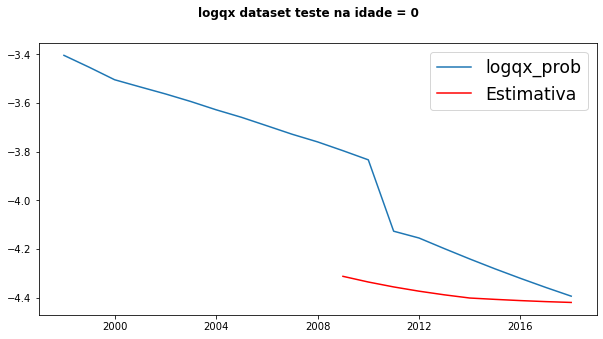

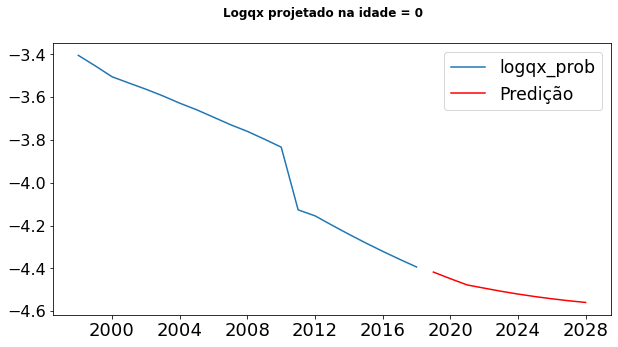

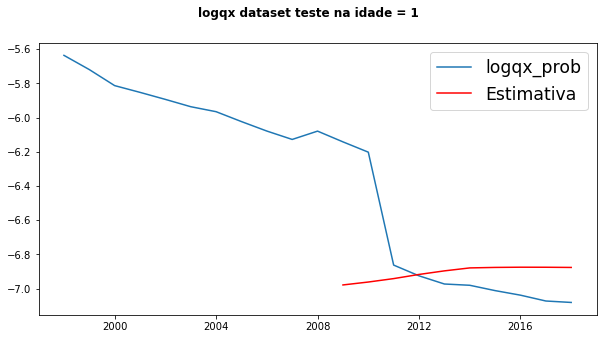

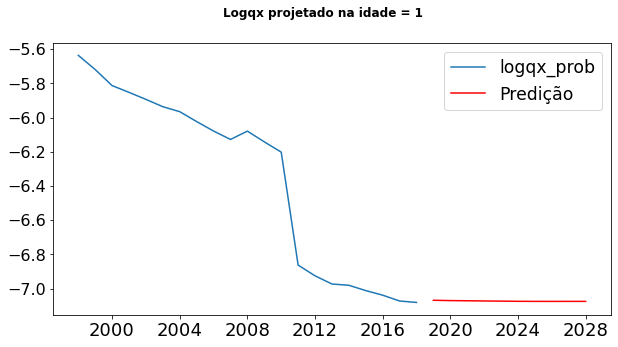

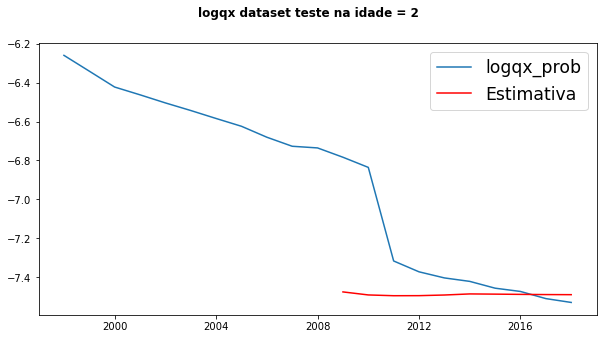

...

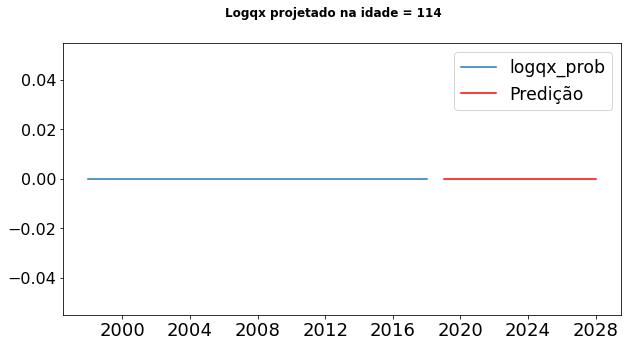

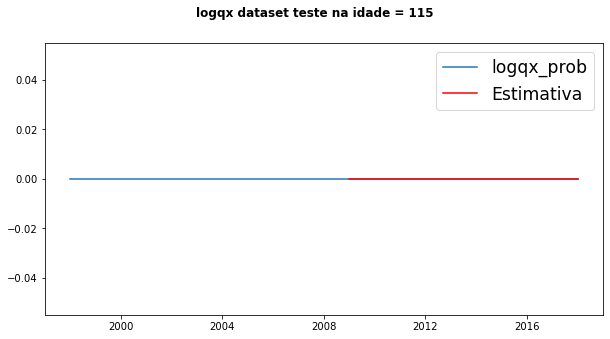

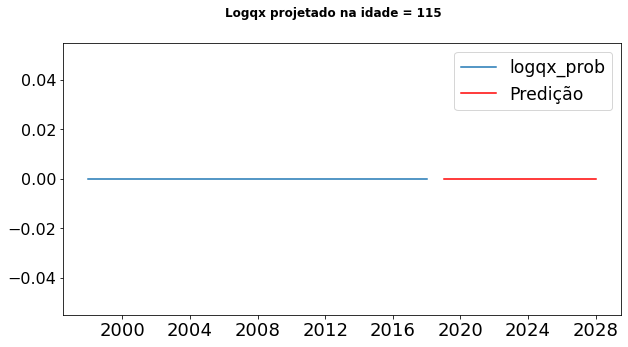

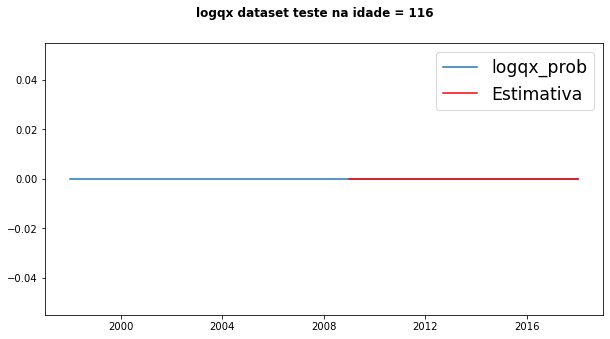

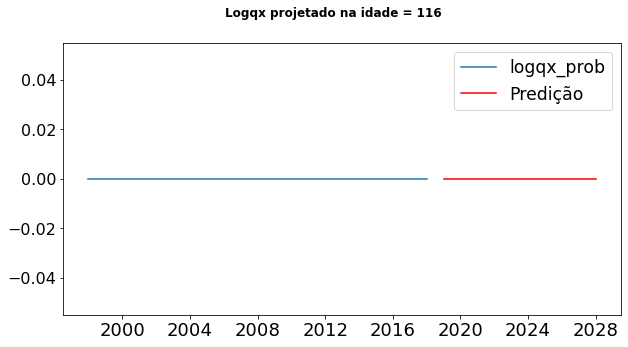

In [11]:
# proximos testes: n_epochs = 1000 e base teste de 3 anos. Sugestão. No programa em script. 
# Usar, também, o código para salvar o log do compilie
predict_res = []
pred_actual_rmse_res = []

w_max = max(df_dados['idade']) # definir maior idade nas tábuas. testes: 3

# inicio do cronometro do processamento
start = time.time()

n_input = 10 # 10 # Length of the output sequences (in number of timesteps). Corresponde ao número de dados 
# que usaremos para a rede. No caso, 10 anos na idade = 0, 10 anos na idade=1, etc.Vamos testar com 3 anos??
n_features = 1 # Número de features, variáveis. O modelo é univariavel (qx) para cada idade.
n_epochs = 500 # 1000 #500
n_batch = 2  # Number of timeseries samples in each batch (except maybe the last one).
n_neurons = 50
t_projecao = 10
# (#batch_size,#inputs,#features) 3D
for x in range(0, w_max+1):
    
    # Série para cada idade ao longo dos anos de 1998 a 2018
    #serie = df_lstm[df_lstm['idade']==x]['logqx_prob']
    serie = df_lstm[df_lstm['idade']==x]
    serie.drop(['idade', 'ano'], axis=1, inplace=True)

    # Separar base de treino e teste === preparar dados
    treino, teste = serie[:-3], serie[-3:]
    
    # Padronizar dados: Normalizar entre 0 e 1
    scaler = MinMaxScaler()
    scaler.fit(treino)
    treino = scaler.transform(treino)
    teste = scaler.transform(teste)
    
    #generator = TimeseriesGenerator(treino, treino, length=n_input, batch_size=n_batch)
    # length: The number of lag observations to use in the input portion of each sample (e.g. 3)
    # That is the desired number of lag observations to use as input = VAmos tentar 21: 2018-1998
    
    # batch_size: The number of samples to return on each iteration (e.g. 32)
    # The samples are not shuffled by default. This is useful for some recurrent neural networks
    # like LSTMs that maintain state across samples within a batch.
    # both the data and target for this generator is “treino”.
    
    generator = TimeseriesGenerator(treino, treino, length=n_input, batch_size=n_batch)
    
    # ============================ CAMADAS =========== CAMADAS =================================
    # A camada LSTM já possui, em sua construção, funções default de ativação:
    # activation="tanh",recurrent_activation="sigmoid",
    # três funções sigmoide e 1 tangente hiperbólica
    
    model = Sequential()
    
    # #reshape the data into LSTM required (#batch,#timesteps,#features)
    #Adding the first LSTM layer and some Dropout regularisation
    
    model.add(LSTM(n_neurons, activation='relu', input_shape=(n_input, n_features), return_sequences=True))
    #model.add(LSTM(n_neurons, activation='relu', input_shape=(n_input, n_features)))
    model.add(Dropout(0.20))
    
    # Adding a second LSTM layer and some Dropout regularisation
    model.add(LSTM(n_neurons))
    model.add(Dropout(0.20))
    
    # Adding a third LSTM layer and some Dropout regularisation
    #model.add(LSTM(n_neurons, return_sequences=True))
    #model.add(Dropout(0.20))

    # Adding a fourth LSTM layer and some Dropout regularisation
    #model.add(LSTM(n_neurons))
    #model.add(Dropout(0.20))
    
    # Adding the output layer
    model.add(Dense(1))
    
    # ============================ CAMADAS =========== CAMADAS =================================
    
    #model.add(Dense(y.shape[1], activation='sigmoid'))
    model.compile(optimizer='adam', loss='mse', metrics=["mae"])
    
    
    # fit model
    #model.fit_generator(generator, epochs=n_epochs)
    # ADAPTADO PARA A ATUALIZAÇÃO DO KERAS (28/11/2020)
    csv_logger = CSVLogger('log_modelo.csv', append=True, separator=';')
    model.fit(generator, epochs=n_epochs, callbacks=[csv_logger])
    # model.fit(X_train, Y_train, callbacks=[csv_logger])
    
    #Previsão
    pred_list = []
    batch = treino[-n_input:].reshape((1, n_input, n_features))

    for i in range(n_input):  # n_input
        pred_list.append(model.predict(batch)[0])
        batch = np.append(batch[:,1:,:], [[pred_list[i]]], axis=1)

    #inverse transform forecasts and test. Need to scale them back so we can compare the final results
    df_predict = pd.DataFrame(scaler.inverse_transform(pred_list), 
                            index=serie[-n_input:].index, columns=['Prediction'])
    
    df_teste = pd.concat([serie, df_predict], axis=1)

    # Gráfico da estimativa, com a base de teste
    #plt.figure(figsize=(10,5))
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111) # "111" means "1x1 grid, first subplot" 
    ax.plot(df_teste.index, df_teste['logqx_prob'])
    ax.plot(df_teste.index, df_teste['Prediction'], color='r')
    #ax.legend(loc='best', fontsize='xx-large')
    ax.legend(loc='best', fontsize='xx-large', labels=['logqx_prob', 'Estimativa'])
    fig.suptitle('logqx dataset teste na idade = %i' %x, fontweight="bold") # Título parametrizado com a idade
    plt.savefig(pasta_graficos + '/' + 'prev_test_idade'+str(x)+'.png')
    # plt.show()
    #plt.close(fig)
    
    
    pred_actual_rmse = rmse(df_teste.iloc[-n_input:, [0]], df_teste.iloc[-n_input:, [1]])
    print("rmse: ", pred_actual_rmse)
    
    
    pred_actual_rmse_res.append(pred_actual_rmse)
    
    treino = serie
    
    scaler.fit(treino)
    treino = scaler.transform(treino)
    
    #generator = TimeseriesGenerator(treino, treino, length=n_input, batch_size=n_batch)
    #model.fit_generator(generator,epochs=n_epochs)
    # ADAPTADO PARA A ATUALIZAÇÃO DO KERAS (28/11/2020)
    # length: The number of lag observations to use in the input portion of each sample (e.g. 3)
    # batch_size: The number of samples to return on each iteration (e.g. 32)
    
    generator = TimeseriesGenerator(treino, treino, length=n_input, batch_size=n_batch)
    
    #model.fit(generator, epochs=n_epochs, batch_size=n_batch)
    model.fit(generator, epochs=n_epochs)
        
    pred_list = []

    batch = treino[-n_input:].reshape((1, n_input, n_features))

    for i in range(n_input):   
        pred_list.append(model.predict(batch)[0]) 
        batch = np.append(batch[:,1:,:],[[pred_list[i]]],axis=1)
          
    # prever para t_projecao anos
    add_dates = [serie.index[-1] + DateOffset(years=x) for x in range(0, t_projecao + 1)]
    #add_dates = [serie.index[-1] + pd.offsets.YearBegin(x) for x in range(0,6)]
    future_dates = pd.DataFrame(index=add_dates[1:],columns=serie.columns)
    
    
    #inverse transform forecasts and test. Need to scale them back so we can compare the final results
    df_predict = pd.DataFrame(scaler.inverse_transform(pred_list),
                          index=future_dates[-n_input:].index, columns=['Prediction'])

    
    predict_res.append(df_predict.values.tolist())
    
    df_proj = pd.concat([serie,df_predict], axis=1)
    
    
    # plt.figure(figsize=(10, 5))
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)  # "111" means "1x1 grid, first subplot"
    ax.plot(df_proj.index, df_proj['logqx_prob'])
    ax.plot(df_proj.index, df_proj['Prediction'], color='r')
    ax.legend(loc='best', fontsize='xx-large', labels=['logqx_prob', 'Predição'])
    
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=16)
    fig.suptitle('Logqx projetado na idade = %i' %x, fontweight = "bold") # Título parametrizado com a idade
    # plt.title('Logqx projetado na idade = %i' %x) # Título parametrizado com a idade
    plt.savefig(pasta_graficos + '/' + 'proj_log_qx'+str(x)+'.png')
    # plt.show()


# fim do cronometro do processamento

end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print()
print('Tempo de processamento:')
print('{:0>2}:{:0>2}:{:05.2f}'.format(int(hours), int(minutes), seconds))
print()



#### 5 - Valores de RMSE por idade

In [12]:
pd.DataFrame(pred_actual_rmse_res) # RMSE para cada idade

,0
0,0.266168
1,0.377559
2,0.311047
3,0.235375
4,0.195237
...,...
112,0.000000
113,0.000000
114,0.000000
115,0.000000


In [52]:
#### 5 - Base resultante dos anos de 2019 a 2028, por idade

In [13]:
df_lstm_res = pd.DataFrame(predict_res)

In [14]:
df_lstm_res.head()

,0,1,2,3,4,5,6,7,8,9
0,[-4.417372313321643],[-4.448255619759773],[-4.477625255156622],[-4.492499794076864],[-4.507038059945566],[-4.52018319881321],[-4.5318749681469725],[-4.542277199328333],[-4.551456622093842],[-4.5594060710321065]
1,[-7.0679005779372925],[-7.069730276235746],[-7.070851832725974],[-7.071918028964767],[-7.072951377259739],[-7.073948098643901],[-7.074371106088258],[-7.0744409792955345],[-7.074355236580166],[-7.0743197939610045]
2,[-7.544301438015195],[-7.55537184905212],[-7.563137704894283],[-7.5663616298491005],[-7.568886180042254],[-7.571077932131642],[-7.573176868764409],[-7.57490170979938],[-7.576352940767544],[-7.5773104343128]
3,[-7.812453010656882],[-7.8262594710684015],[-7.837664560779856],[-7.842011683907073],[-7.845374479393522],[-7.84842404304764],[-7.851085523426996],[-7.853076109704402],[-7.854967254685311],[-7.856191392998321]
4,[-8.021390071947316],[-8.037822831862083],[-8.05429457679963],[-8.060707124470344],[-8.066168633015801],[-8.071682621399612],[-8.076639177869565],[-8.080699870646239],[-8.08465415486463],[-8.087641327480783]


In [15]:
df_lstm_res[0][0][0]

-4.417372313321643

In [16]:
df_lstm_res.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       117 non-null    object
 1   1       117 non-null    object
 2   2       117 non-null    object
 3   3       117 non-null    object
 4   4       117 non-null    object
 5   5       117 non-null    object
 6   6       117 non-null    object
 7   7       117 non-null    object
 8   8       117 non-null    object
 9   9       117 non-null    object
dtypes: object(10)
memory usage: 9.3+ KB


In [17]:
# Função para unir as listas em linha
def unirSeries(df, explode):
    idx = df.index.repeat(df[explode[0]].str.len())
    df1 = pd.concat([
        pd.DataFrame({x: np.concatenate(df[x].values)}) for x in explode], axis=1)
    df1.index = idx

    return df1.join(df.drop(explode, 1), how='left')

In [18]:
colunas = np.arange(2019, 2029)
df_temp = pd.DataFrame(predict_res, columns=colunas)
df_lstm_res = unirSeries(df_temp,colunas)
df_lstm_res = df_lstm_res.reset_index(drop=True)

In [19]:
df_lstm_res.head()

,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,-4.417372,-4.448256,-4.477625,-4.492500,-4.507038,-4.520183,-4.531875,-4.542277,-4.551457,-4.559406
1,-7.067901,-7.069730,-7.070852,-7.071918,-7.072951,-7.073948,-7.074371,-7.074441,-7.074355,-7.074320
2,-7.544301,-7.555372,-7.563138,-7.566362,-7.568886,-7.571078,-7.573177,-7.574902,-7.576353,-7.577310
3,-7.812453,-7.826259,-7.837665,-7.842012,-7.845374,-7.848424,-7.851086,-7.853076,-7.854967,-7.856191
4,-8.021390,-8.037823,-8.054295,-8.060707,-8.066169,-8.071683,-8.076639,-8.080700,-8.084654,-8.087641


In [20]:
df_forecast_res_exp = pd.DataFrame(np.exp(df_lstm_res))

In [21]:
df_forecast_res_exp.head()

,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,0.012066,0.011699,0.011360,0.011193,0.011031,0.010887,0.010760,0.010649,0.010552,0.010468
1,0.000852,0.000850,0.000850,0.000849,0.000848,0.000847,0.000847,0.000846,0.000847,0.000847
2,0.000529,0.000523,0.000519,0.000518,0.000516,0.000515,0.000514,0.000513,0.000512,0.000512
3,0.000405,0.000399,0.000395,0.000393,0.000392,0.000390,0.000389,0.000389,0.000388,0.000387
4,0.000328,0.000323,0.000318,0.000316,0.000314,0.000312,0.000311,0.000309,0.000308,0.000307


In [ ]:
# Gravar resultados

In [22]:
df_forecast_res_exp.to_csv(pasta_resultados + '/' + 'lstm_previsao_qx_500.csv')

In [23]:
pd.DataFrame(pred_actual_rmse_res).to_csv(pasta_resultados + '/' + 'pred_actual_rmse_res_500.csv', header=['RMSE'])